# Speech Understanding - Major Project

## Enhancing Voice Activity Detection in Noisy Environments

    Ayush Abrol B20AI052
    Aryan Tiwari B20AI056

---

In [93]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa 
from scipy.fft import fft
import soundfile as sf
from gridtk.tools import get_array_job_slice
from tqdm import tqdm

import argparse
import errno
from numpy.lib.stride_tricks import as_strided as ast

### ZFF

In [3]:
def run_mean(sig, N, wintype="RECT"):
    """
    Computes and returns the moving average and sum of
    a window on the input signal `sig`.

    Parameters
    ----------
    sig : numpy.ndarray
        Input signal.
    N : float
        [description]
    wintype : str, optional
        Window type [Rectangular, Hamming, Hanning], by default 'RECT'

    Returns
    -------
    tuple
        The average and sum in the moving window.
    """

    M = len(sig)
    Nby2 = int(N / 2)
    Ntail = N - Nby2 - 1

    if wintype in ("REC", "RECT", "rec", "rect", "1"):
        h = np.ones(N)
    elif wintype in ("HAM", "HAMM", "ham", "hamm", "2"):
        h = np.hamming(N)
    elif wintype in ("HAN", "HANN", "han", "hann", "3"):
        h = np.hanning(N)
    else:
        print("Error : Unknown window type!")
        exit(1)

    x = np.convolve(sig, h)
    ysum = x[Nby2 : M + N - 1 - Ntail]

    xdiv = np.convolve(np.ones(len(sig)), h)
    x = x / xdiv
    yavg = x[Nby2 : M + N - 1 - Ntail]

    return yavg, ysum


def buffer(x, n, p=0, opt=None):
    """Buffer signal vector into an array of data frames.

    Parameters
    ----------
    x: numpy.ndarray
        Signal array
    n: int
        Length of data segments (frames)
    p: int
        Number of values to overlap
    opt: str
        Initial condition options. default sets the first `p` values to zero,
        while 'nodelay' begins filling the buffer immediately.

    Returns
    -------
    result : (n,n) numpy.ndarray
        Buffer array created from X.
    """

    if opt not in ("nodelay", None):
        raise ValueError("{} not implemented".format(opt))

    i = 0
    if opt == "nodelay":
        # No zeros at array start
        result = x[:n]
        i = n
    else:
        # Start with `p` zeros
        result = np.hstack([np.zeros(p), x[: n - p]])
        i = n - p

    if len(x) < n:
        result = np.hstack([result, np.zeros(n - len(x))])

    # Make 2D array, cast to list for .append()
    result = list(np.expand_dims(result, axis=0))

    while i < len(x):
        # Create next column, add `p` results from last col if given
        col = x[i : i + (n - p)]
        if p != 0:
            col = np.hstack([result[-1][-p:], col])

        # Append zeros if last row and not length `n`
        if len(col):
            col = np.hstack([col, np.zeros(n - len(col))])

        # Combine result with next row
        result.append(np.array(col))
        i += n - p

    return np.vstack(result).T


def gauss_win(N, a=2.5):
    """Exponentially scaled Gaussian window.

    Parameters
    ----------
    N : int
        Window length.
    a : float, optional
        Width factor, specified as a positive real scalar alpha.
        It is inversely proportional to the width of the window.

    Returns
    -------
    w : ndarray
        The scaled Gaussian window.
    """

    a = np.asarray(a)
    N = np.asarray(N)
    if np.any(N != np.round(N)) or np.any(N < 0):
        raise ValueError("Window length N must be a non-negative integer")
    if N.size == 0 or a.size == 0:
        return np.ones(N.shape)
    N = N.item()
    a = a.item()
    L = N - 1
    n = np.arange(0, L + 1) - L / 2
    w = np.exp(-(1 / 2) * (a * n / (L / 2)) ** 2)
    return w


def block_view(A, block_size):
    """
    Provides a 2D block view of a 2D array. No error checking made.
    Therefore meaningful (as implemented) only for blocks strictly
    compatible with the shape of A.

    Parameters
    ----------
    A : numpy.ndarray
        Buffer.
    block_size : tuple
        Block size.

    Returns
    -------
    numpy.ndarray
        Strided view of the buffer `A`.
    """



    shape = (
        A.shape[0] // block_size[0],
        A.shape[1] // block_size[1],
    ) + block_size
    strides = (
        block_size[0] * A.strides[0],
        block_size[1] * A.strides[1],
    ) + A.strides
    return ast(A, shape=shape, strides=strides)


def autocorr(x):
    """Returns auto-correlation of a signal `x`.

    Parameters
    ----------
    x : numpy.ndarray
        Input signal.

    Returns
    -------
    numpy.ndarray
        Auto-correlation of input signal.
    """
    result = np.correlate(x, x, mode="full")
    result = result[result.size // 2 :]
    result = result / np.max(np.abs(result))
    return result


def xcorrWinLen(wav, fs):
    """Returns the cross-correlation of two discrete-time sequences.
    Cross-correlation measures the similarity between a vector x
    and shifted (lagged) copies of a vector y as a function of the lag.
    If x and y have different lengths, the function appends zeros to the
    end of the shorter vector so it has the same length as the other.


    Parameters
    ----------
    wav : numpy.ndarray
        Input signal.
    fs : int
        Sampling frequency of the input signal `wav`.

    Returns
    -------
    _type_
        Cross-correlation of two discrete-time sequences.
    """
    zfSig = zeroFreqFilter(wav, fs, 2)
    zfSig = zfSig / np.max(np.abs(zfSig))

    frameSize = 30 * fs // 1000
    frameShift = 20 * fs // 1000

    en = np.convolve(zfSig**2, np.ones(frameSize))
    en = en[(frameSize // 2) - 1 : len(en) - frameSize // 2]
    en = en / frameSize
    en = np.sqrt(en)
    en = (en > max(en) / 5) * 1
    buff = buffer(zfSig, frameSize, frameShift, "nodelay")
    vad = np.sum(buffer(en, frameSize, frameShift, "nodelay"), axis=0)
    out = block_view(buff, (frameSize, 1)).squeeze()

    autocorr_out = []
    for row in out:
        autocorr_out.append(
            list(
                autocorr((row - np.mean(row)) * np.hamming(len(row)))
                / autocorr(np.hamming(len(row)))
            )
        )
    autocorr_out = np.array(autocorr_out).T

    minPitch = 3  # 2 ms == 500 Hz.
    maxPitch = 16  # 16 ms == 66.66 Hz.

    term = autocorr_out[
        (minPitch * fs // 1000) - 1 : (maxPitch * fs // 1000), :
    ]
    # maxv = term.max(0)
    maxi = np.argmax(term, 0)

    step = 0.5

    # Get bin centres, and convert them to edges for `np.histogram`
    x = np.arange(minPitch, maxPitch + 0.5, step) * fs // 1000 + 2
    x = list(x - np.diff(x)[0] // 2) + [x[-1] + np.diff(x)[0] // 2]

    # Get the y-values, and normalize
    pLoc = maxi[vad > frameSize * 0.8] + minPitch * fs // 1000
    y = np.histogram(pLoc, x)[0]
    y = y / len(pLoc)

    # val = y.max()
    idx = y.argmax()

    # Extra +1 because altho Matlab -> Python indices are different,
    # and we are using this number as an actual length
    idx = np.around(idx / 2) + minPitch + 1 + 1

    return idx


def remTrend(sig, winSize):
    """Remove trend from given signal `sig` using a window of
    size `winSize` and applying convolution.

    Parameters
    ----------
    sig : numpy.ndarray
        Input signal.
    winSize : [type]
        Window size used to compute the trend removal window.

    Returns
    -------
    numpy.ndarray
        The signal after processing it for trend-removal.
    """
    window = np.ones(winSize)
    rm = np.convolve(sig, window, "same")
    norm = np.convolve(np.ones(len(sig)), window, "same")
    rm = rm / norm
    out = sig - rm
    return out


def get_zff(x, fs, multiple_dx, zfsig_window_len=None):
    """Returns the ZFF and modZFF scores for the input signal.

    Parameters
    ----------
    x : numpy.ndarray
        Input signal
    f : int
        Sampling frequency

    Returns
    -------
    tuple
        ZFF and modZFF scores.
    """
    if multiple_dx:
        dx = np.array(
            list(np.diff(np.diff(np.diff(np.diff(x))))) + [0, 0, 0, 0]
        )
    else:
        dx = np.array(list(np.diff(x)) + [0])

    z1, gci, _, _, winLen = zfsig(x, fs, zfsig_window_len)
    z2, _, _, _, _ = zfsig(x, fs, 0.2 * winLen)
    z3, _, _, _, _ = zfsig(x, fs, 0.1 * winLen)

    return z1, z2, z3, gci


def zfsig(wav, fs, winLength=None):
    """
    Returns a tuple of the ZFF signal `zf`, glottal closure instances `gci`,
    epoch strength `es`, fundamental frequency `f0`, and the window length `winLength`.

    Parameters
    ----------
    wav : numpy.ndarray
        The input signal.
    fs : int
        Sampling frequency of the input signal `wav`.
    winLength : int, optional
        Window length, by default `None`.

    Returns
    -------
    tuple
        ZFF signal, glottal closure instances, es,
        fundamental frequency, and the window length.
    """
    if winLength == None:
        winLength = xcorrWinLen(wav, fs)
        winLength = 1.2 * winLength
    zf = zeroFreqFilter(wav, fs, winLength)

    # Zero crossings
    zcs = np.where(np.diff((zf > 0)) == 1)[0]

    # Neg-to-pos zero crossings only
    gci = np.array([zc for zc in zcs if zf[zc - 1] < 0 and zf[zc + 1] > 0])
    es = np.abs(zf[gci + 1] - zf[gci - 1])
    T0 = np.diff(gci)
    T0 = T0 / fs
    f0 = 1.0 / T0

    return zf, gci, es, f0, winLength


def zeroFreqFilter(wav, fs, winLength):
    """Computes and returns the ZFF signal to the input `wav` signal.

    Parameters
    ----------
    wav : numpy.ndarray
        Input signal.
    fs : int
        Sampling frequency of `wav`.
    winLength : int
        Window length for trend removal.

    Returns
    -------
    _type_
        _description_
    """
    dwav = np.diff(wav)
    dwav = np.append(dwav, dwav[-1])
    dwav /= np.max(np.abs(dwav))
    N = len(dwav)

    zfSig = np.cumsum(np.cumsum(np.cumsum(np.cumsum(dwav))))
    winLength = round(winLength * fs / 1000)

    zfSig = remTrend(zfSig, winLength)
    zfSig = remTrend(zfSig, winLength)
    zfSig = remTrend(zfSig, winLength)
    zfSig = remTrend(zfSig, winLength)

    zfSig[(N - winLength * 2) - 1 : N] = 0
    zfSig[0 : winLength * 2] = 0

    return zfSig


def a_zff_norm_sig(s1, fs, signal_length=10, zfsig_window_len=None):
    """Computes and returns the ZFF scores for VAD.

    Parameters
    ----------
    s1 : numpy.ndarray
        Raw input signal.
    f : int
        Sample rate of audio file.

    Returns
    -------
    numpy.ndarray
        ZFF scores on the input signal `s1` for VAD.
    """

    # Get ZFF values
    # If the signal longer than 10s, segment signal each 10s and
    # accumulate the ZFF and modified ZFF together
    if len(s1) / fs > signal_length:
        sB = buffer(s1, signal_length * fs, 0, "nodelay")
        _, n = sB.shape
        z1 = []
        z2 = []
        z3 = []
        for l1 in range(n):
            x = sB[:, l1]
            temp_z1, temp_z2, temp_z3, gci = get_zff(
                x, fs, multiple_dx=False, zfsig_window_len=zfsig_window_len
            )

            # Append
            z1.append(list(temp_z1))
            z2.append(list(temp_z2))
            z3.append(list(temp_z3))
    else:
        z1, z2, z3, gci = get_zff(
            s1, fs, multiple_dx=False, zfsig_window_len=zfsig_window_len
        )

    # Flatten
    z1 = np.array(z1).ravel()
    z2 = np.array(z2).ravel()
    z3 = np.array(z3).ravel()

    # Normalize
    z1 /= np.max(np.abs(z1))
    z2 /= np.max(np.abs(z2))
    z3 /= np.max(np.abs(z3))

    return z1, z2, z3, gci


def get_spectrum(s, fs, frameLen_s, frameShift_s):
    """Computes and returns the spectrum of an input signal `s`.

    Parameters
    ----------
    s : numpy.ndarray
        Input signal on which FFT is computed.
    fs : int
        Sampling frequency of the signal `s`.
    frameLen_s : int
        Frame length of `s` for buffering the signal.
    frameShift_s : int
        Frame shift of `s` for buffering the signal.

    Returns
    -------
    numpy.ndarray
        The spectrum of the input signal `s`.
    """
    
    frameLen = frameLen_s * fs // 1000
    frameShift = frameShift_s * fs // 1000
    b_x = buffer(s, frameLen, frameShift, "nodelay")
    f_x = fft(b_x, 1024, axis=0)
    x = np.abs(f_x[:512, :])
    return x


def specEnt(x):
    """Computes the entropy of the given spectrum signal `x`.

    Parameters
    ----------
    x : numpy.ndarray
        The spectrum of a given signal.

    Returns
    -------
    numpy.ndarray
        The entropy of input spectrum.
    """
    r, c = x.shape
    ent = np.zeros(c)
    for i in range(c):
        sp = x[:r, i] ** 2
        sp = sp / np.sum(sp, axis=-1, keepdims=True)
        min_nonzero = np.min(sp[np.nonzero(sp)])
        sp[sp == 0] = min_nonzero
        ent[i] = -np.sum(np.multiply(sp, np.log2(sp)), axis=-1)
    return ent


def getEntropy(s, fs, frameLen_s=30, frameShift_s=15):
    """Calculates the spectrum of the given signal `s`,
    and returns its entropy.

    Parameters
    ----------
    s : numpy.ndarray
        Input signal on which we compute its spectral entropy.
    fs : int
        Sampling frequency of the signal `s`.
    frameLen_s : int, optional
        Frame length of `s` for buffering the signal, by default 30
    frameShift_s : int, optional
        Frame shift of `s` for buffering the signal, by default 15

    Returns
    -------
    numpy.ndarray
        The spectral entropy of an input signal.
    """
    x = get_spectrum(s, fs, frameLen_s, frameShift_s)
    entropy = specEnt(x)
    return entropy


def create_th(x, winT=10 * 8):
    """Creates a threshold for the input decision surface `x`.

    Parameters
    ----------
    x : numpy.ndarray
        Decision surface on which a threshold is calculated.
    winT : int, optional
        Frame length for buffer, by default 10*8

    Returns
    -------
    numpy.ndarray
        Threshold calculated on the input decision surface.
    """
    bx = buffer(x, winT, 0, "nodelay")
    th = np.min(bx, axis=0) + (np.median(bx, axis=0) / 3)
    th = np.kron(np.ones((winT, 1)), th)
    th = th.T.flatten()
    return th[: len(x)]


def zff_cs(s, fs, verbose=False):
    """
    ZFF CS method returns the composite signal which is
    the sum of the y0, y1 and y2 signals, which capture
    f0 (source), F1 and F2 (system) information respectively.

    Parameters
    ----------
    s : numpy.ndarray
        Raw speech signal.
    fs : int
        Sampling frequency of `s`.
    verbose : bool

    Returns
    -------
    numpy.ndarray
        The composite signal `c_s`.

    tuple (if verbose=True)
        Tuple containing the composite signal `c_s`,
        the three ZFF signals `y0`, `y1`, `y2`,
        as well as the `gci` locations.
    """

    # Create ZFF signals, from z1 to z4 by modifying trend appropriately
    y0, y1, y2, gci = a_zff_norm_sig(s, fs)

    # Sum to create the composite signal, and normalize
    c_s = y0 + y1 + y2
    c_s /= np.max(np.abs(c_s))

    if verbose:
        return c_s, y0, y1, y2, gci
    else:
        return c_s


def zff_vad(s, fs, spectralEntropy=False, thetaScale=1.0):
    """
    ZFF VAD method demarcates voiced regions using
    a composite signal composed of different zero-frequency
    filtered signals by combining the filter outputs together
    to compose a composite signal carrying f0, F1, and F2 related
    information, and then applying a dynamic threshold after
    spectral entropy-based weighting.

    Parameters
    ----------
    s : numpy.ndarray
        Raw speech signal.
    fs : int
        Sampling frequency of `s`.
    verbose : bool

    Returns
    -------
    numpy.ndarray
        The ZFF-based VAD decision boundary.
    """

    _, y0, y1, y2, _ = zff_cs(s, fs, verbose=True)
    runMean_win = 40 * fs // 1000

    # Weigh normalized ZFF and modZFF with their gradients
    d0 = np.multiply(y0, np.array(list(np.diff(y0)) + [0]))
    d1 = np.multiply(y1, np.array(list(np.diff(y1)) + [0]))
    d2 = np.multiply(y2, np.array(list(np.diff(y2)) + [0]))

    # Normalize signals
    d0 /= np.max(np.abs(d0))
    d1 /= np.max(np.abs(d1))
    d2 /= np.max(np.abs(d2))

    # Smooth signals
    r0 = run_mean(np.abs(d0), runMean_win)[0]
    r1 = run_mean(np.abs(d1), runMean_win)[0]
    r2 = run_mean(np.abs(d2), runMean_win)[0]

    # Normalize
    r0 /= np.max(np.abs(r0))
    r1 /= np.max(np.abs(r1))
    r2 /= np.max(np.abs(r2))

    # Sum to create the summed evidences, and normalize
    r = r0 + r1 + r2
    r /= np.max(np.abs(r))

    if spectralEntropy:
        # Derive inverse spectral entropy over a 30ms block
        entropy = getEntropy(s, fs)
        entropy = np.log(entropy) - 1
        entropy = 1 / entropy

        # Resample spectral entropy over total length of the signal
        nA = np.ceil(len(r) / len(entropy)).astype("int")  # len(s)
        cx = np.tile(entropy.T, (nA, 1))
        cx = cx.T.ravel()
        cx = cx[: len(r)]  # len(s)
        cx /= np.max(np.abs(cx))
        cx = run_mean(np.abs(cx), 40 * fs // 1000)[0]

        # Weigh decision surface with inverse spectral entropy
        decisionSurface = np.multiply(cx, r)

    else:
        decisionSurface = r

    # Calculate threshold for entropy weighed decision surface
    theta = create_th(decisionSurface, winT=80 * fs // 1000)

    # Threshold the decision surface with the calculated theta
    voicedRegions = (decisionSurface > (theta * thetaScale)) * 1

    return voicedRegions

### Utility Functions

In [4]:
def load_audio(fileName, sr=None, dtype="float64"):
    """Loads an audio file with librosa.

    Parameters
    ----------
    fileName_ : str
        Path to an audio file.
    sr : int
        Sampling frequency of the audio file given with `fileName`.

    Returns
    -------
    tuple
        Returns a tuple of (sampling frequency, audio signal)
    """
    if sr == "None":
        sr = None
    elif sr is None:
        pass
    else:
        sr = int(sr)
    sig, fs = librosa.load(fileName, mono=True, sr=sr, dtype=dtype)
    sig /= np.max(np.abs(sig))
    return fs, sig


def read_all_files(wavfolder, ext):
    """Reads all `.wav` files given in `wavfolder`.

    Parameters
    ----------
    wavfolder : str
        Path to the folder containing `.wav` files.

    Returns
    -------
    list
        Returns a list of paths to all the `.wav` files.
    """
    return librosa.util.find_files(wavfolder, ext=ext)


def save_segments(output_path, fname_short, segments):
    """Saves the predicted segments as .csv file.

    Parameters
    ----------
    output_path : str
        Directory path to save the generated .csv file.
    fname_short : str
        File name of the .csv which will be the same as the read audio file.
    segments : list
        List containing the predicted segments in seconds.
    """
    np.savetxt(
        os.path.join(output_path, fname_short + ".csv"),
        segments,
        delimiter=",",
        fmt="%s",
    )


def file_parent_dir():
    """Get the parent directory of this file"""
    return str(Path(__file__).resolve().parent)


def sample2time(s, fs, boundary):
    """Converts given `boundary` from sample domain
    to time domain.

    Parameters
    ----------
    s : numpy.ndarray
        Input signal.
    fs : int
        Sampling frequency of `s`.
    boundary : numpy.ndarray
        Calculated decision boundary.

    Returns
    -------
    numpy.ndarray
        List of segments in seconds format easily exportable as a .csv file.
    """
    indices = np.where(np.diff(boundary, prepend=np.nan))[0]
    fgt = boundary.shape[0] * (fs / s.shape[0])  # scale

    lst = []
    for i in range(len(indices) - 1):
        start = indices[i]
        end = indices[i + 1]

        start_s = start / fgt
        end_s = end / fgt

        segment = boundary[start:end]
        status = set(segment)  # 0 or 1

        if next(iter(status)) == 1:
            lst.append([start_s, end_s])

    return np.array(lst)


def smooth_decision(s, sr, mergeFactor=5, outlierFactor=10):
    """Smoothens the VAD decision signal.

    Parameters
    ----------
    x : numpy.ndarray
        The binary VAD signal.
    winA : int
        Window size using for smoothing `x` by merging close proximity segments.
    winB : int
        Window size using for smoothing `x` by removing small duration outlier segments.

    Returns
    -------
    numpy.ndarray
        Smoothed binary VAD signal.
    """
    winA = sr // mergeFactor
    winB = sr // outlierFactor
    x = np.copy(s)
    # Window A
    x[0] = 0
    x[-1] = 0
    aDiffLine = np.where(np.diff(x))[0]
    aDiffBuff = np.array(buffer(aDiffLine[1:-1], 2, 0, "nodelay"))
    idx = np.where((np.diff(aDiffBuff, axis=0) < winA) * 1)[1]
    aDiffBuff = aDiffBuff[:, idx]
    n = aDiffBuff.shape[1]
    for i in range(n):
        x[int(aDiffBuff[0, i]) - 1 : int(aDiffBuff[1, i]) + 1] = 1

    # Window B
    x[0] = 0
    x[-1] = 0
    aDiffLine = np.where(np.diff(x))[0]
    aDiffBuff = np.array(buffer(aDiffLine, 2, 0, "nodelay"))
    idx = np.where(abs(np.diff(aDiffBuff, axis=0) < winB) * 1)[1]
    for i in range(len(idx)):
        if (aDiffBuff[1, idx[i]] != 0) and (aDiffBuff[0, idx[i]] != 0):
            x[int(aDiffBuff[0, idx[i]]) - 1 : int(aDiffBuff[1, idx[i]]) + 1] = 0
    # Return
    return x

In [89]:
def flac_to_wav(flac_file_path, wav_file_path):
    y, sr = librosa.load(flac_file_path, sr=None)
    sf.write(wav_file_path, y, sr)

In [83]:
audio_folder = "./data/musan/musan/noise/sound-bible/"
segment_array = {}
for file in os.listdir(audio_folder):
    if file.endswith(".wav"):
        sr, audio = load_audio(os.path.join(audio_folder, file))
        boundary = zff_vad(audio, sr)
        boundary = smooth_decision(boundary, sr)
        segments = sample2time(audio, sr, boundary)
        segment_array[file] = segments

C:\Users\Ayush Abrol\AppData\Local\Temp\ipykernel_16700\1386825188.py:180: RuntimeWarning: invalid value encountered in divide
  result = result / np.max(np.abs(result))


In [85]:
segment_array

{'noise-sound-bible-0000.wav': array([[0.0284375, 1.52     ],
        [1.7590625, 2.1910625],
        [2.8      , 3.84     ],
        [4.16     , 6.749875 ]]),
 'noise-sound-bible-0001.wav': array([[1.44   , 2.06125]]),
 'noise-sound-bible-0002.wav': array([[0.0368125, 1.0439375]]),
 'noise-sound-bible-0003.wav': array([[0.0351875, 6.5566875]]),
 'noise-sound-bible-0004.wav': array([[0.0165735 , 6.894576  ],
        [7.08396277, 7.203948  ],
        [7.41798785, 7.557516  ],
        [8.66220883, 8.750808  ],
        [9.48898478, 9.59046294]]),
 'noise-sound-bible-0005.wav': array([[ 0.02438948,  0.26107208],
        [ 0.39360503,  0.8970984 ],
        [ 1.1688336 ,  1.37073503],
        [ 1.6685658 ,  1.83940845],
        [ 2.42060693,  2.63270618],
        [ 3.027552  ,  3.14810348],
        [ 3.35783745,  3.48591128],
        [ 3.920928  ,  4.12096823],
        [ 4.45784543,  4.5407076 ],
        [ 5.062464  ,  5.67096008],
        [ 5.84955773,  6.4307562 ],
        [ 6.80861858,  7

In [88]:
segment_list = [i for i in segment_array.values()]
segment_list

[array([[0.0284375, 1.52     ],
        [1.7590625, 2.1910625],
        [2.8      , 3.84     ],
        [4.16     , 6.749875 ]]),
 array([[1.44   , 2.06125]]),
 array([[0.0368125, 1.0439375]]),
 array([[0.0351875, 6.5566875]]),
 array([[0.0165735 , 6.894576  ],
        [7.08396277, 7.203948  ],
        [7.41798785, 7.557516  ],
        [8.66220883, 8.750808  ],
        [9.48898478, 9.59046294]]),
 array([[ 0.02438948,  0.26107208],
        [ 0.39360503,  0.8970984 ],
        [ 1.1688336 ,  1.37073503],
        [ 1.6685658 ,  1.83940845],
        [ 2.42060693,  2.63270618],
        [ 3.027552  ,  3.14810348],
        [ 3.35783745,  3.48591128],
        [ 3.920928  ,  4.12096823],
        [ 4.45784543,  4.5407076 ],
        [ 5.062464  ,  5.67096008],
        [ 5.84955773,  6.4307562 ],
        [ 6.80861858,  7.69718648],
        [11.46041655, 11.564256  ]]),
 array([[0.0354375, 0.764125 ]]),
 array([[1.36451250e-02, 2.34481162e+00],
        [2.52298800e+00, 3.04918087e+00],
        [3.2

In [72]:
# sr, audio = load_audio("audio.wav")
# # Get segments
# boundary = zff_vad(audio, sr)
# print("ZFF VAD: ", boundary)
# # Smooth
# boundary = smooth_decision(boundary, sr)
# print("Smooth Decision: ", boundary)
# # Convert from sample to time domain
# segments = sample2time(audio, sr, boundary)
# print("Segments:", segments)
# # Save as .csv file
# save_segments("segments", "audio", segments)

ZFF VAD:  [0 0 0 ... 1 1 1]
Smooth Decision:  [0 0 0 ... 1 1 0]
Segments: [[0.0118125 3.9899375]]


In [90]:
signal_array = {}
signal_list = []
for file in os.listdir(audio_folder):
    if file.endswith(".wav"):
        fs, audio = load_audio(os.path.join(audio_folder, file))
        composite = zff_cs(audio, fs)
        composite, y0, y1, y2, gcis = zff_cs(audio, fs, verbose=True)
        signal_array[file] = [composite, y0, y1, y2, gcis]
        signal_list.append([composite, y0, y1, y2, gcis])

C:\Users\Ayush Abrol\AppData\Local\Temp\ipykernel_16700\1386825188.py:180: RuntimeWarning: invalid value encountered in divide
  result = result / np.max(np.abs(result))


In [91]:
signal_array

{'noise-sound-bible-0000.wav': [array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([   210,    294,    394, ..., 107449, 107574, 107721], dtype=int64)],
 'noise-sound-bible-0001.wav': [array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([  420,   540,   744, ..., 32334, 32526, 32638], dtype=int64)],
 'noise-sound-bible-0002.wav': [array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([  364,   491,   614,   718,   898,  1027,  1228,  1335,  1435,
          1501,  1600,  1696,  1777,  1873,  2026,  2206,  2298,  2395,
          2476,  2567,  2633,  2733,  2908,  2986,  3119,  3296,  3338,
          3461,  3522,  3643,  3720,  3812,  3912,  4070,  4147,

In [92]:
signal_list

[[array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([   210,    294,    394, ..., 107449, 107574, 107721], dtype=int64)],
 [array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([  420,   540,   744, ..., 32334, 32526, 32638], dtype=int64)],
 [array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([0., 0., 0., ..., 0., 0., 0.]),
  array([  364,   491,   614,   718,   898,  1027,  1228,  1335,  1435,
          1501,  1600,  1696,  1777,  1873,  2026,  2206,  2298,  2395,
          2476,  2567,  2633,  2733,  2908,  2986,  3119,  3296,  3338,
          3461,  3522,  3643,  3720,  3812,  3912,  4070,  4147,  4245,
          4365,  4409,  4480,  4578,  4680,  4813,  4940,  5030,  5137,
          

In [25]:
# # Read audio at native sampling rate
# fs, audio = load_audio("audio.wav")

# # Get composite signal
# composite = zff_cs(audio, sr)

# # Get all signals
# composite, y0, y1, y2, gcis = zff_cs(audio, sr, verbose=True)

In [117]:
# Get the first signal key from the signal dictionary

audio_name = list(signal_array)[0]
fs, audio = load_audio(os.path.join(audio_folder, audio_name))

composite, y0, y1, y2, gcis = signal_array[audio_name]

In [118]:
print(audio.shape, composite.shape, y0.shape, y1.shape, y2.shape, gcis.shape)

(107999,) (107999,) (107999,) (107999,) (107999,) (1455,)


In [120]:
print(audio, composite, y0, y1, y2, gcis)

[-3.05185095e-05  0.00000000e+00  0.00000000e+00 ...  3.05185095e-05
  0.00000000e+00  0.00000000e+00] [0. 0. 0. ... 0. 0. 0.] [0. 0. 0. ... 0. 0. 0.] [0. 0. 0. ... 0. 0. 0.] [0. 0. 0. ... 0. 0. 0.] [   210    294    394 ... 107449 107574 107721]


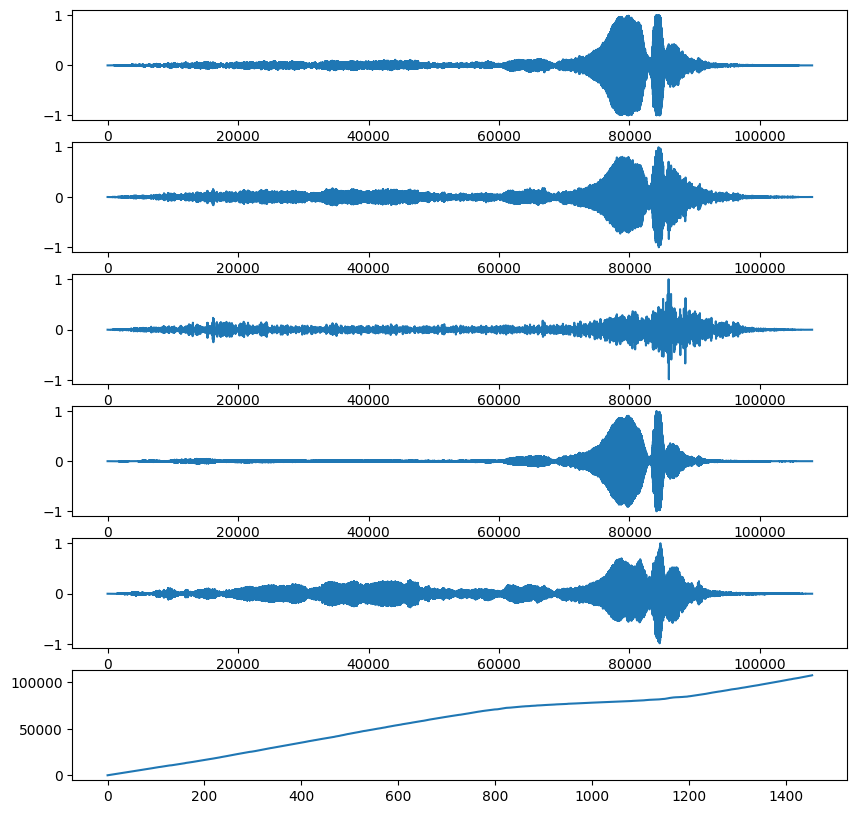

In [134]:
fig, axes = plt.subplots(6, 1, figsize=(10, 10))

axes[0].plot(audio)
axes[1].plot(composite)
axes[2].plot(y0)
axes[3].plot(y1)
axes[4].plot(y2)
axes[5].plot(gcis)


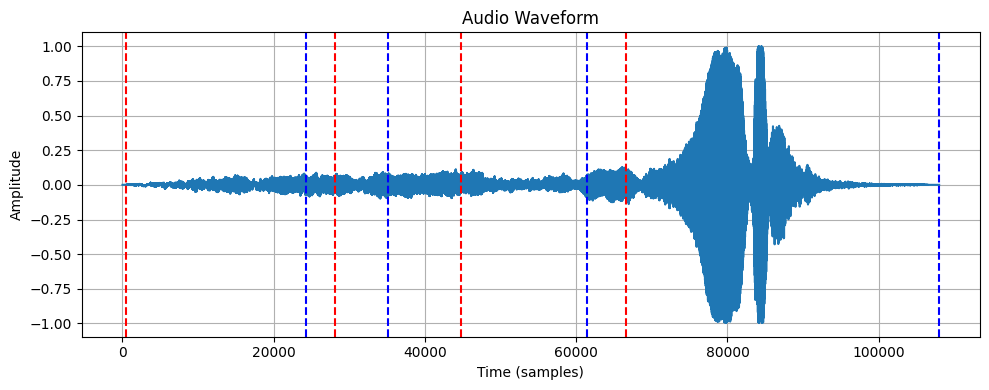

In [136]:
# Plot the audio waveform
plt.figure(figsize=(10, 4))
plt.plot(audio)
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.title('Audio Waveform')
plt.grid()

for segment in segment_list[0]:
    plt.axvline(x=int(segment[0] * sr), color='red', linestyle='--', alpha=1)
    plt.axvline(x=int(segment[1] * sr), color='blue', linestyle='--', alpha=1)

plt.tight_layout()
if not os.path.exists('outputs'):
    os.makedirs('outputs') 

plt.savefig('outputs/audio1.png')
plt.show()


In [153]:
def plot_segments(segment_array, segment_list, signal_array, signal_list):

    for j in range(len(signal_array)):
        audio_name = list(signal_array)[j]
        fs, audio = load_audio(os.path.join(audio_folder, audio_name))

        composite, y0, y1, y2, gcis = signal_array[audio_name]

        fig, axes = plt.subplots(5, 1, figsize=(10, 10))

        signals = [audio, composite, y0, y1, y2]
        labels = ['Audio', 'Composite', 'y0', 'y1', 'y2']

        for i, (signal, label) in enumerate(zip(signals, labels)):
            axes[i].plot(signal, color='blue', label=label)
            for segment in segment_list[j]:
                axes[i].axvline(x=int(segment[0] * fs), color='red', linestyle='--', alpha=1)
                axes[i].axvline(x=int(segment[1] * fs), color='blue', linestyle='--', alpha=1)
            axes[i].set_title(label)
            axes[i].set_xlabel('Sample Index')
            axes[i].set_ylabel('Amplitude')
            axes[i].legend()

        plt.tight_layout()
        if not os.path.exists('outputs'):
            os.makedirs('outputs')
        plt.savefig('outputs/audio{}.png'.format(j+1))
        plt.show()
        plt.clf()

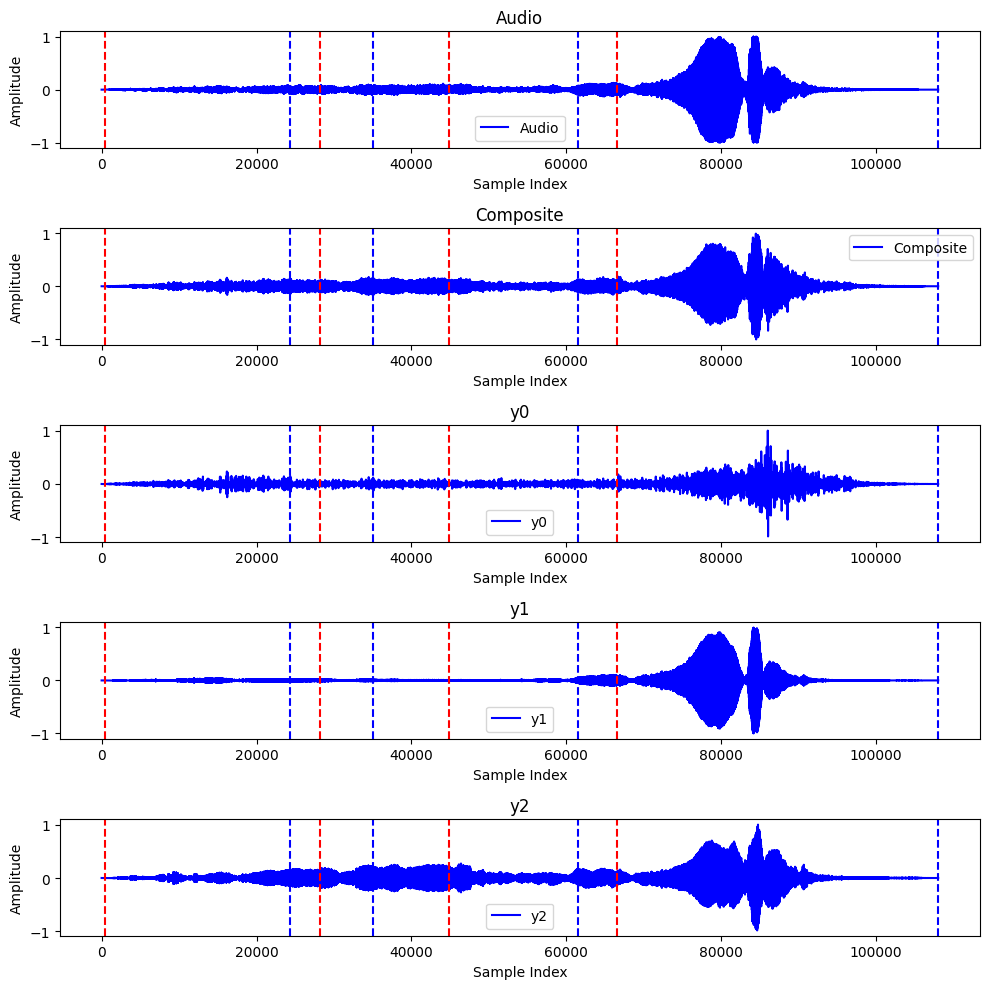

<Figure size 640x480 with 0 Axes>

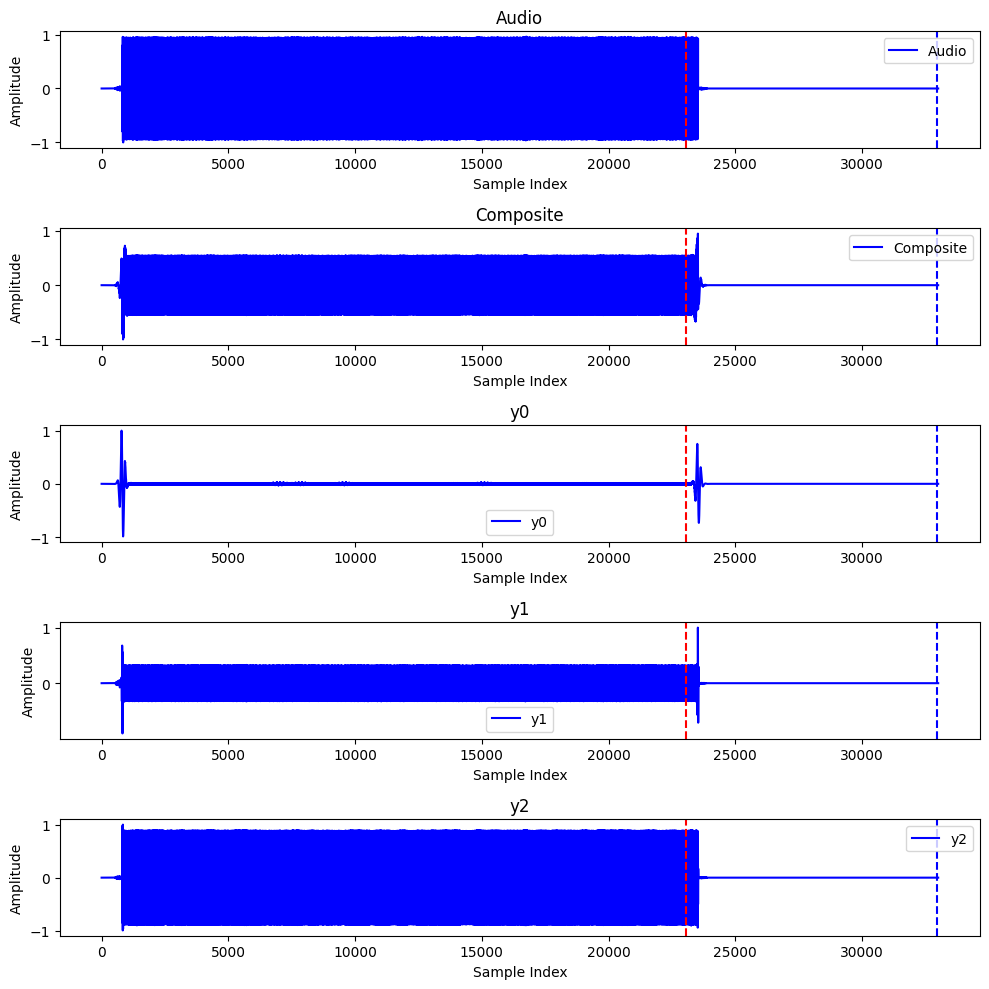

<Figure size 640x480 with 0 Axes>

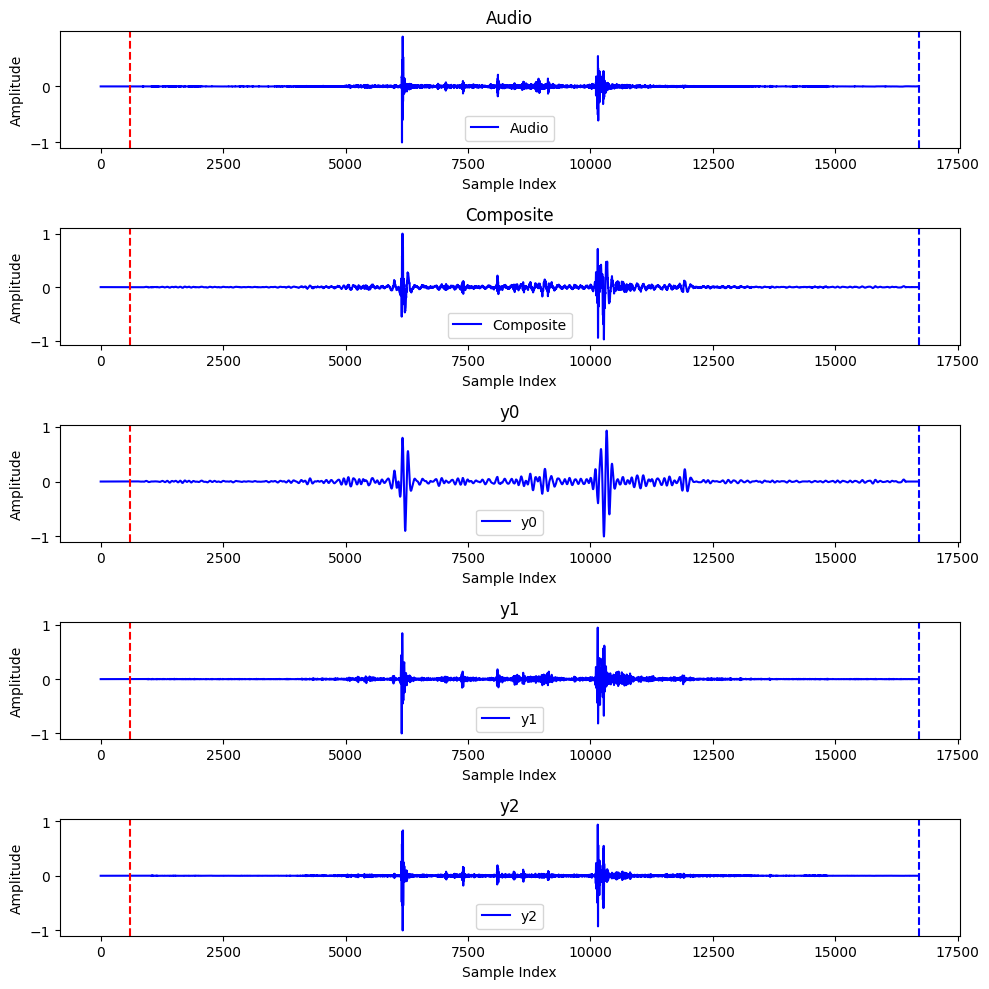

<Figure size 640x480 with 0 Axes>

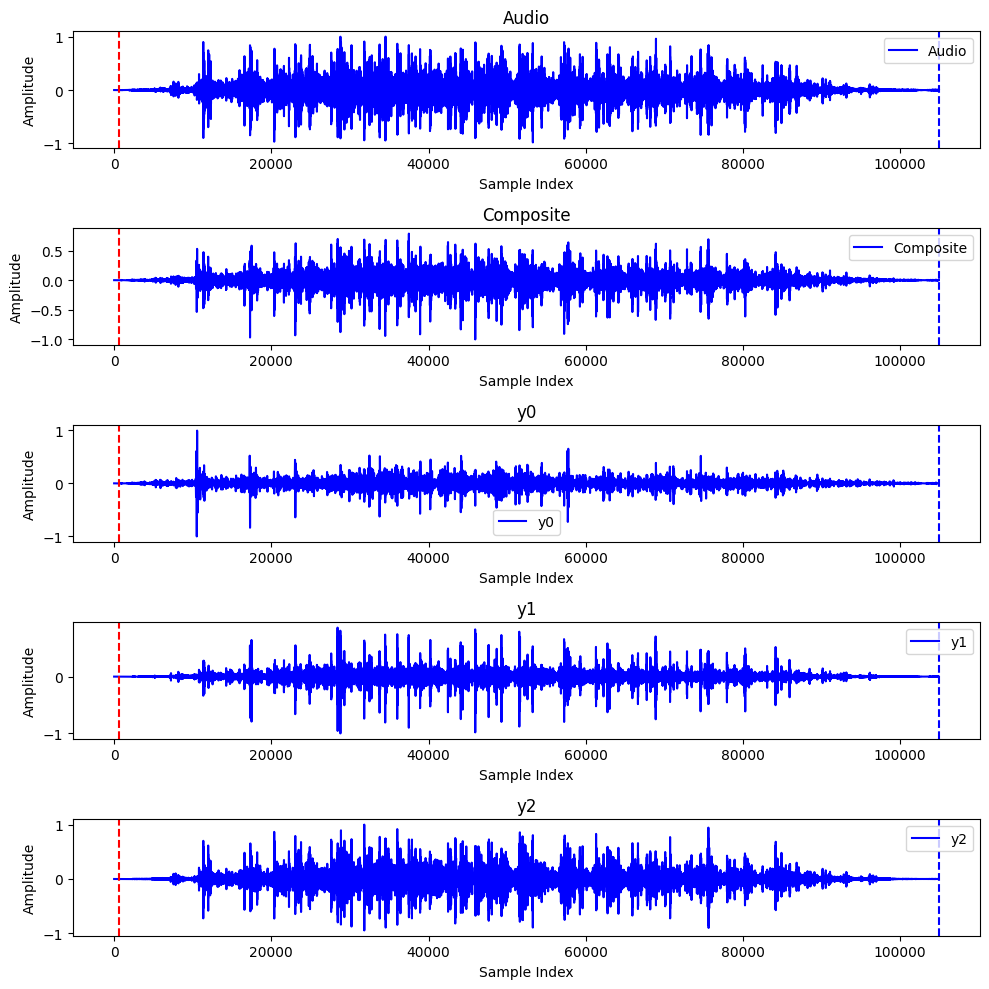

<Figure size 640x480 with 0 Axes>

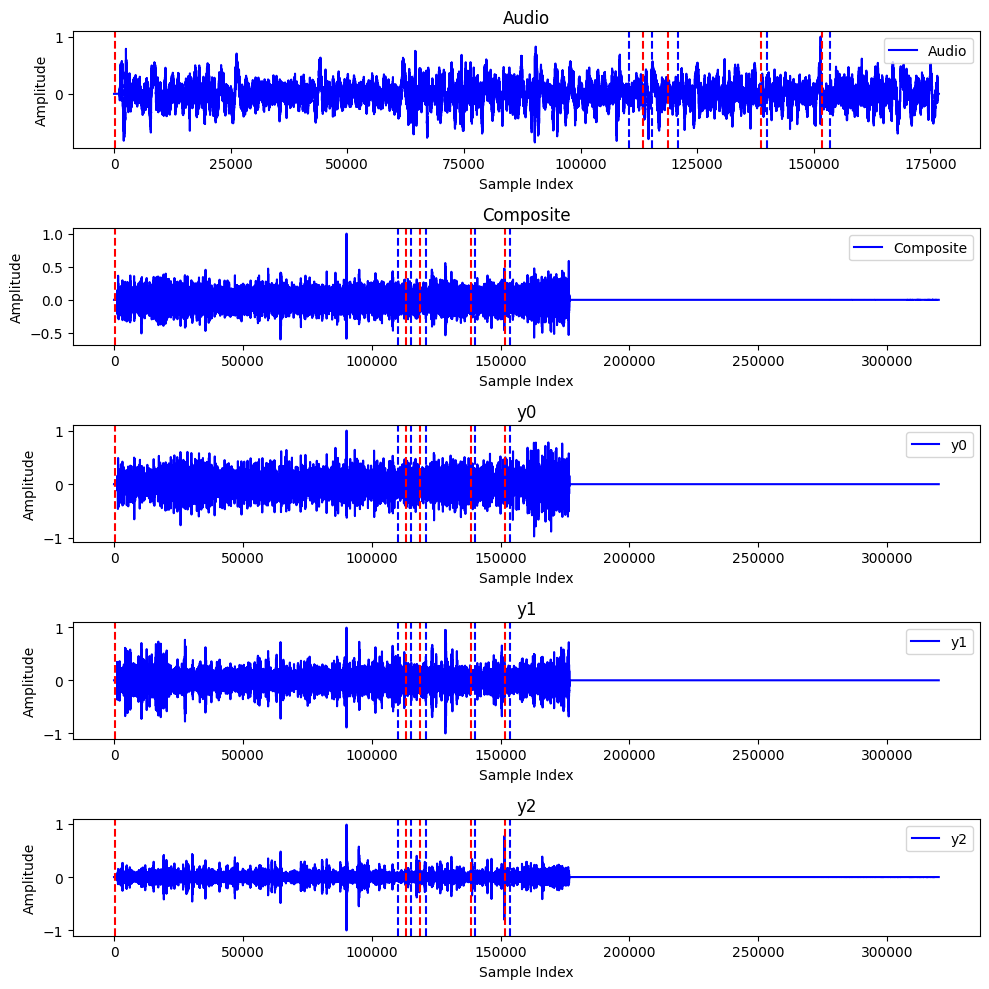

<Figure size 640x480 with 0 Axes>

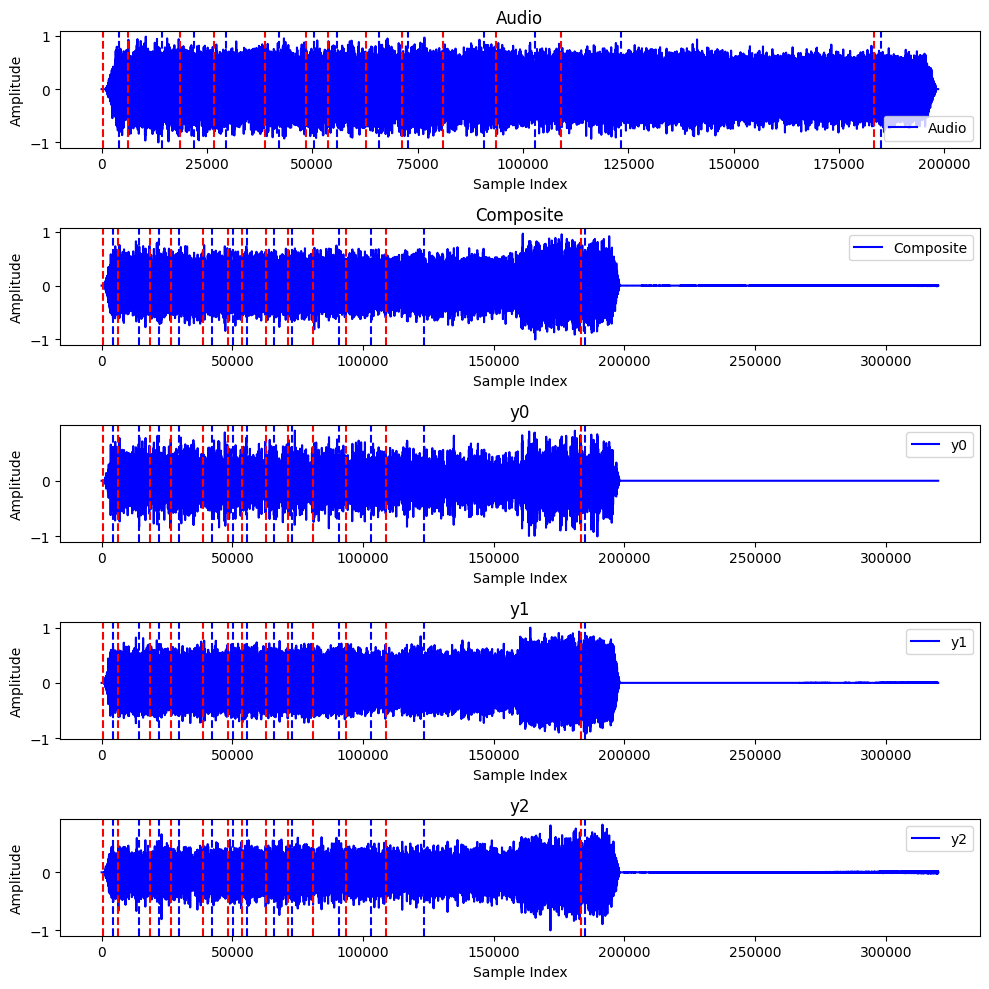

<Figure size 640x480 with 0 Axes>

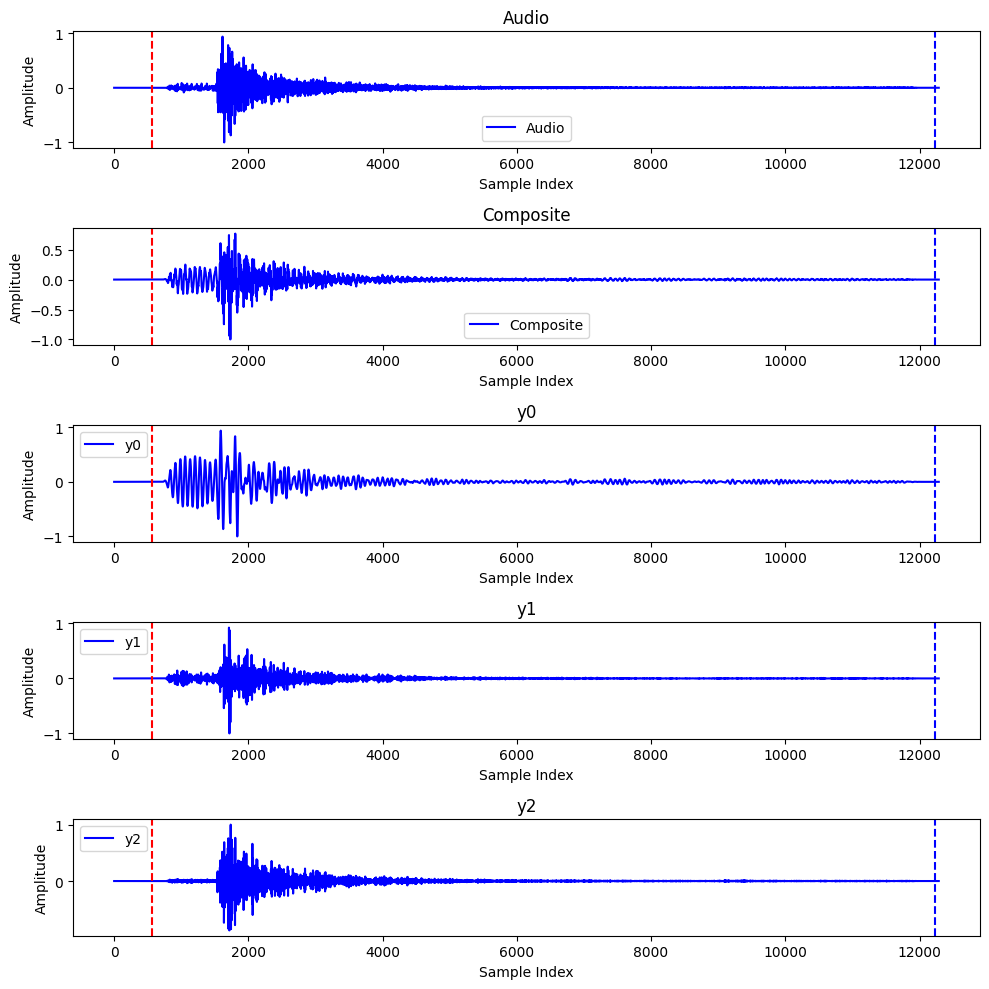

<Figure size 640x480 with 0 Axes>

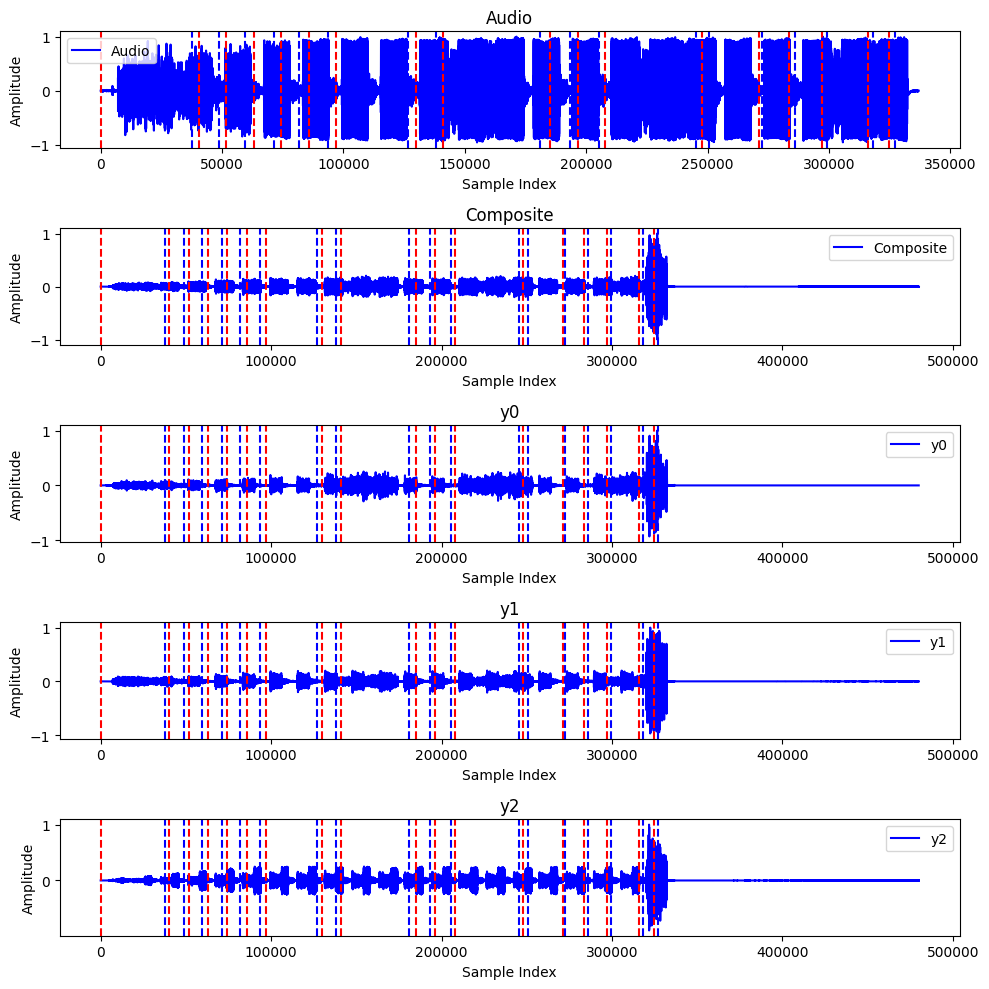

<Figure size 640x480 with 0 Axes>

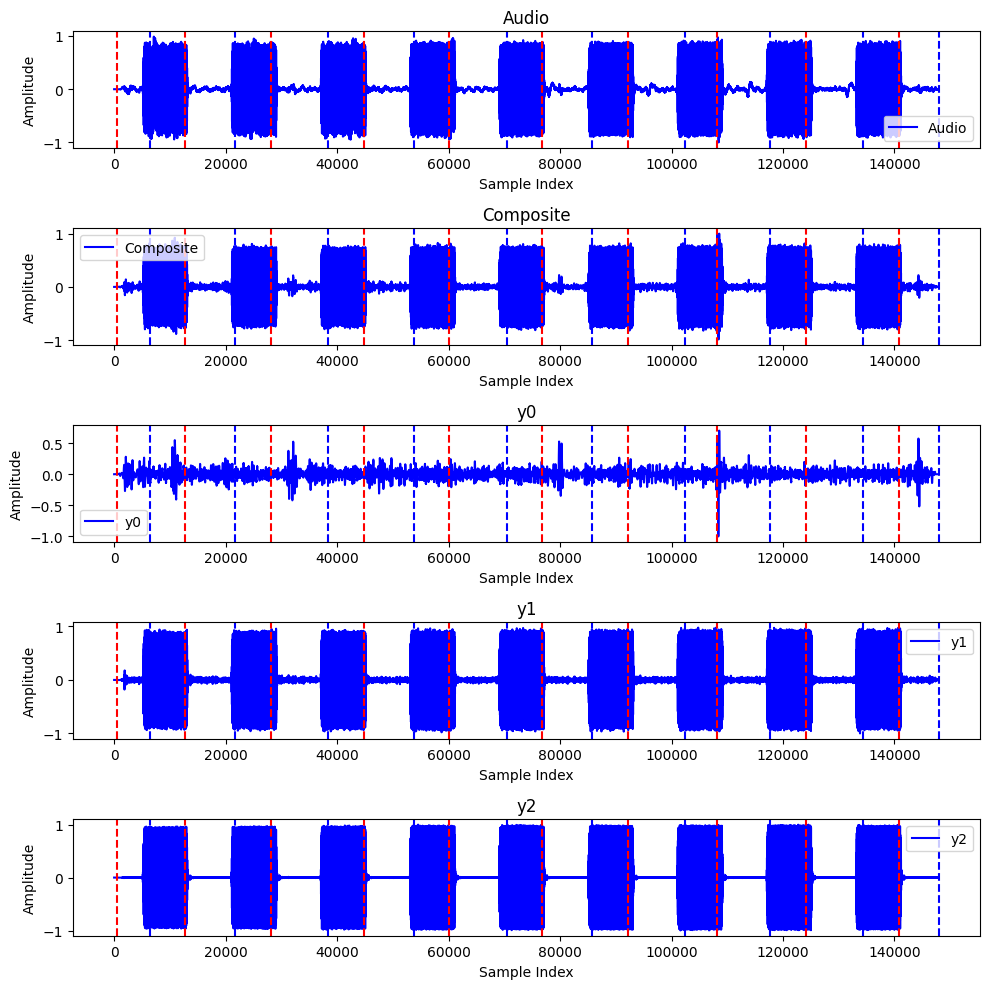

<Figure size 640x480 with 0 Axes>

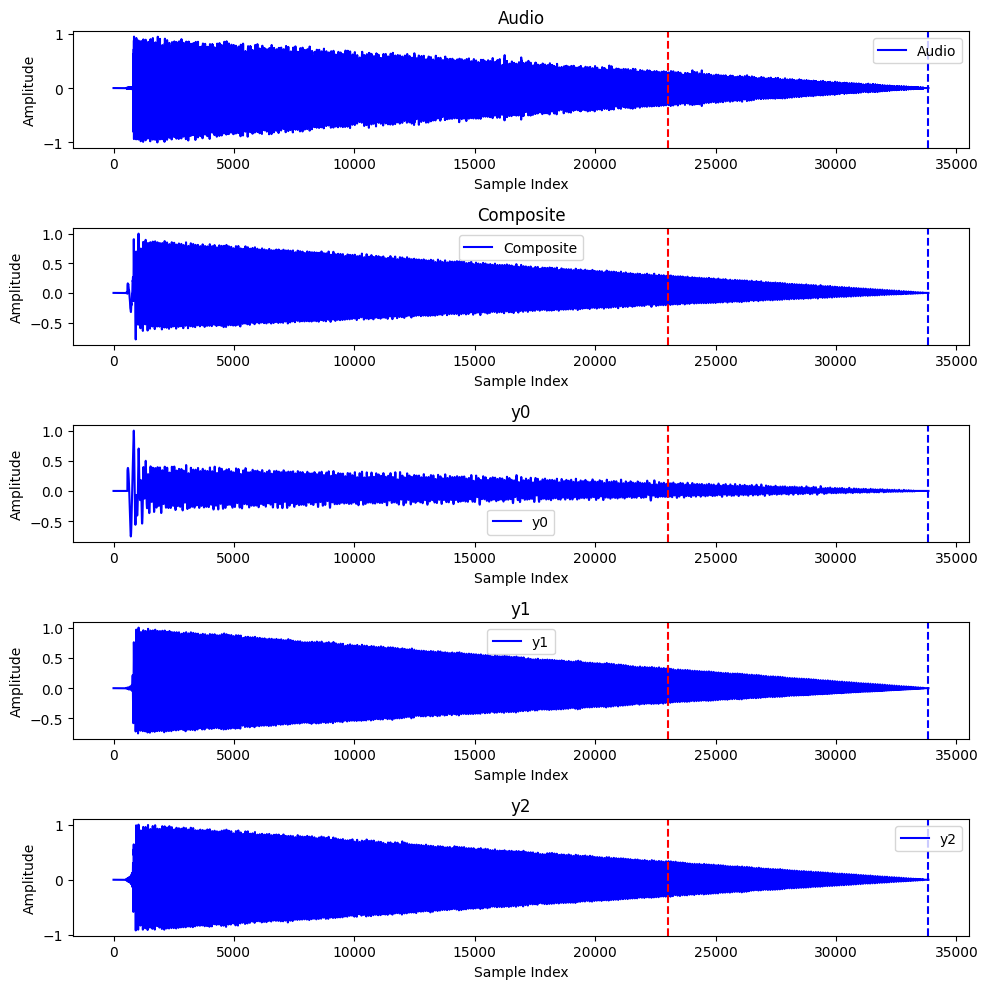

<Figure size 640x480 with 0 Axes>

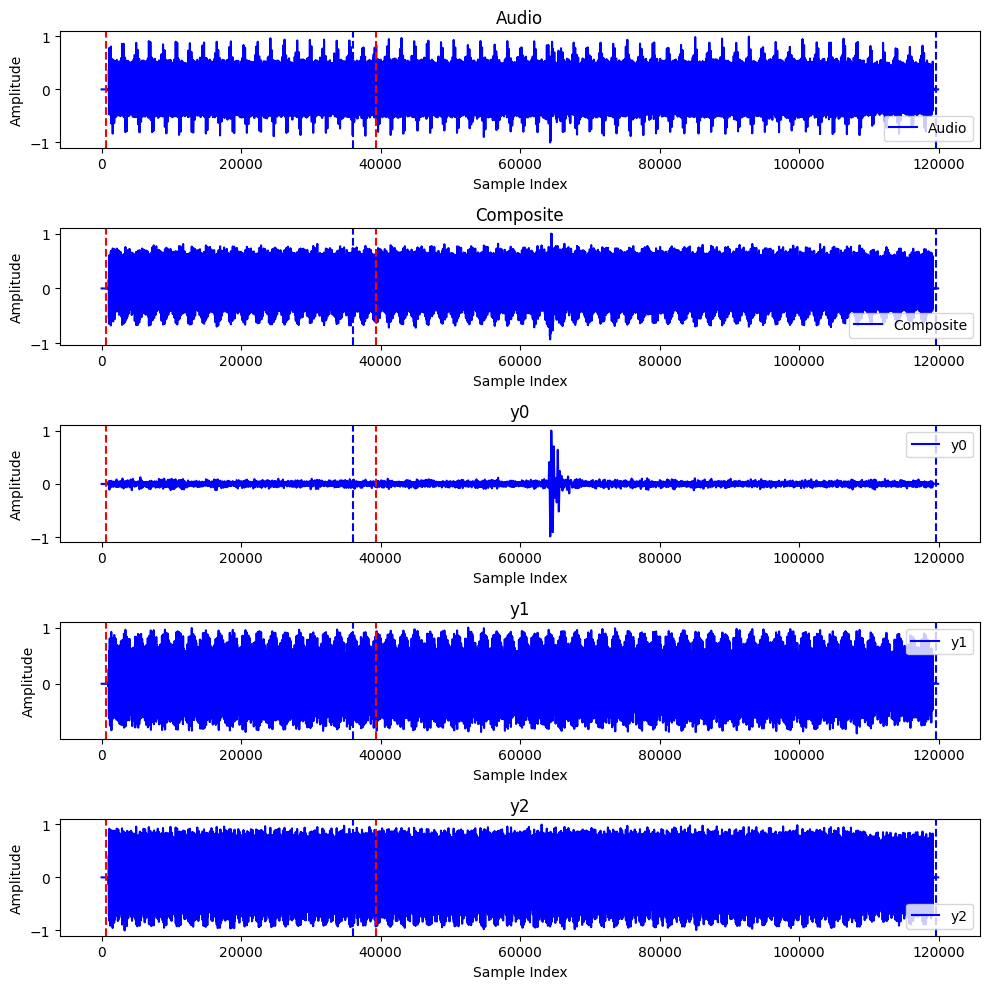

<Figure size 640x480 with 0 Axes>

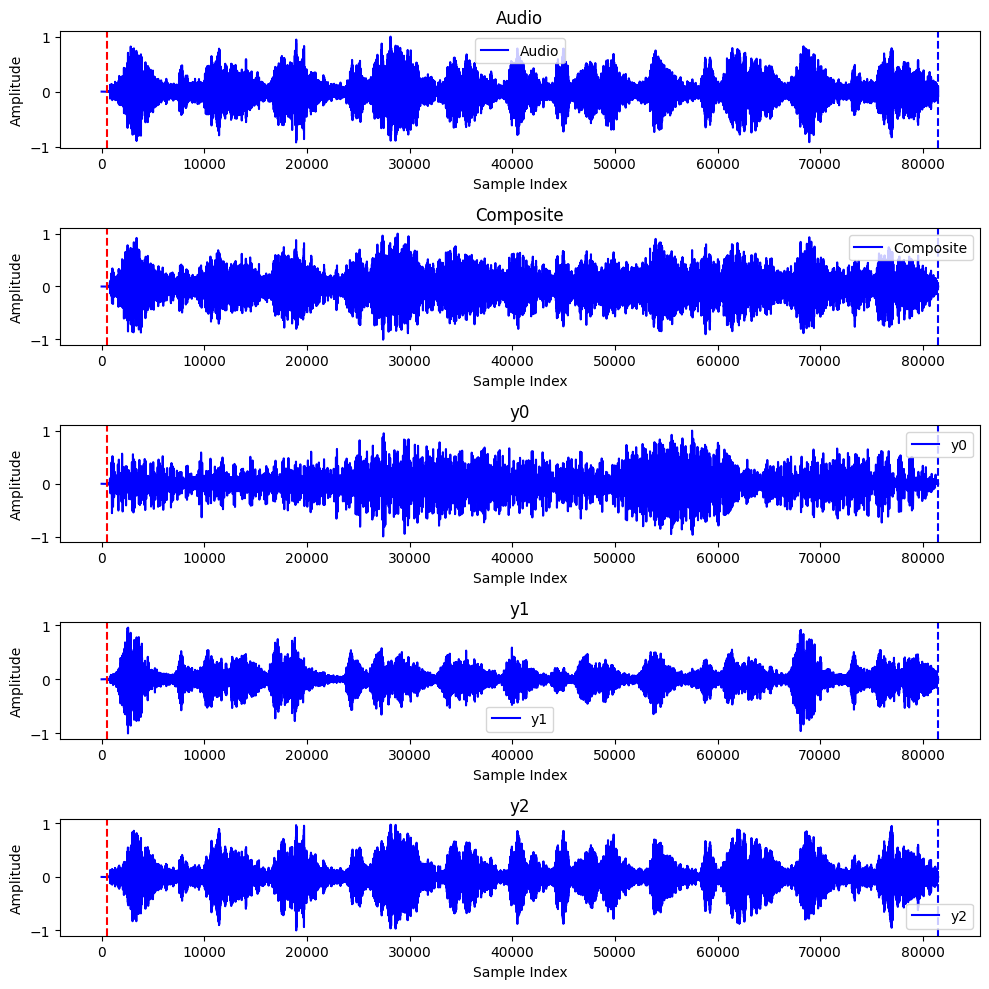

<Figure size 640x480 with 0 Axes>

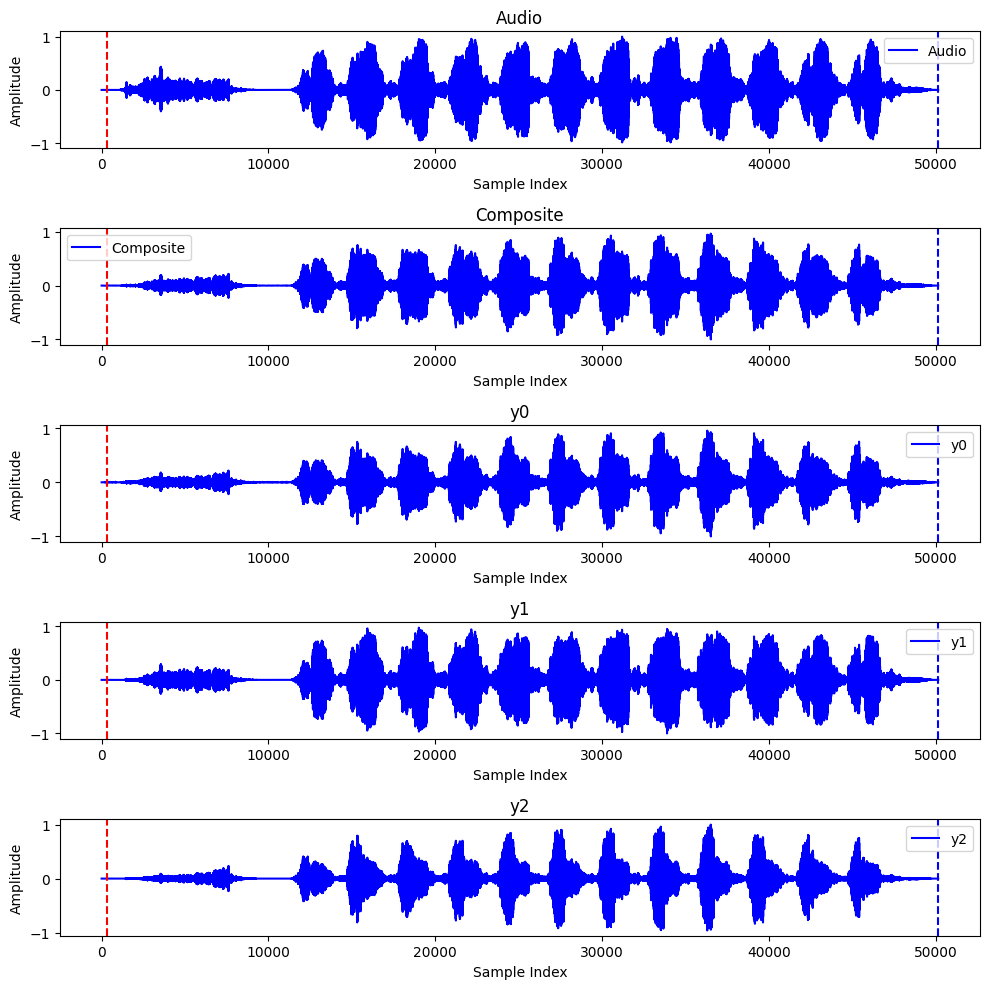

<Figure size 640x480 with 0 Axes>

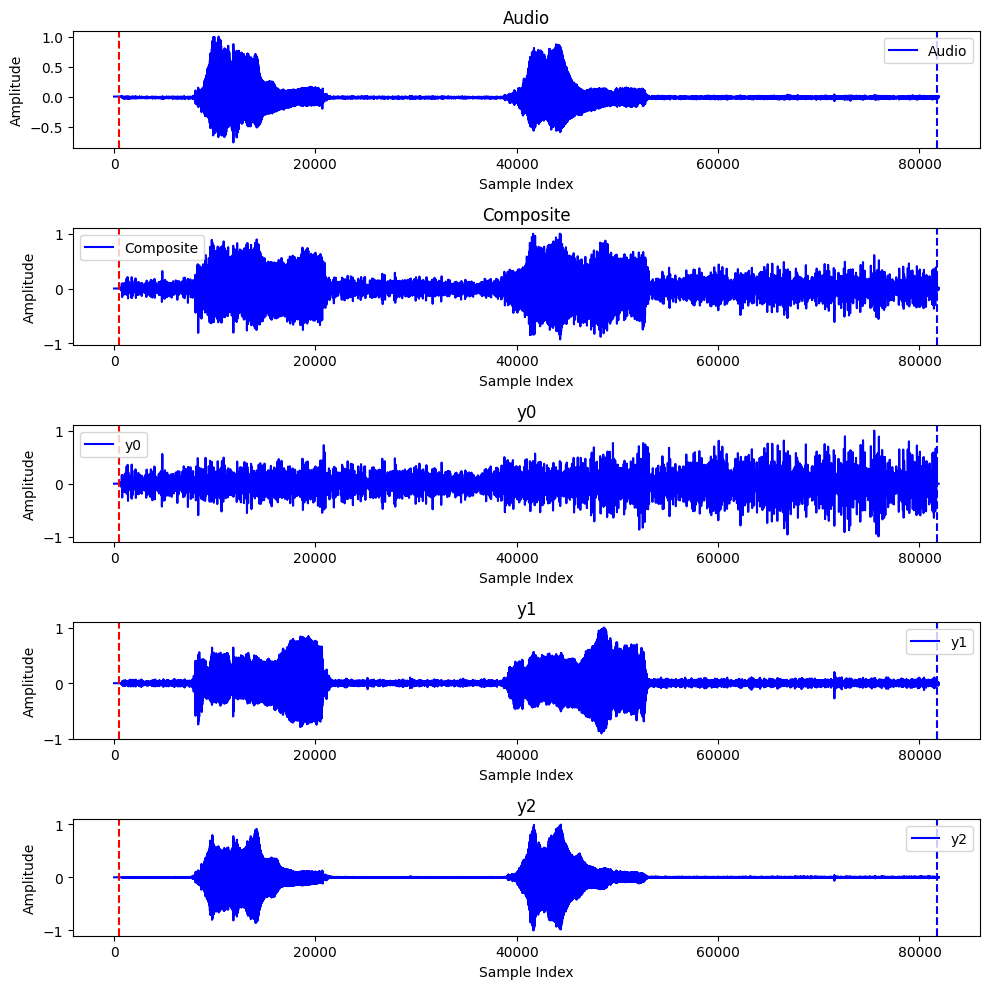

<Figure size 640x480 with 0 Axes>

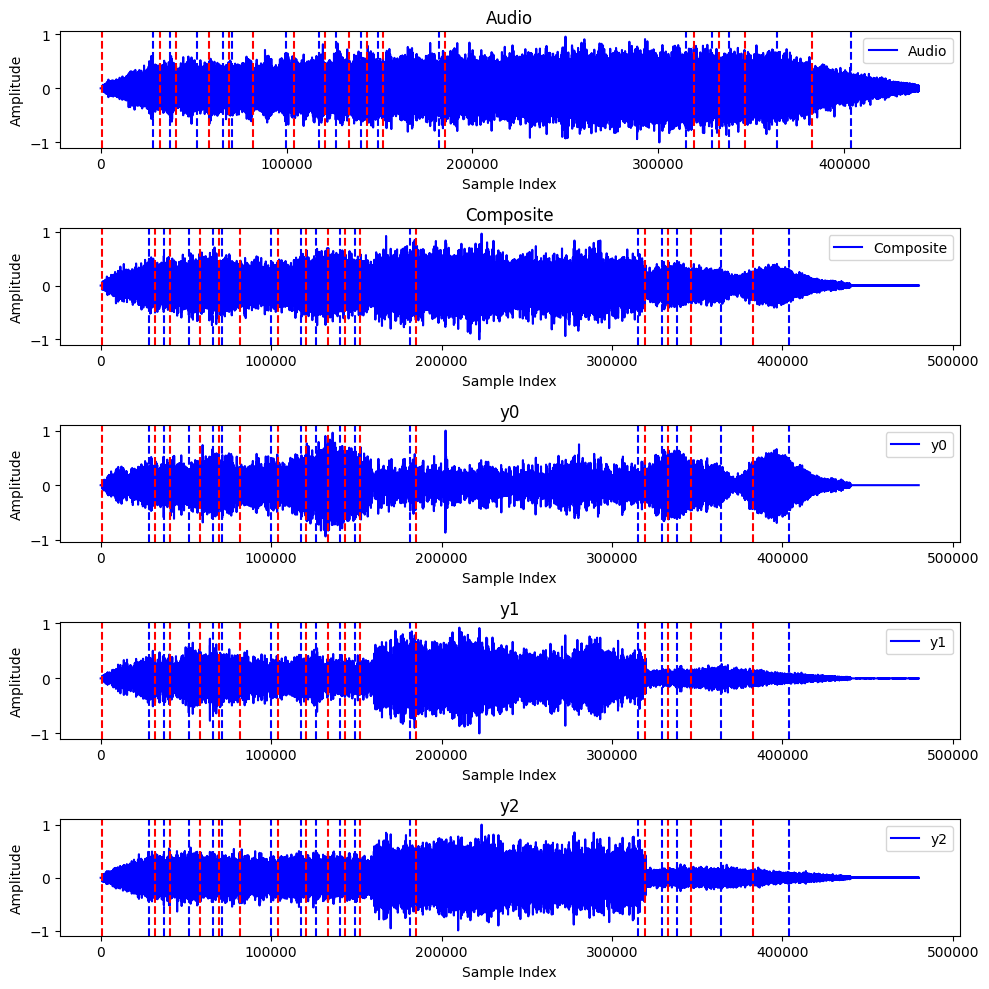

<Figure size 640x480 with 0 Axes>

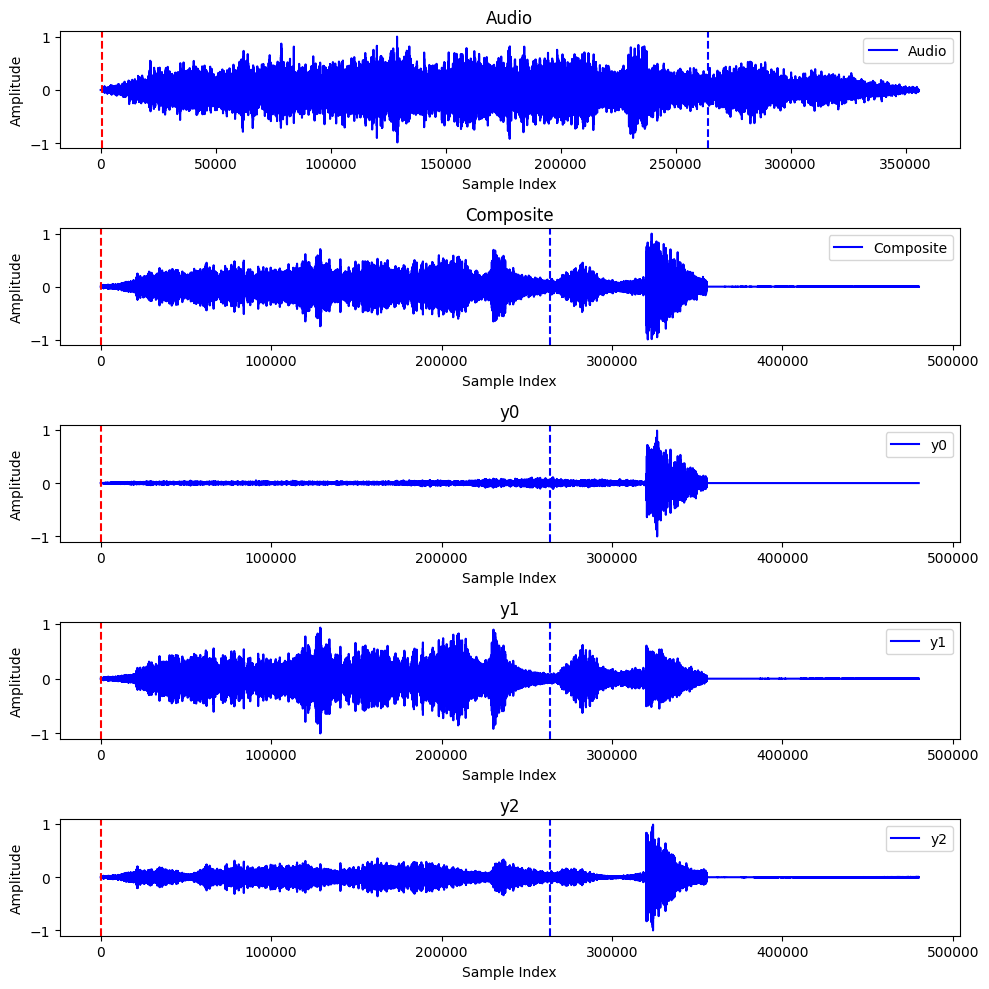

<Figure size 640x480 with 0 Axes>

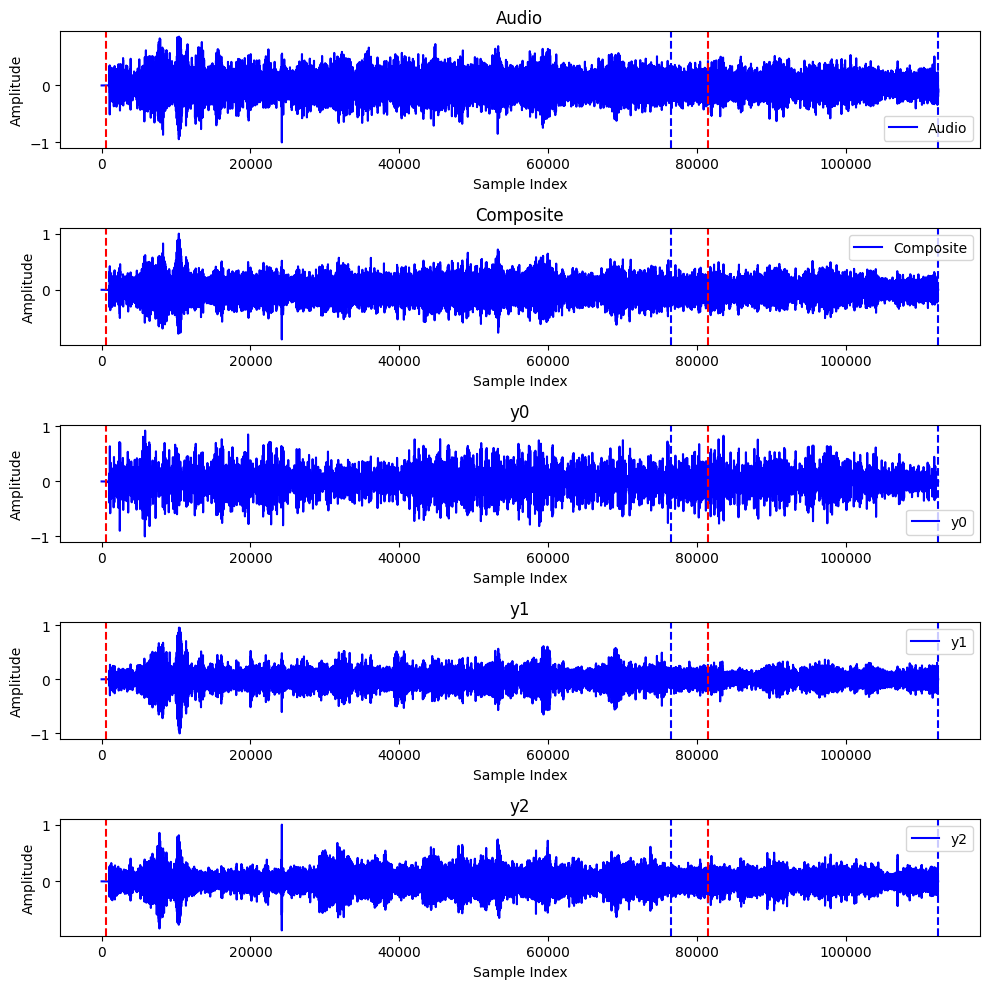

<Figure size 640x480 with 0 Axes>

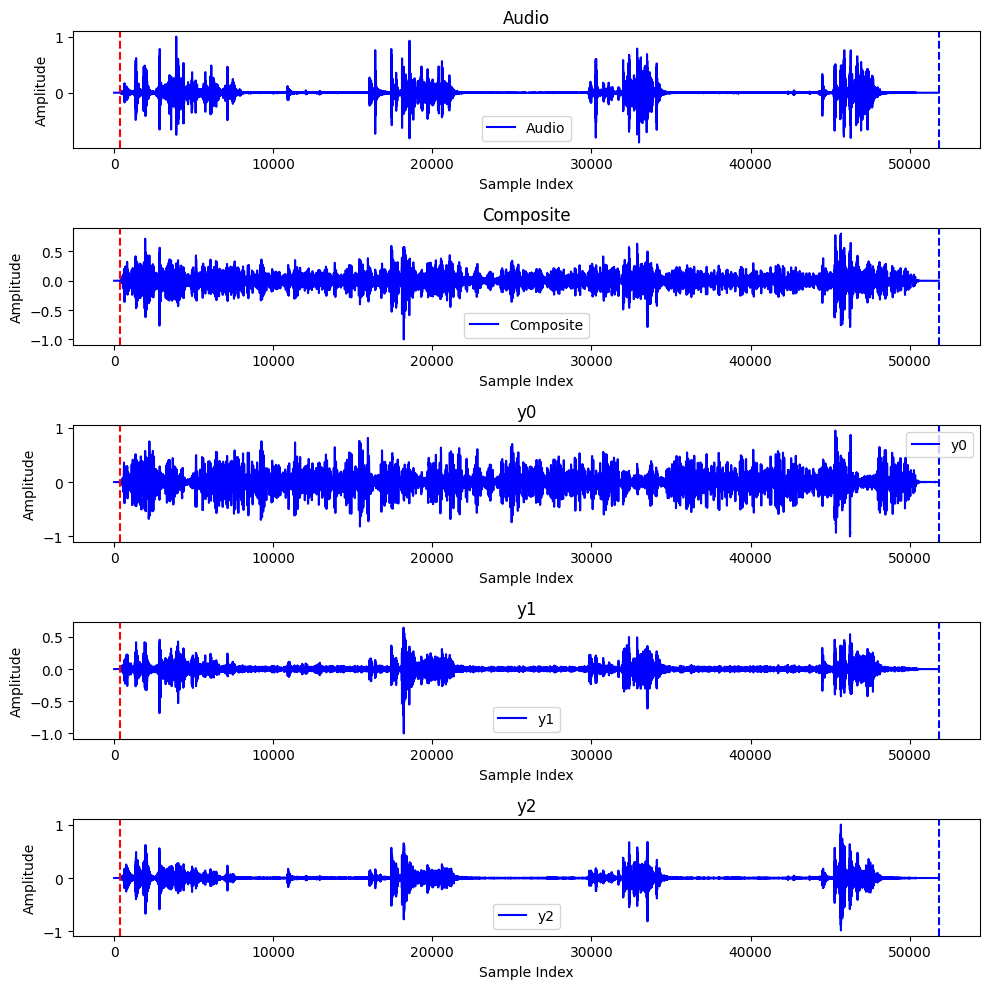

<Figure size 640x480 with 0 Axes>

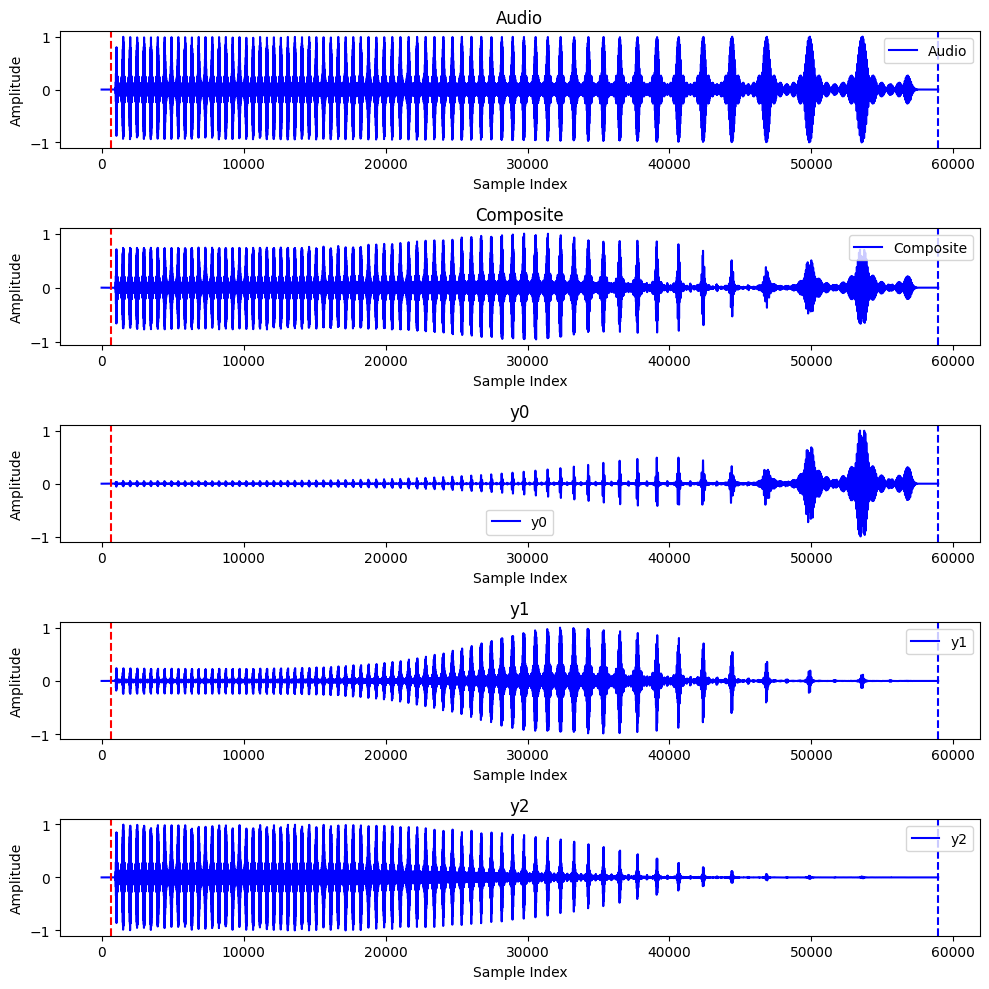

<Figure size 640x480 with 0 Axes>

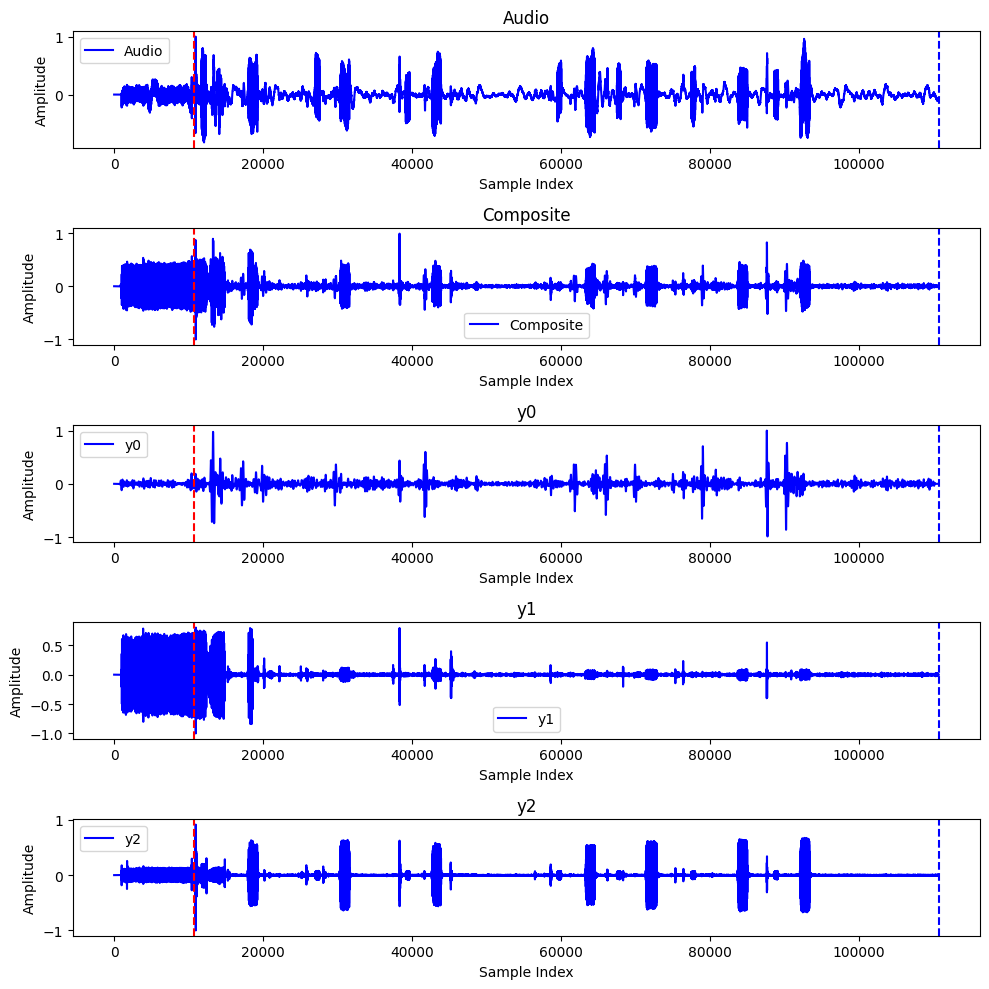

<Figure size 640x480 with 0 Axes>

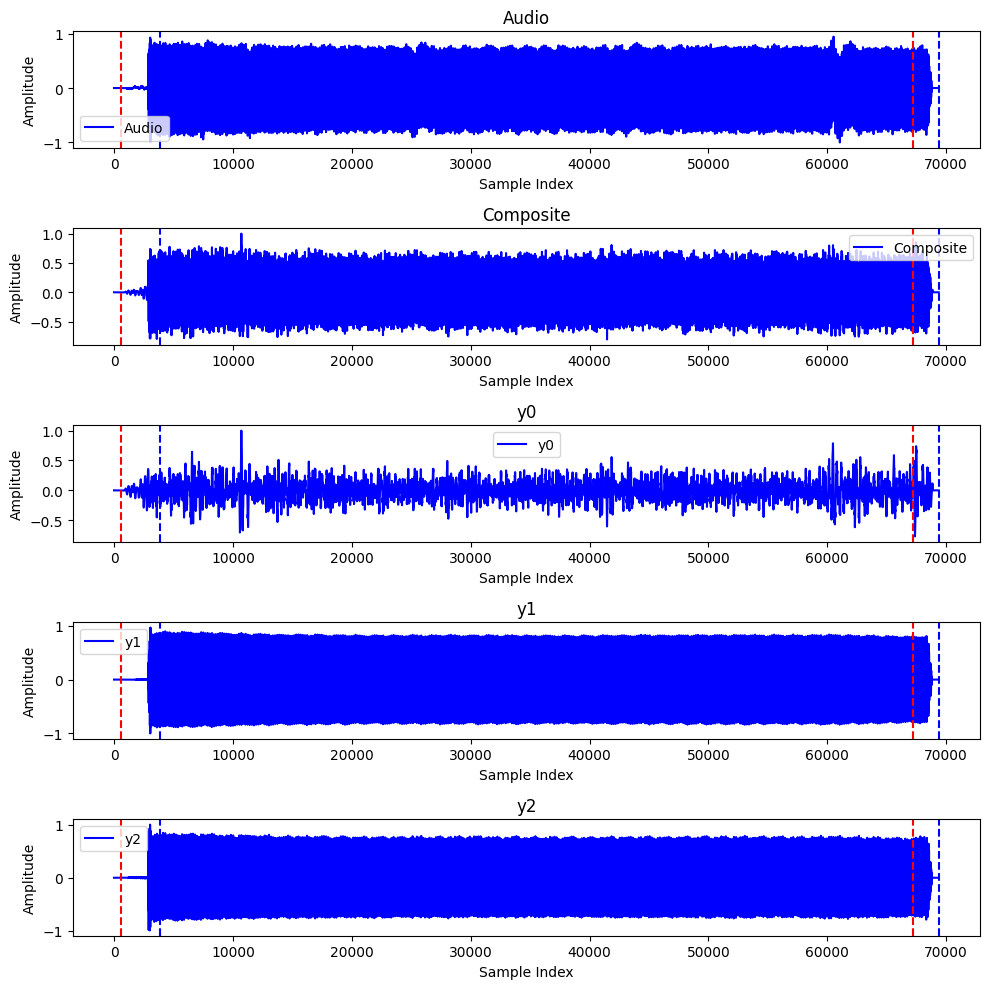

<Figure size 640x480 with 0 Axes>

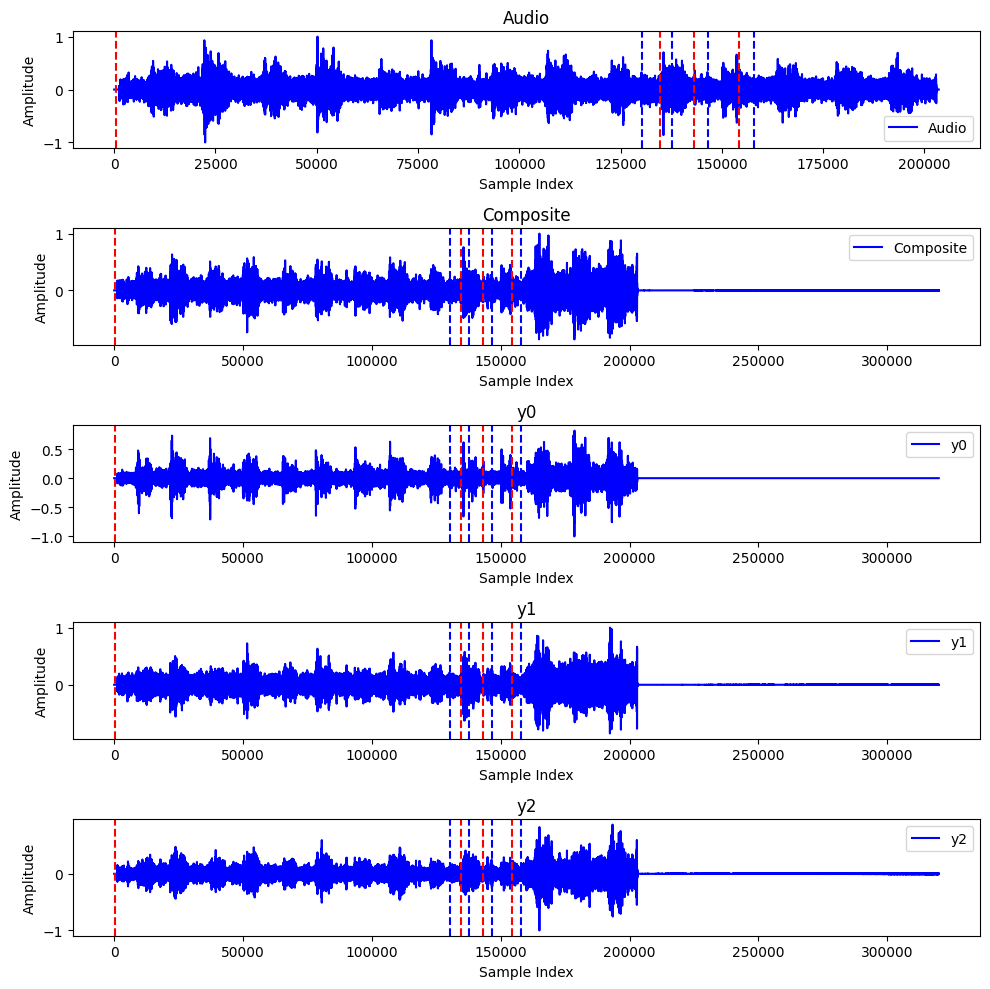

<Figure size 640x480 with 0 Axes>

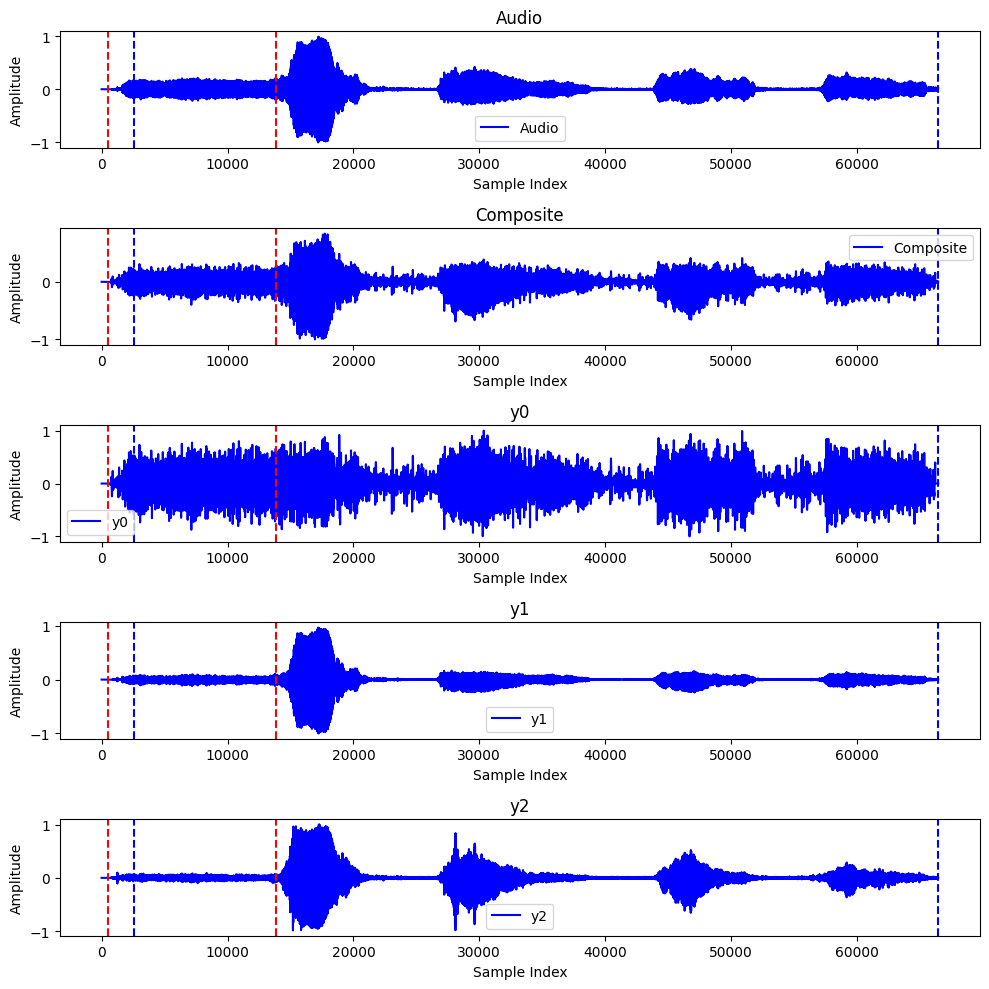

<Figure size 640x480 with 0 Axes>

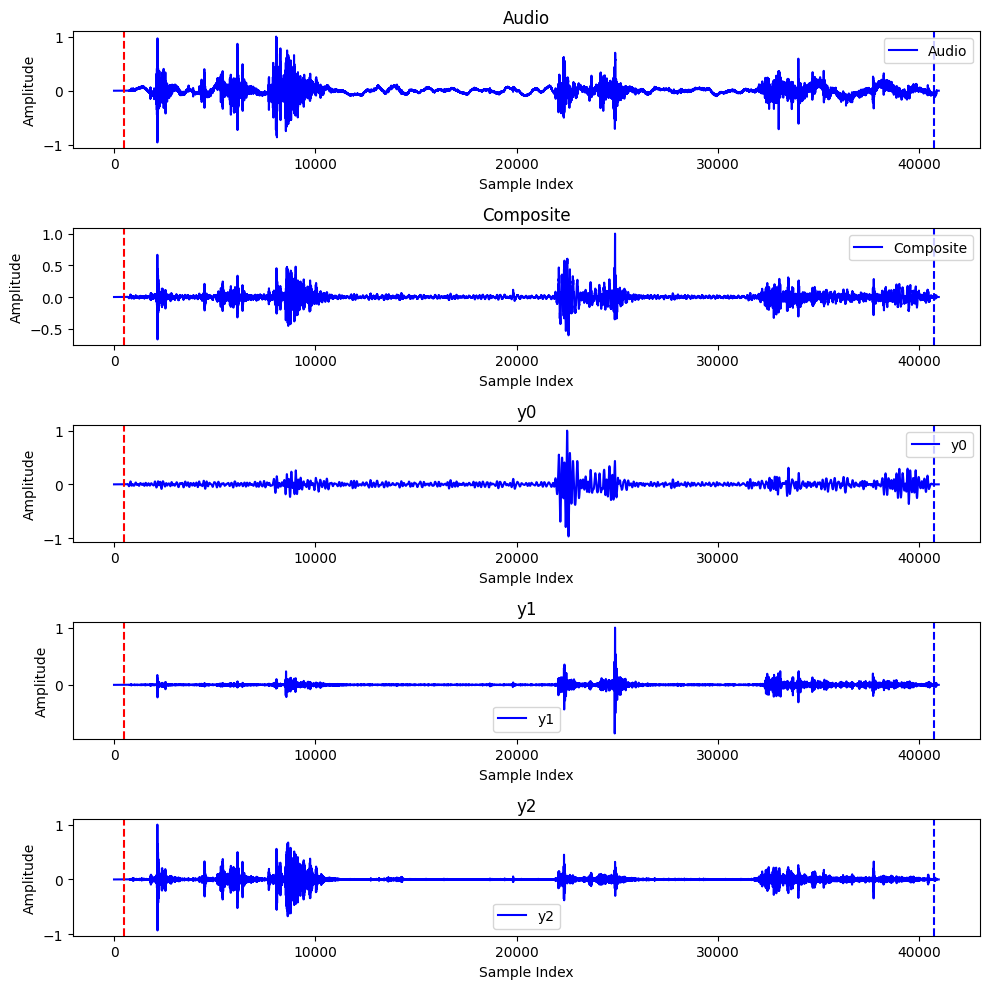

<Figure size 640x480 with 0 Axes>

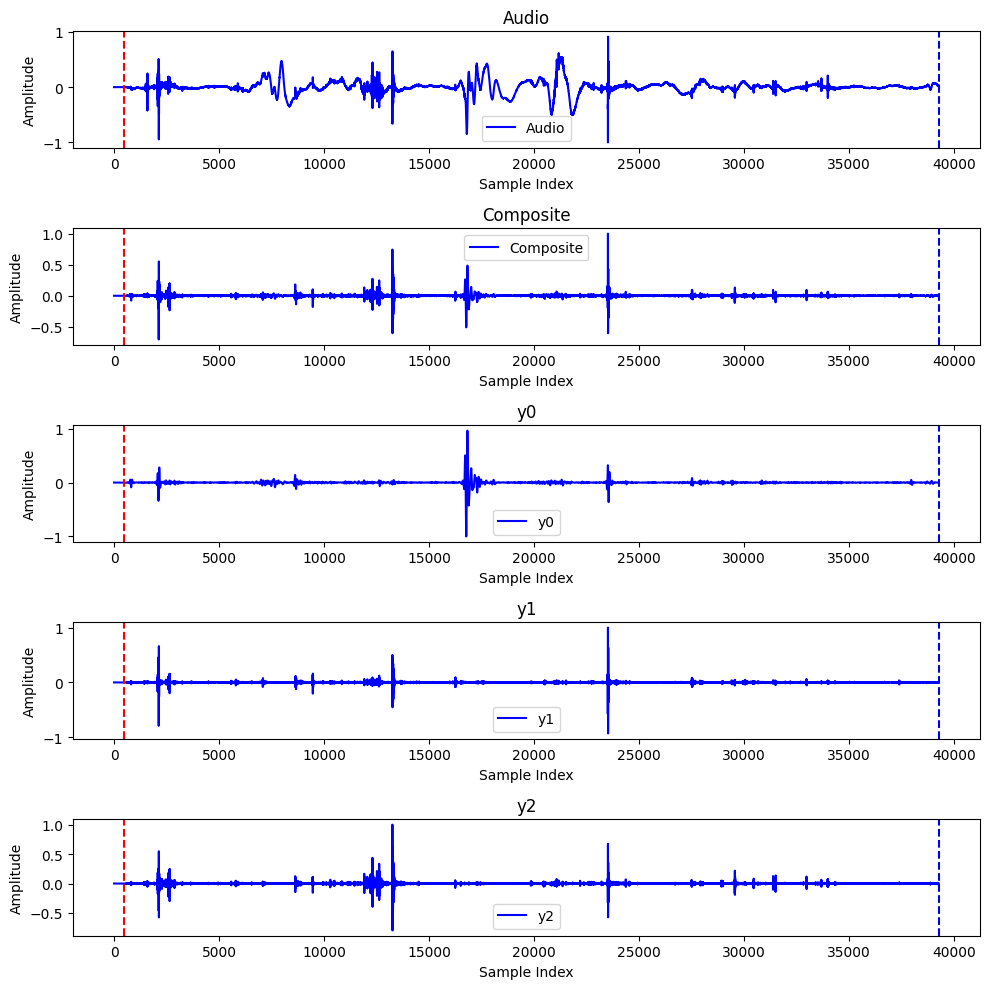

<Figure size 640x480 with 0 Axes>

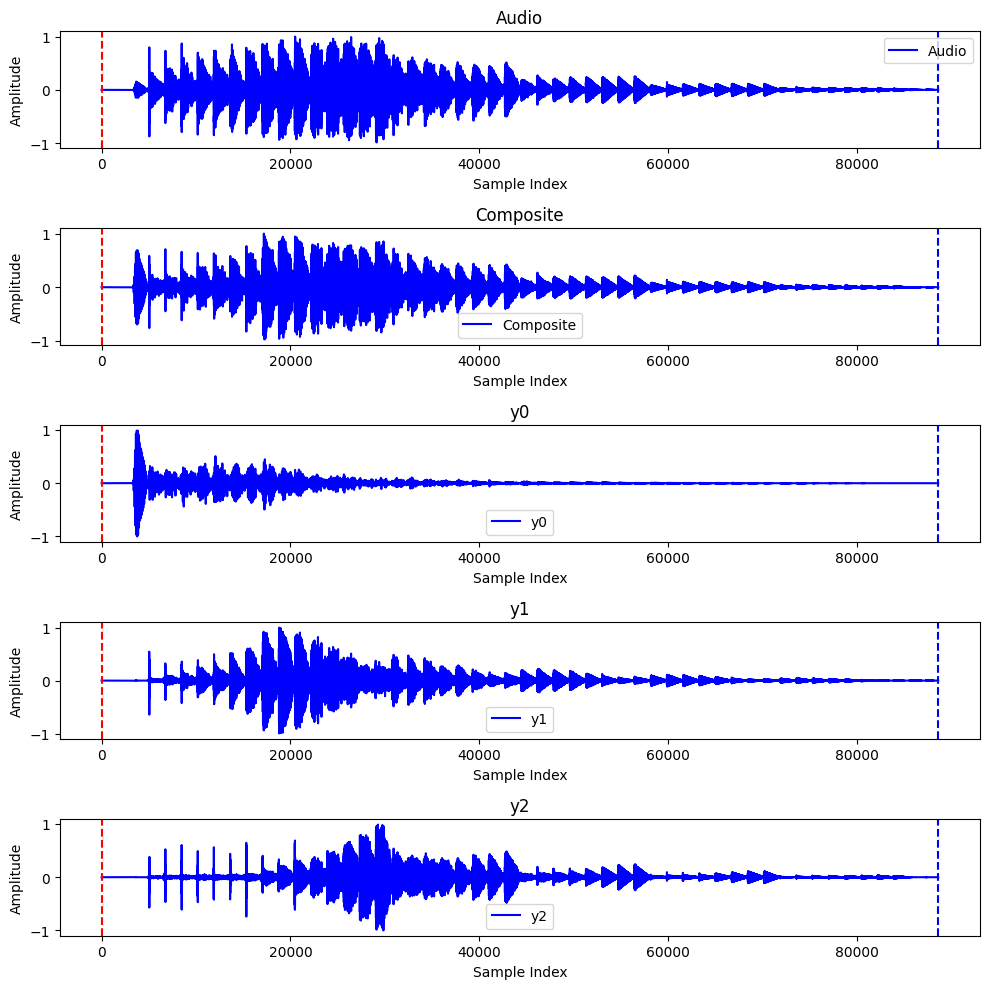

<Figure size 640x480 with 0 Axes>

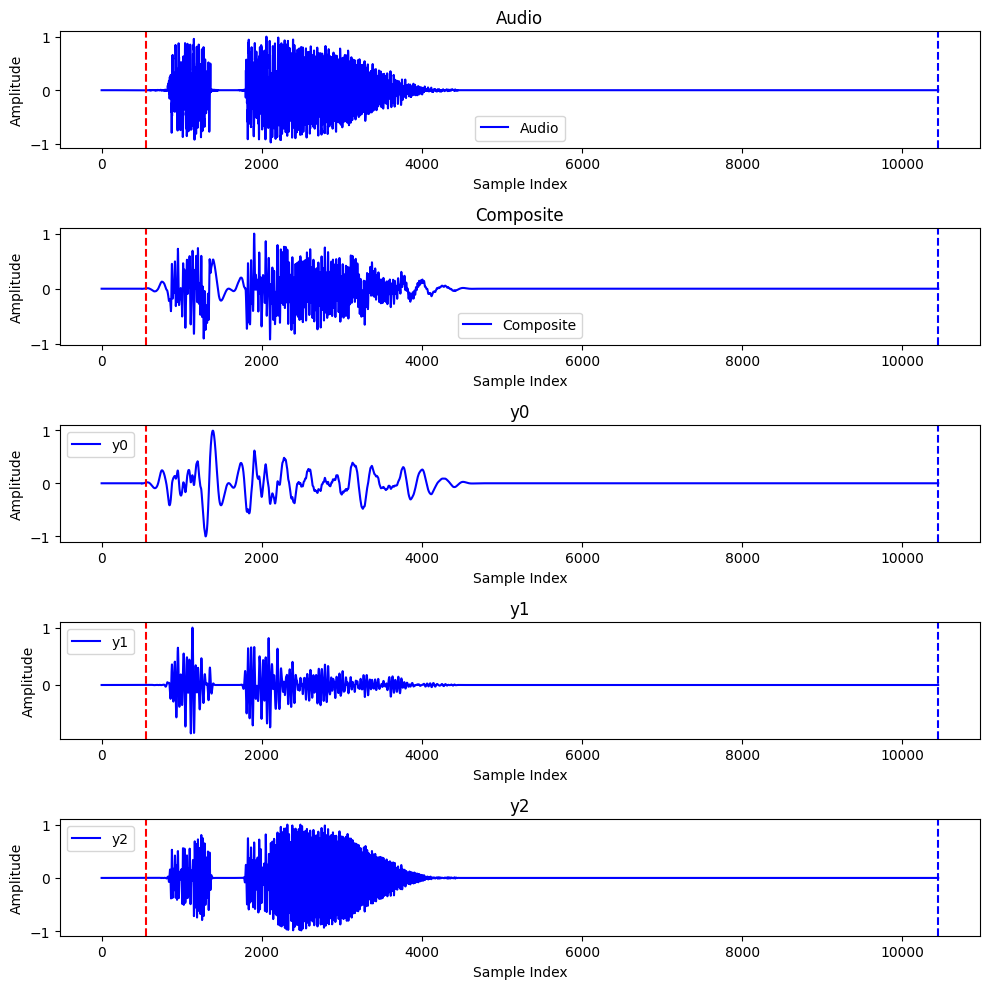

<Figure size 640x480 with 0 Axes>

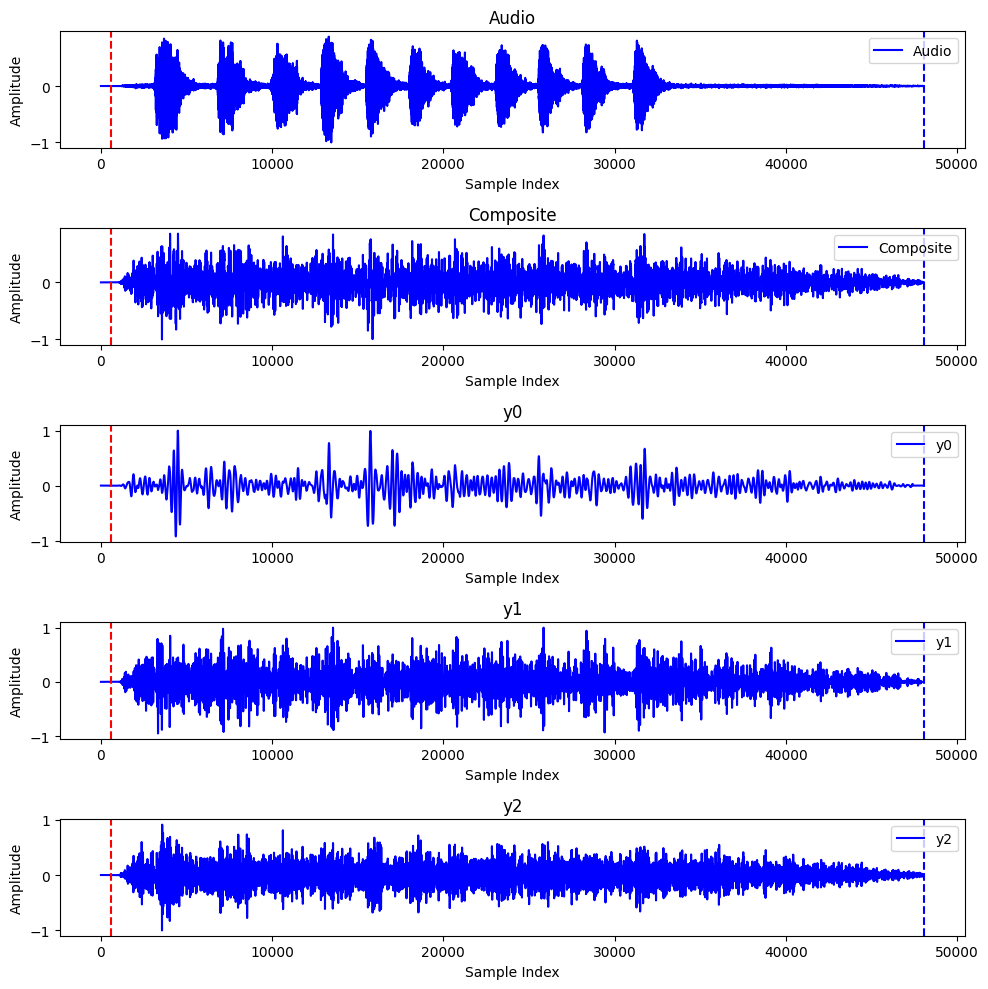

<Figure size 640x480 with 0 Axes>

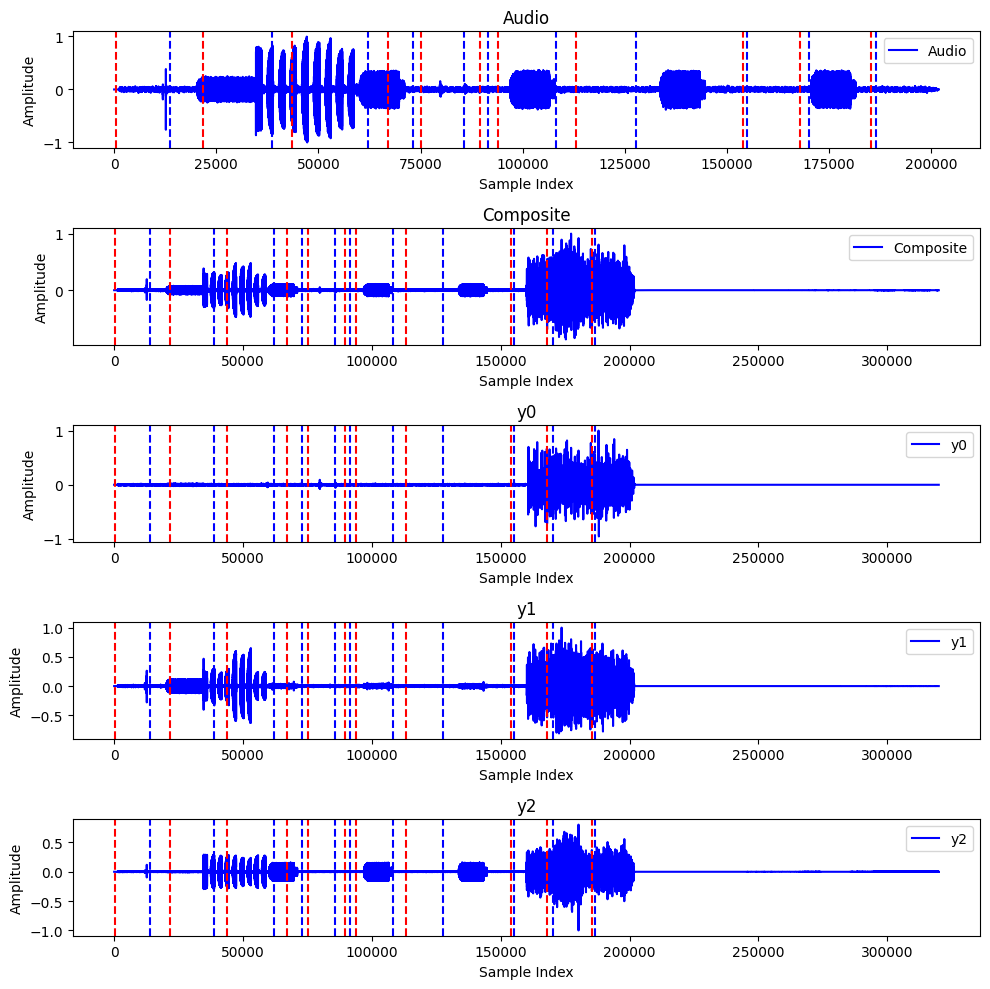

<Figure size 640x480 with 0 Axes>

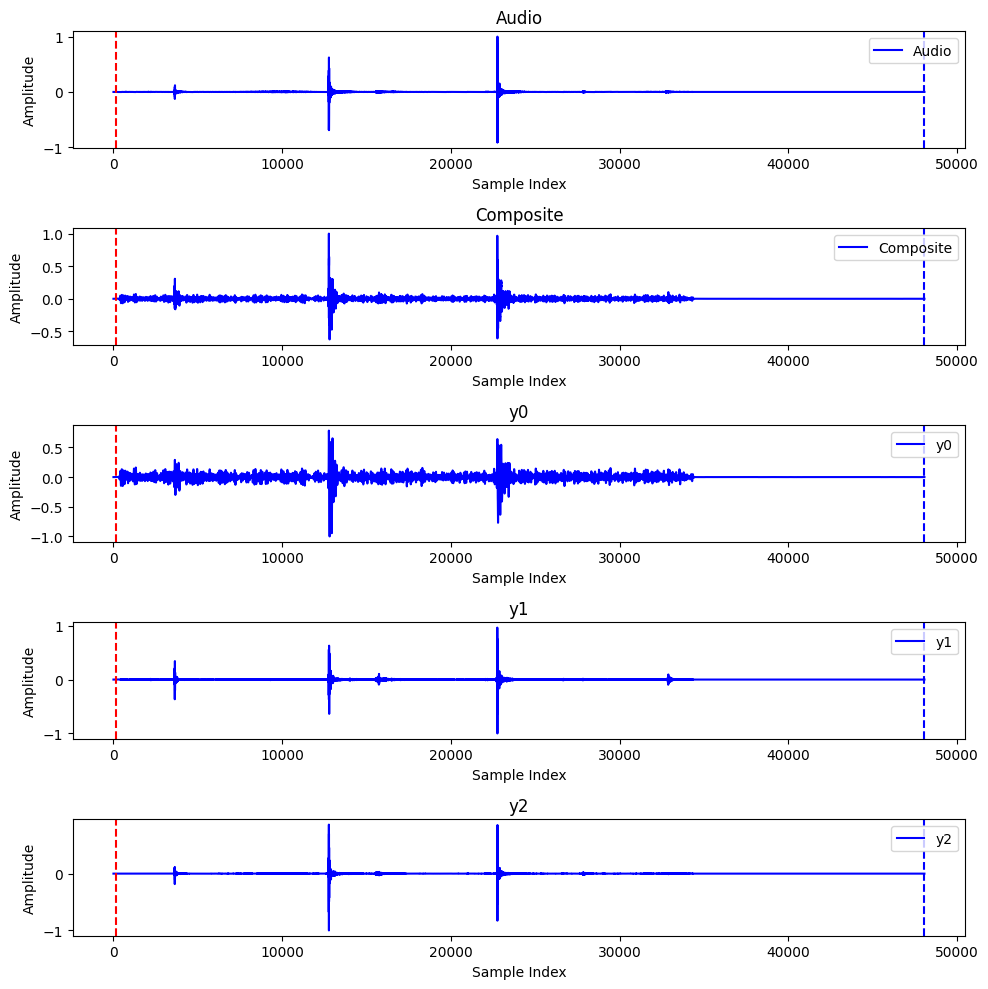

<Figure size 640x480 with 0 Axes>

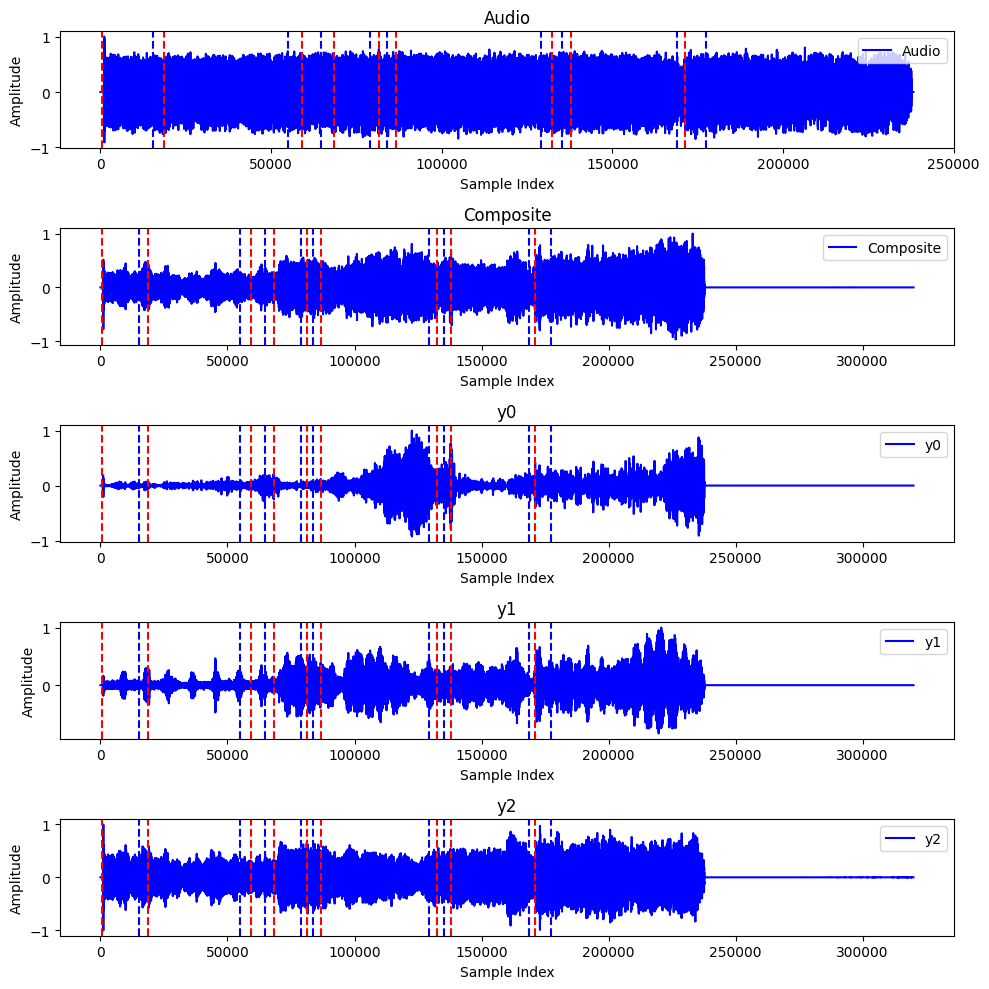

<Figure size 640x480 with 0 Axes>

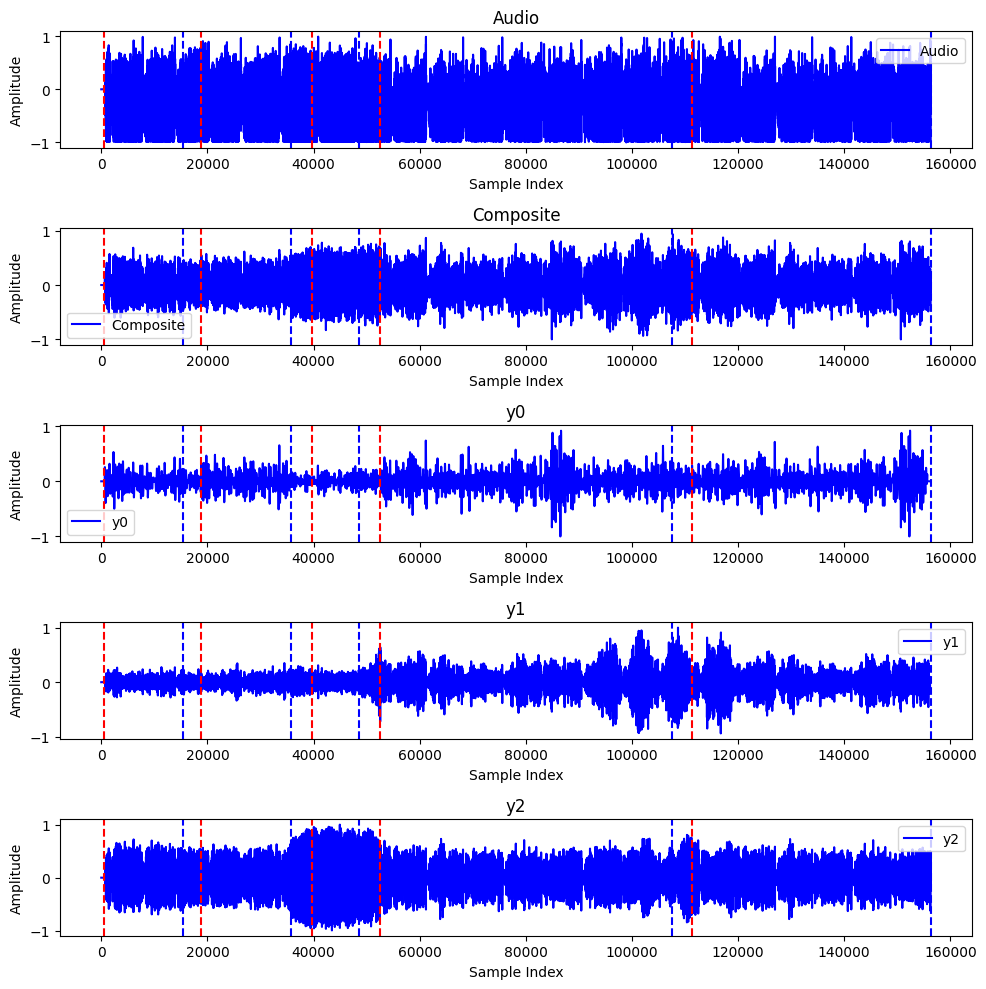

<Figure size 640x480 with 0 Axes>

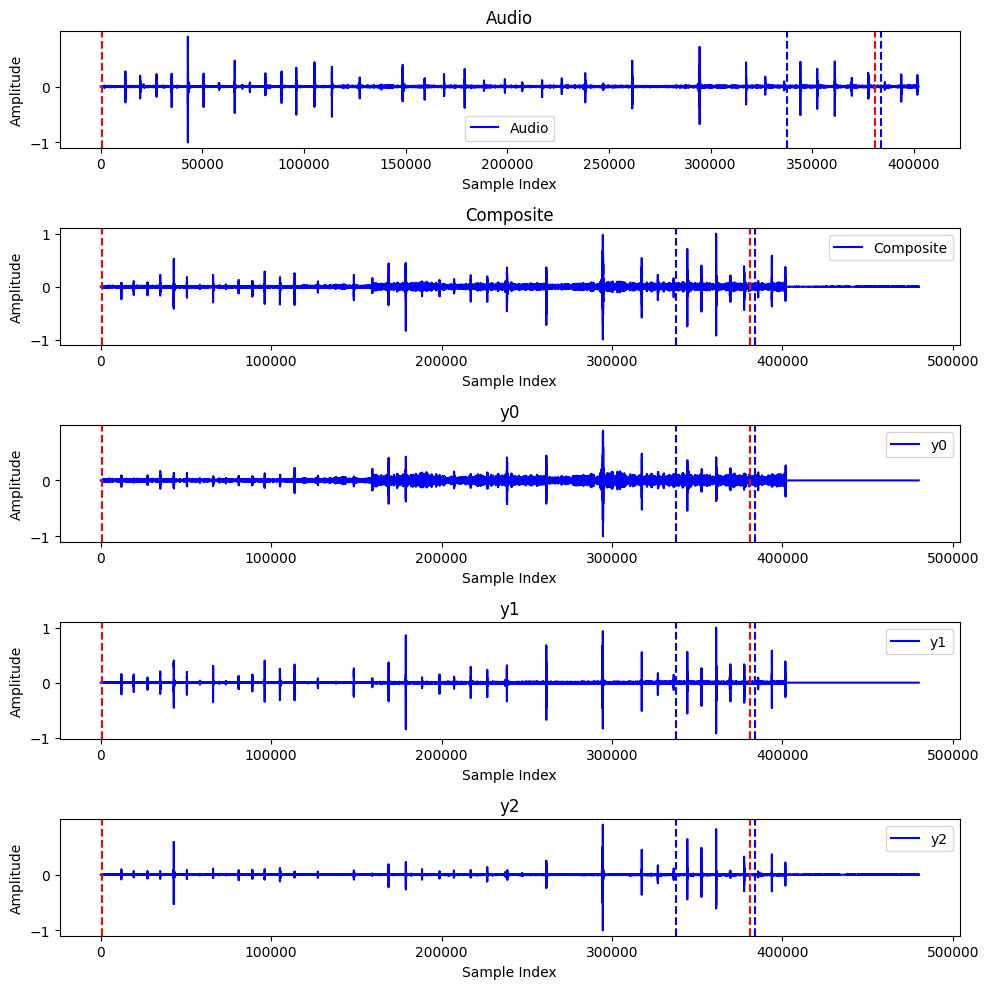

<Figure size 640x480 with 0 Axes>

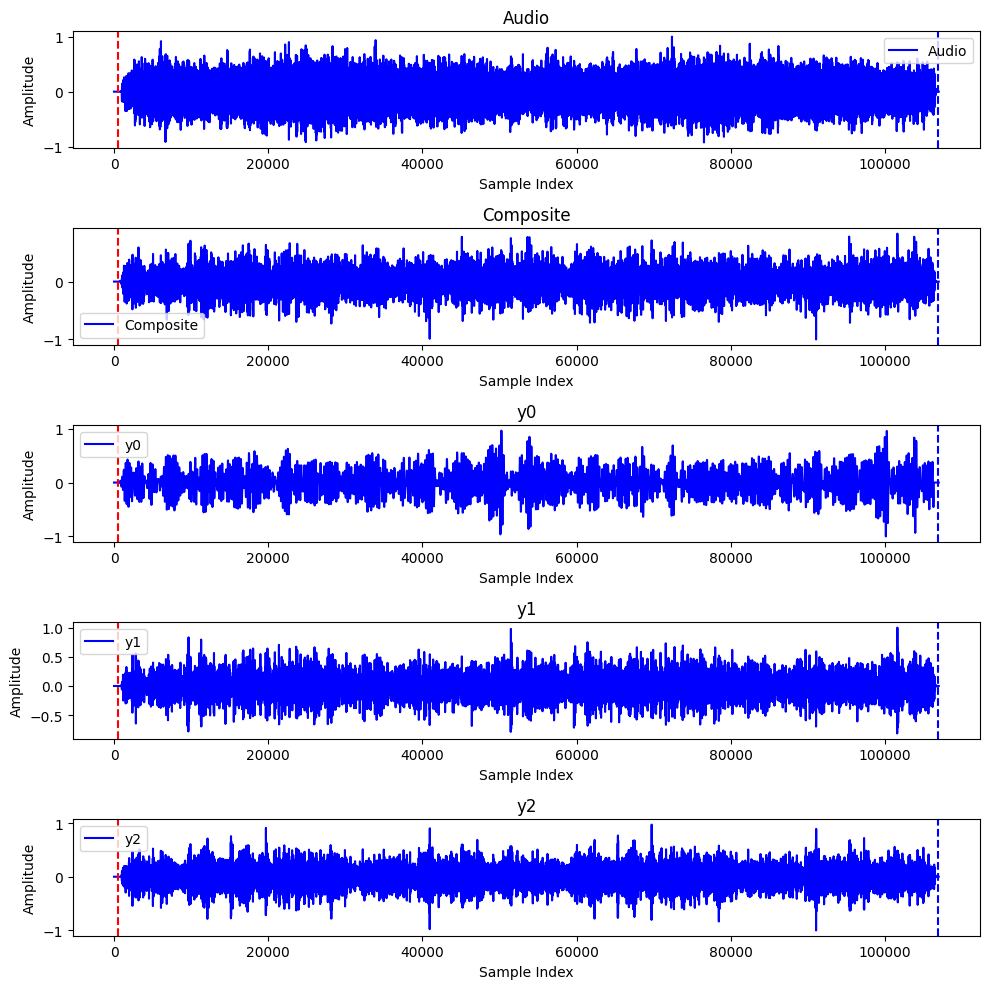

<Figure size 640x480 with 0 Axes>

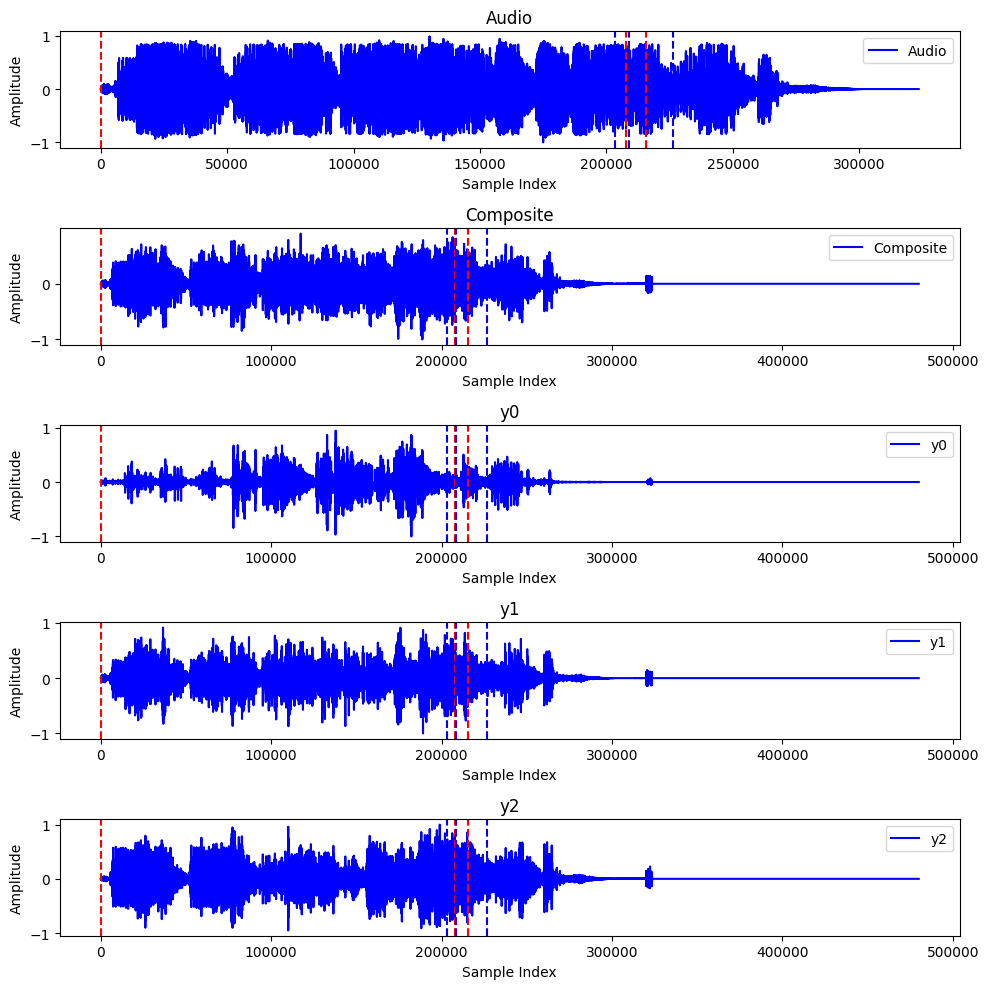

<Figure size 640x480 with 0 Axes>

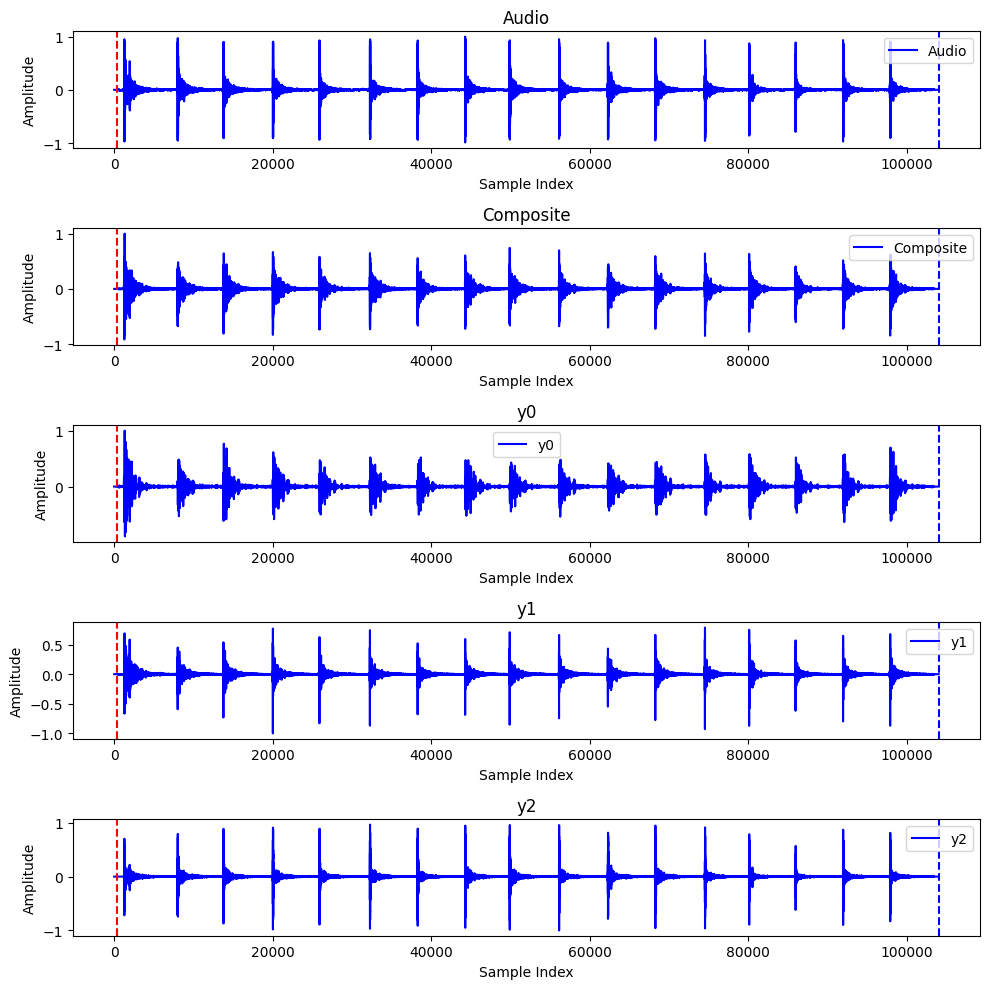

<Figure size 640x480 with 0 Axes>

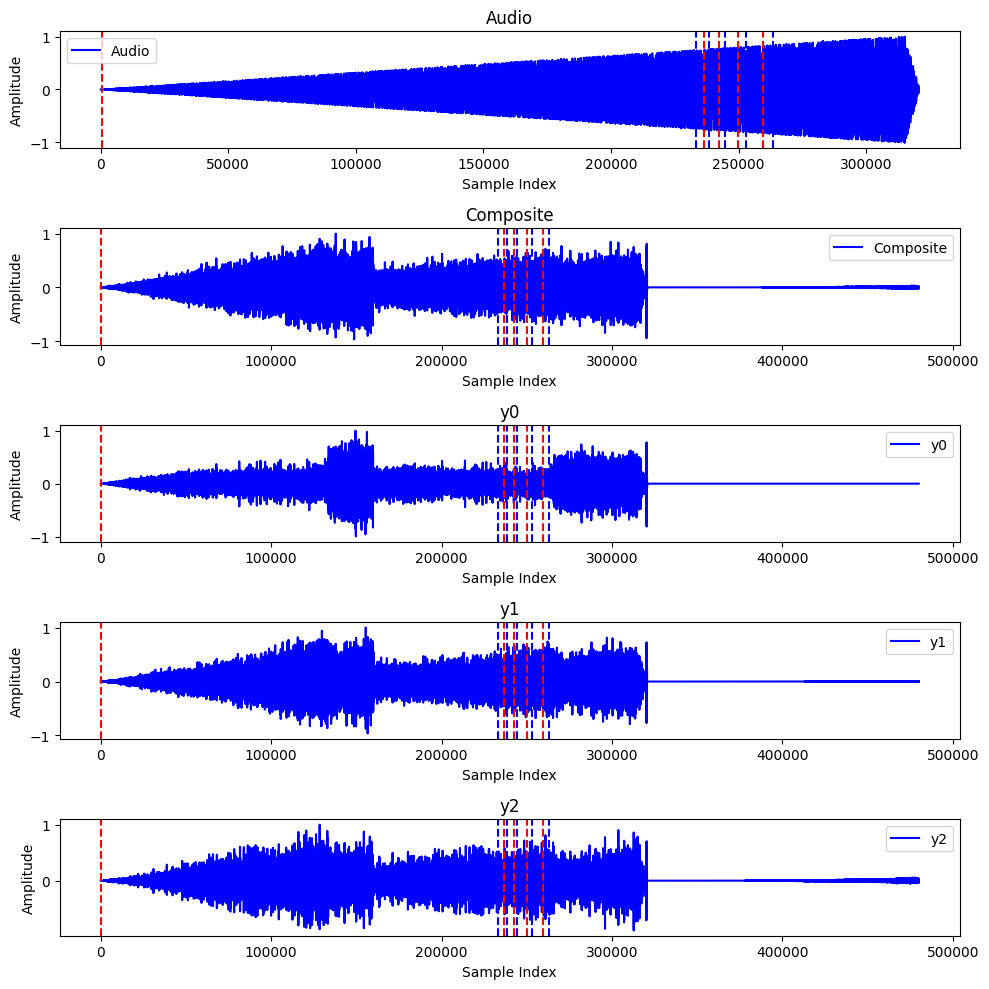

<Figure size 640x480 with 0 Axes>

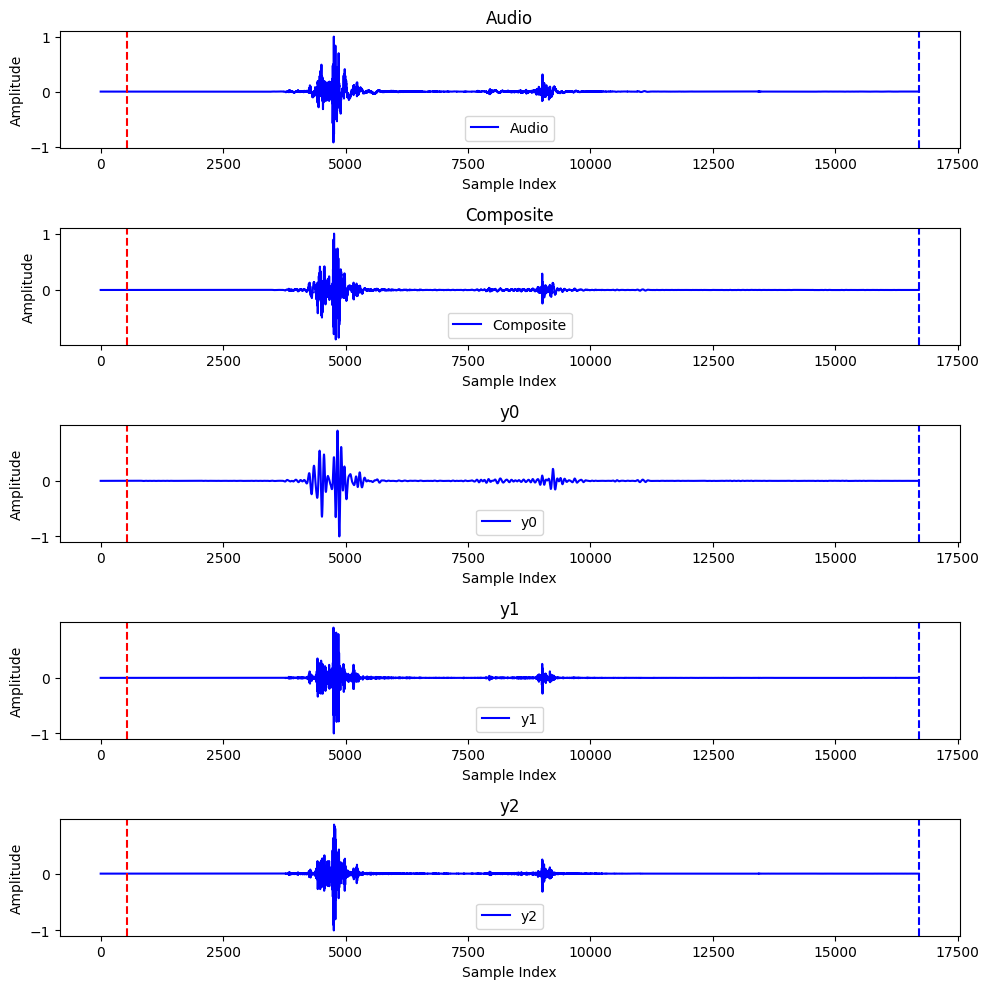

<Figure size 640x480 with 0 Axes>

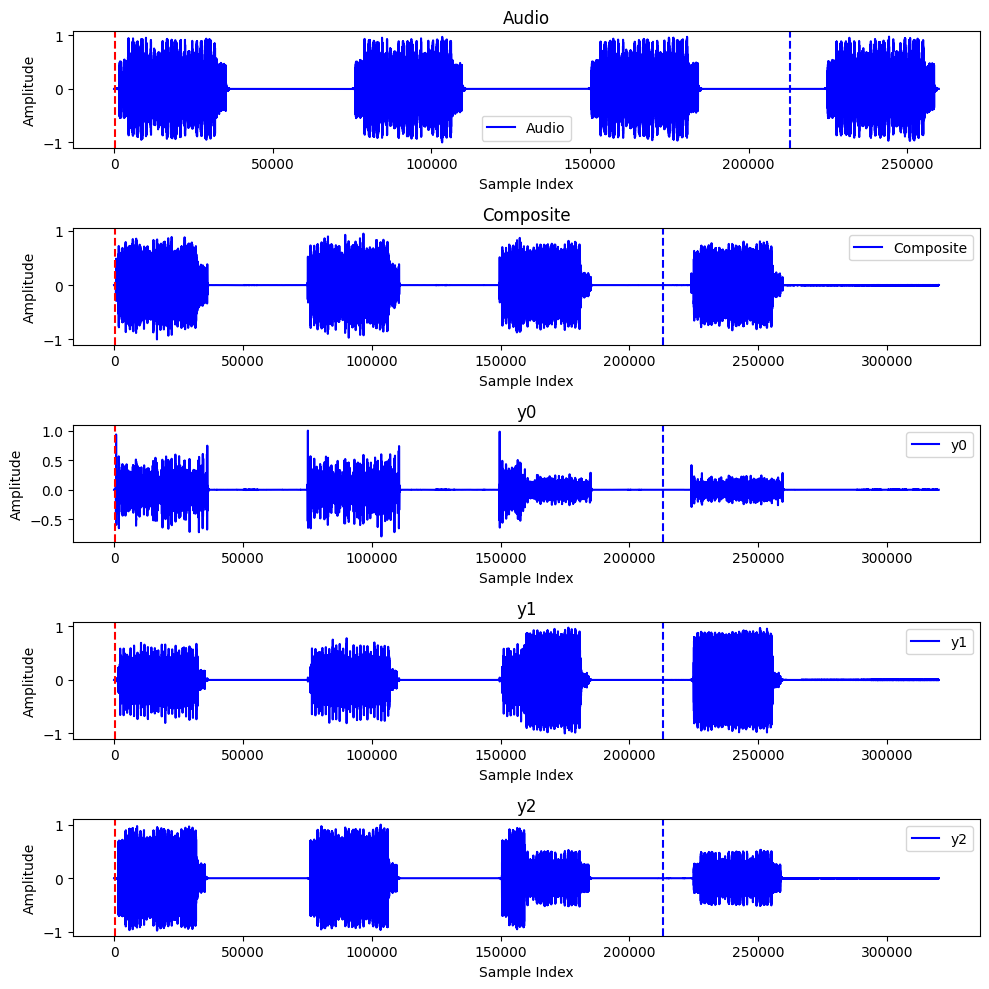

<Figure size 640x480 with 0 Axes>

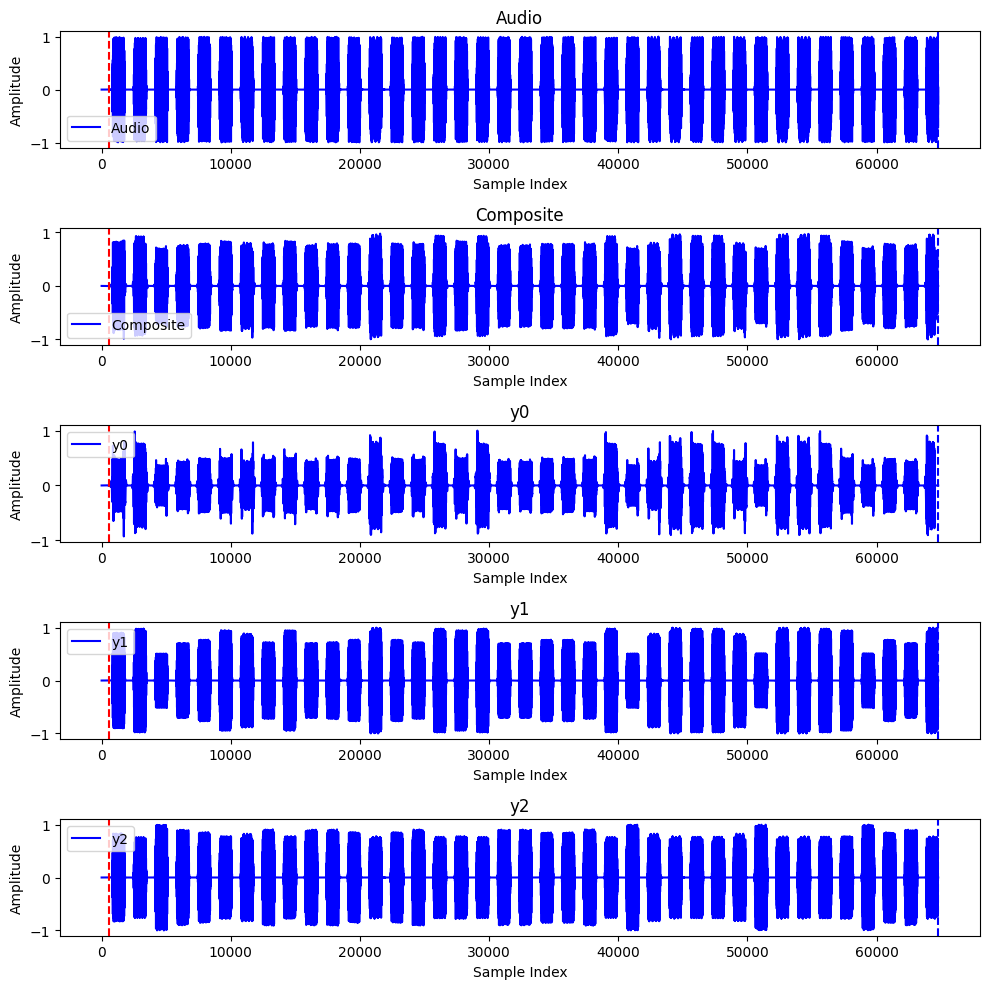

<Figure size 640x480 with 0 Axes>

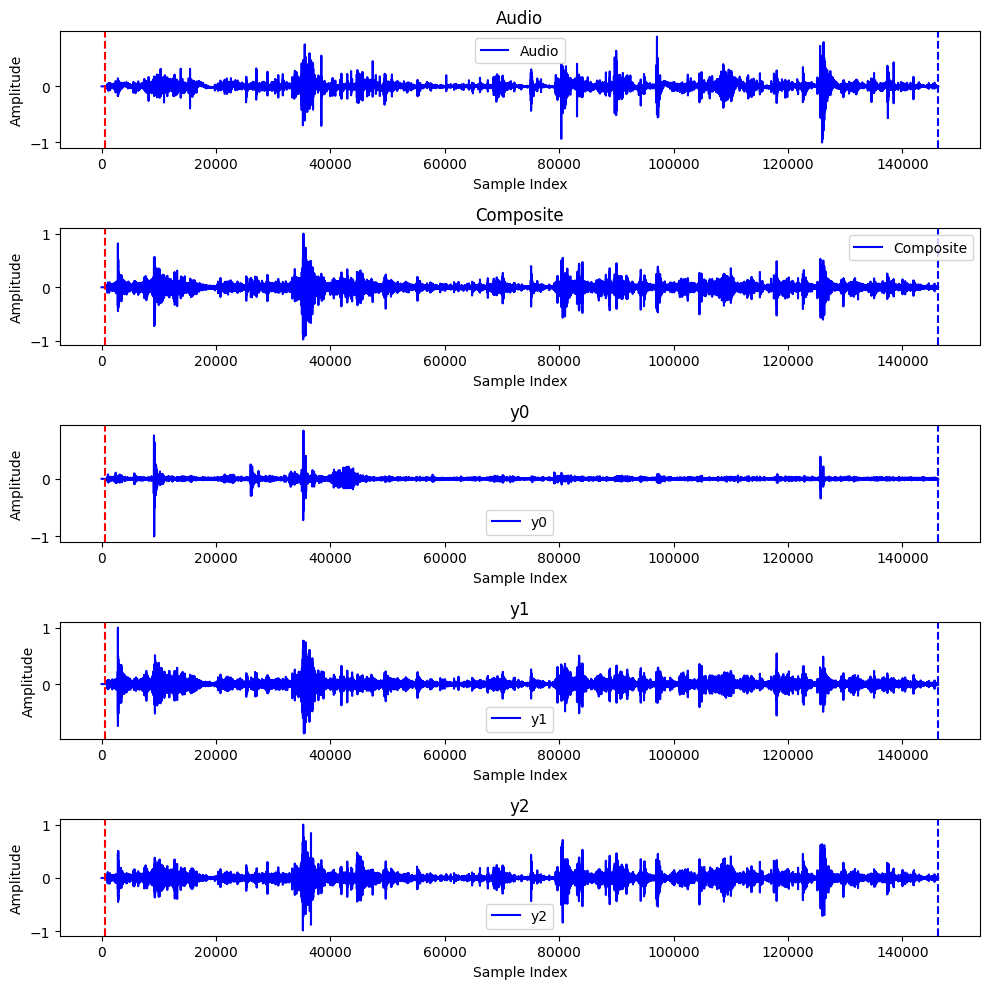

<Figure size 640x480 with 0 Axes>

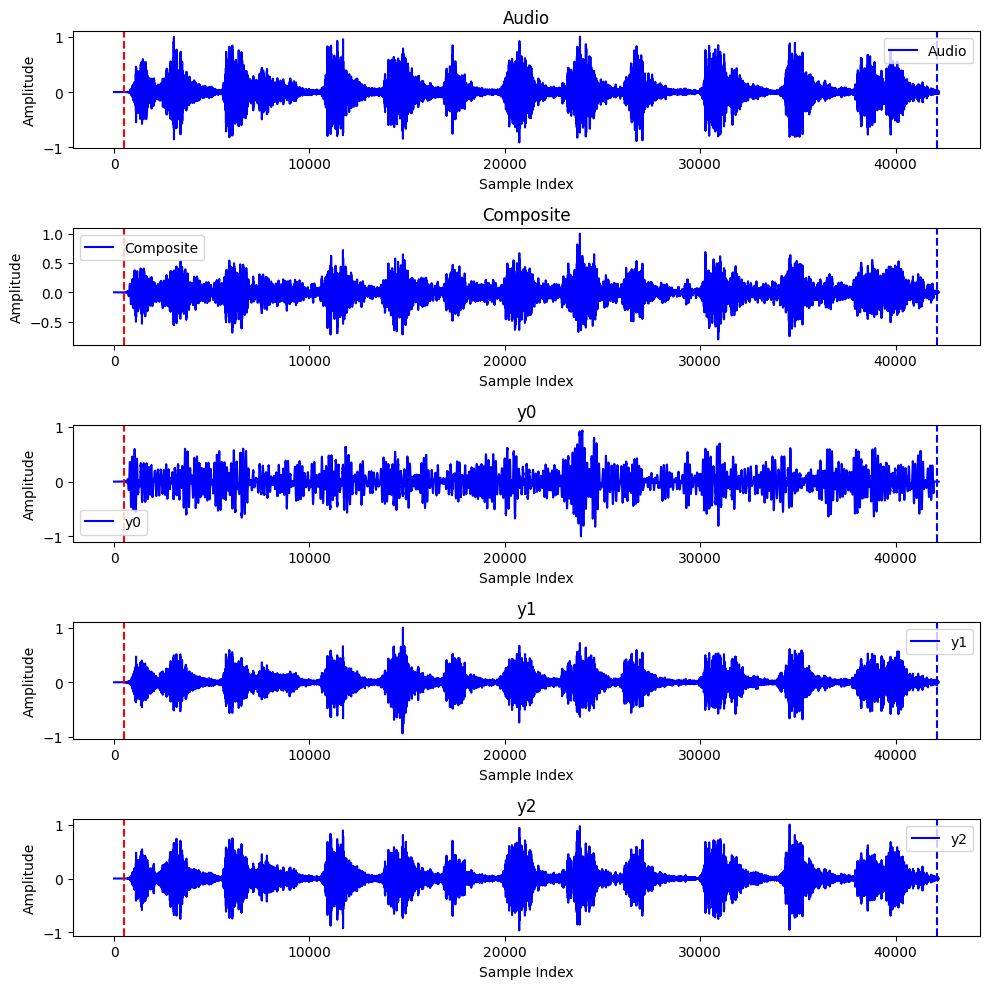

<Figure size 640x480 with 0 Axes>

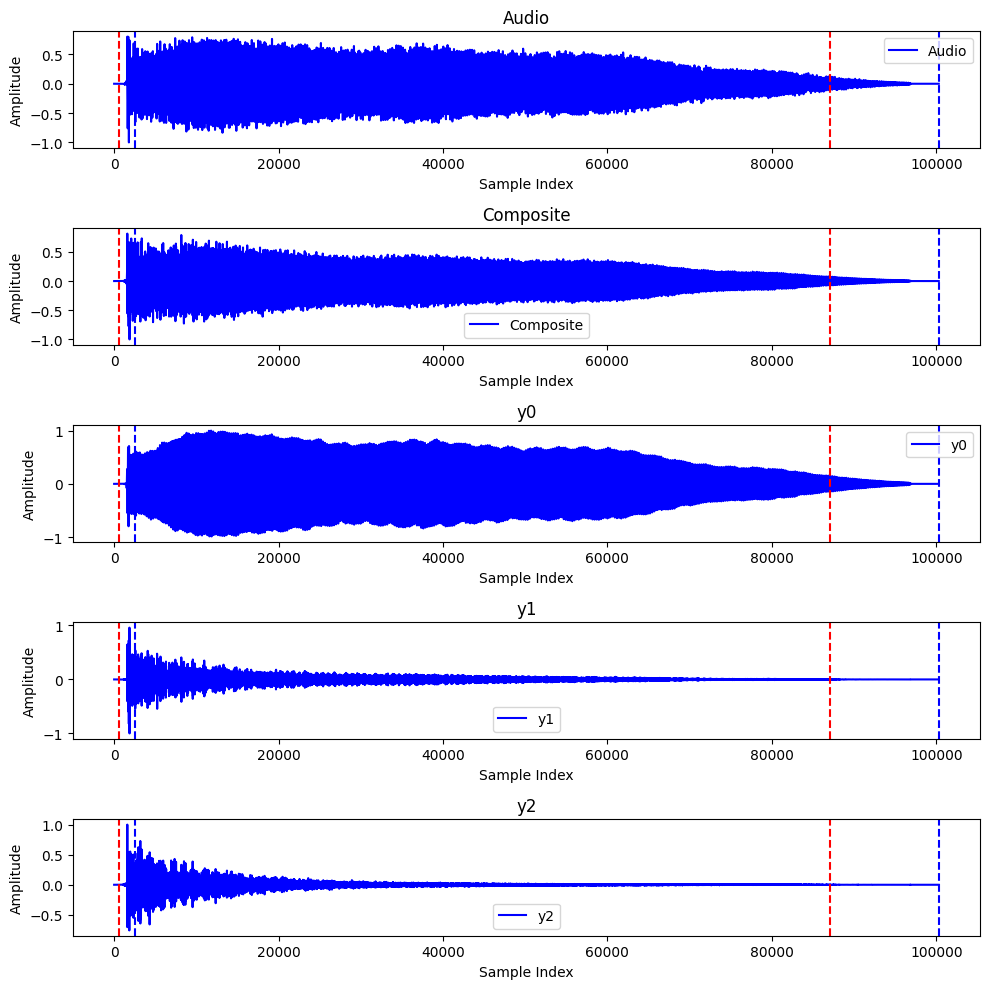

<Figure size 640x480 with 0 Axes>

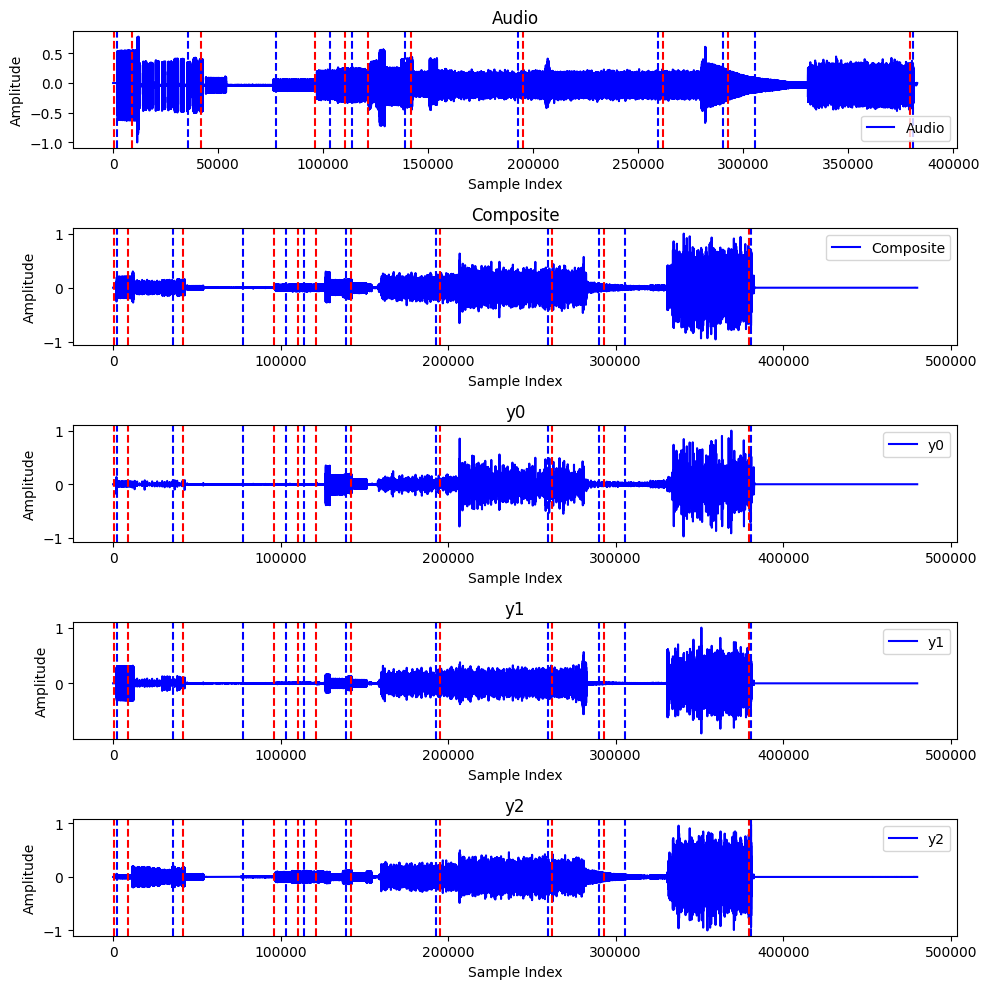

<Figure size 640x480 with 0 Axes>

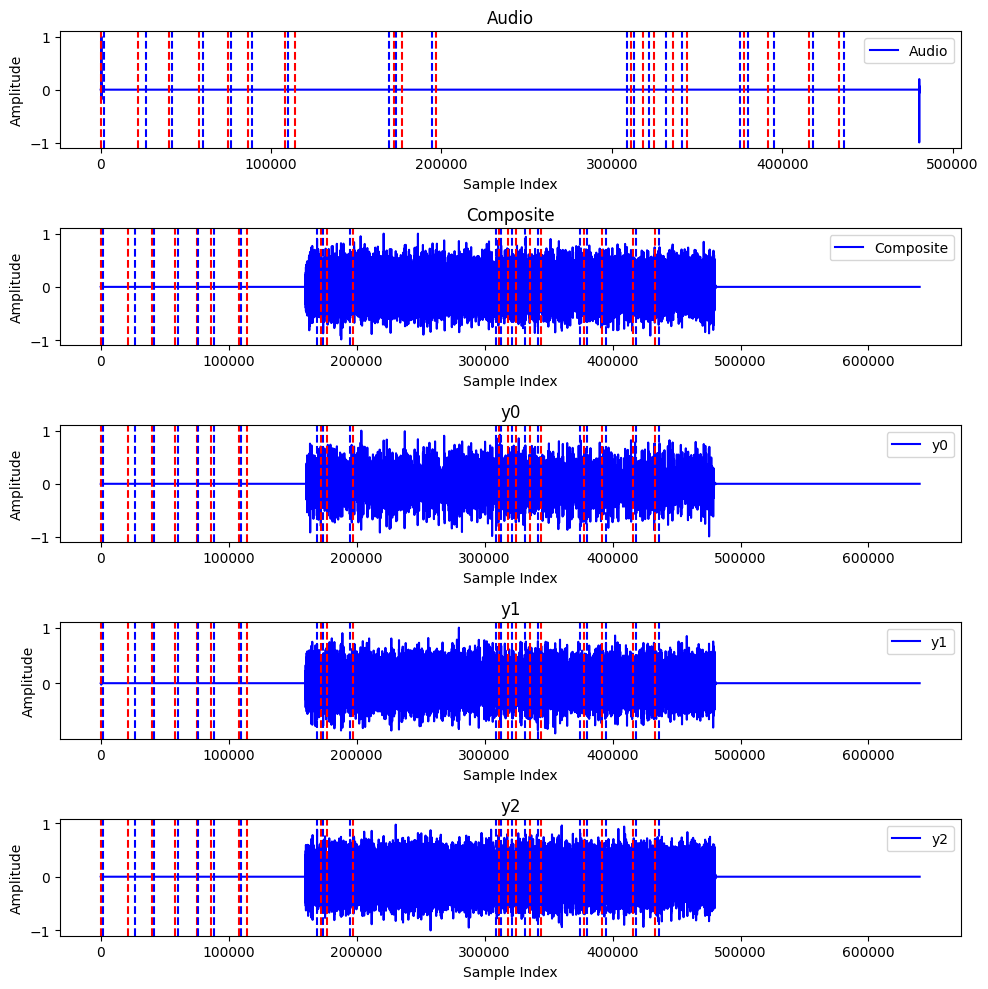

<Figure size 640x480 with 0 Axes>

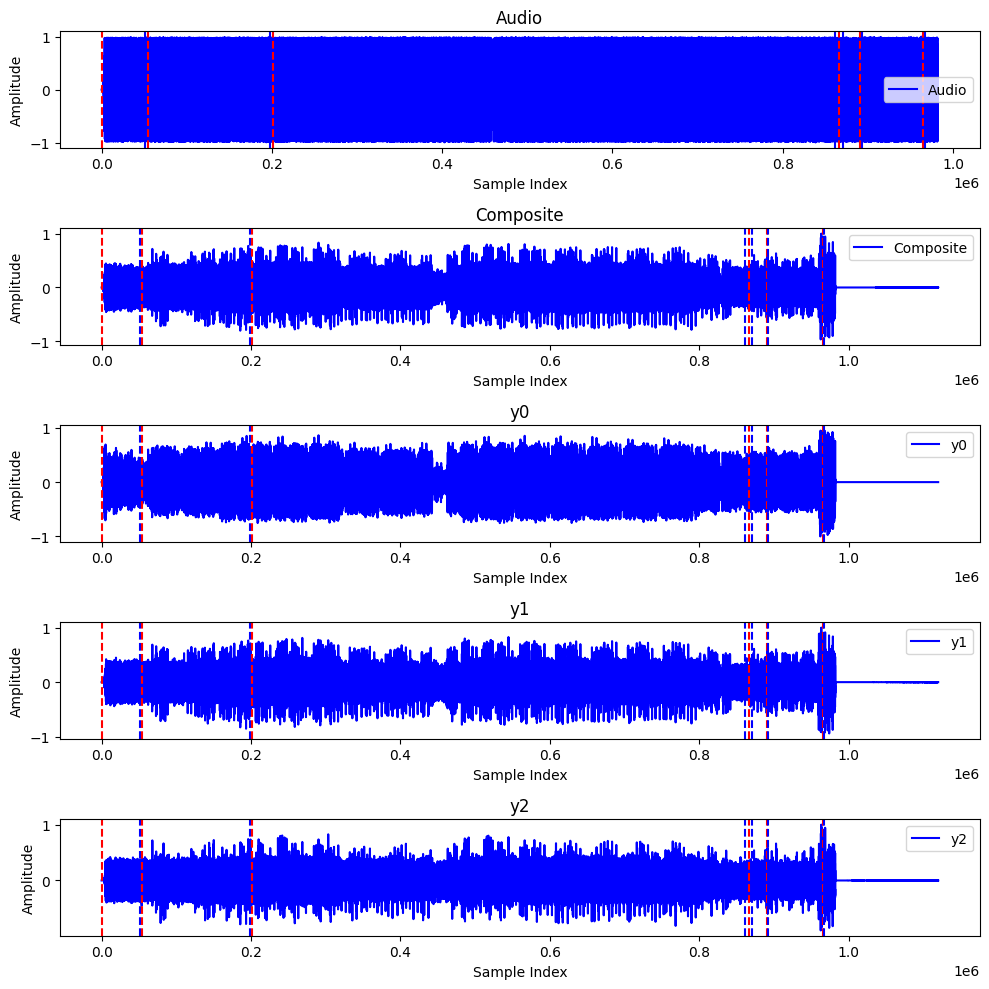

<Figure size 640x480 with 0 Axes>

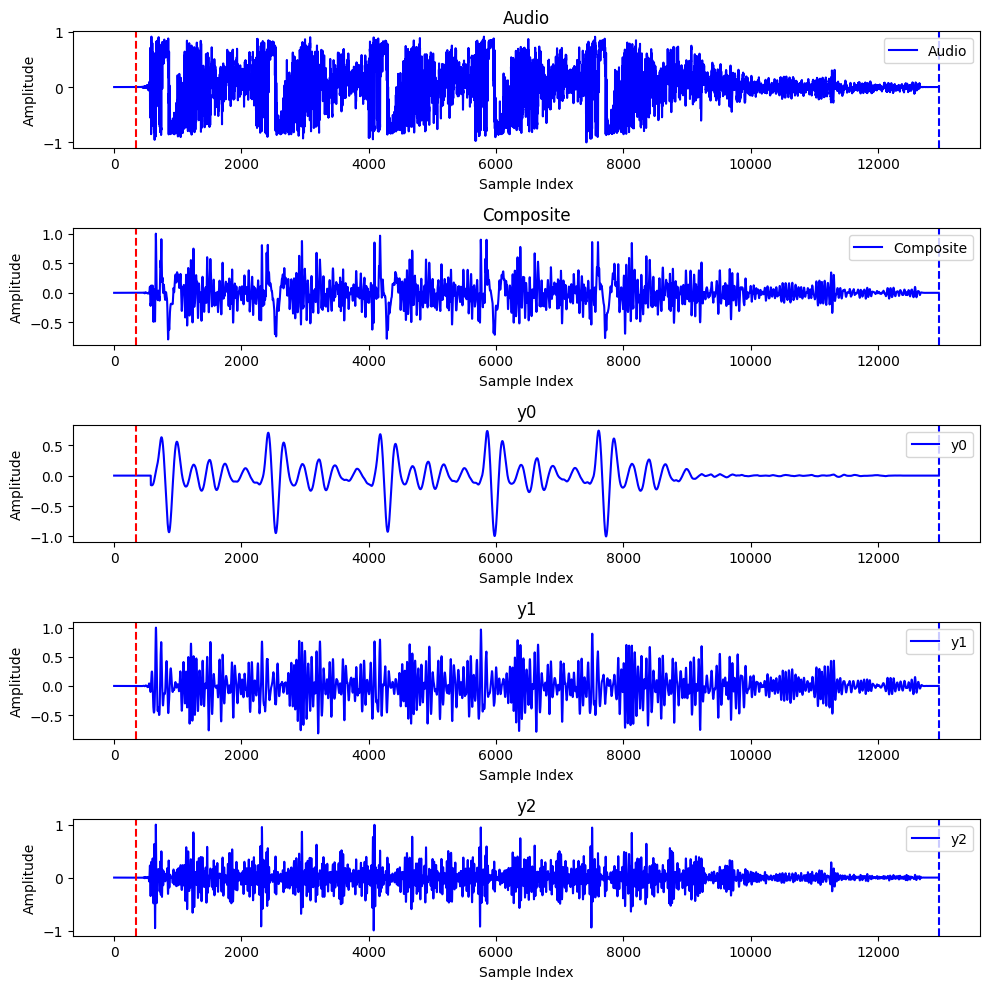

<Figure size 640x480 with 0 Axes>

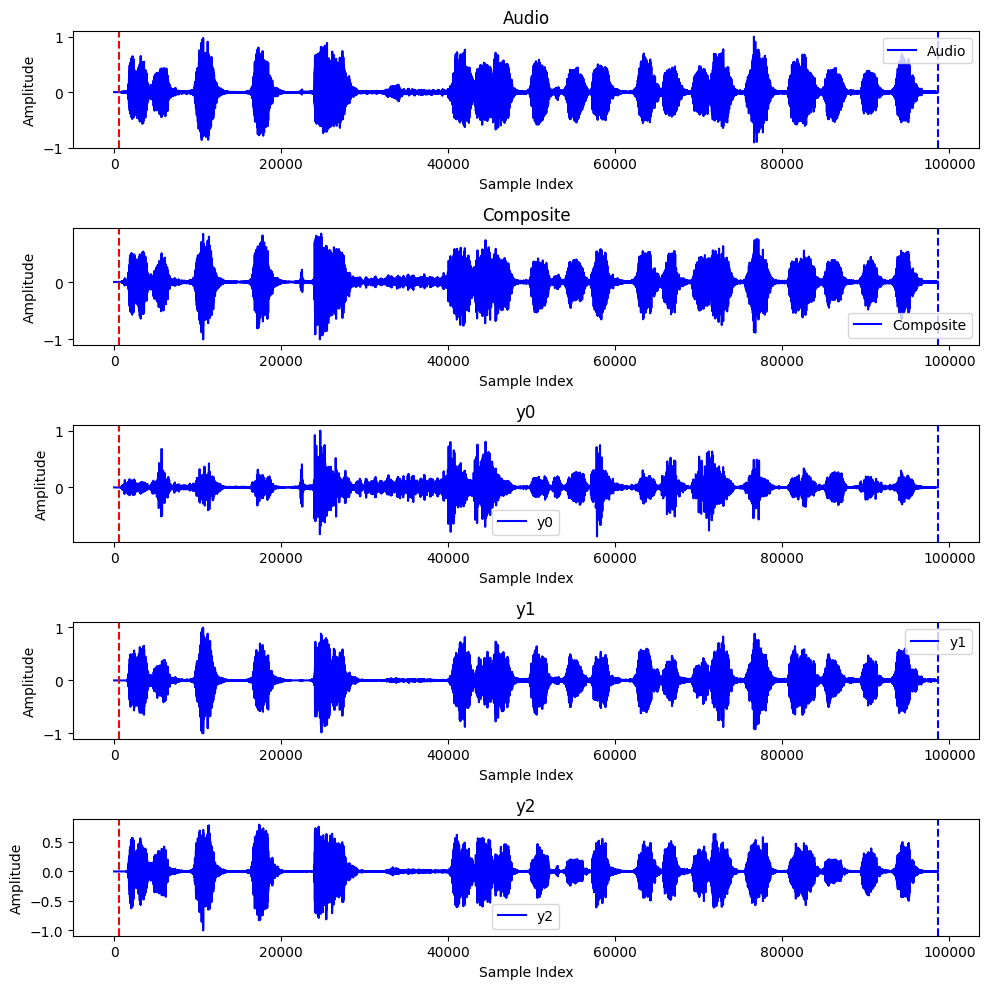

<Figure size 640x480 with 0 Axes>

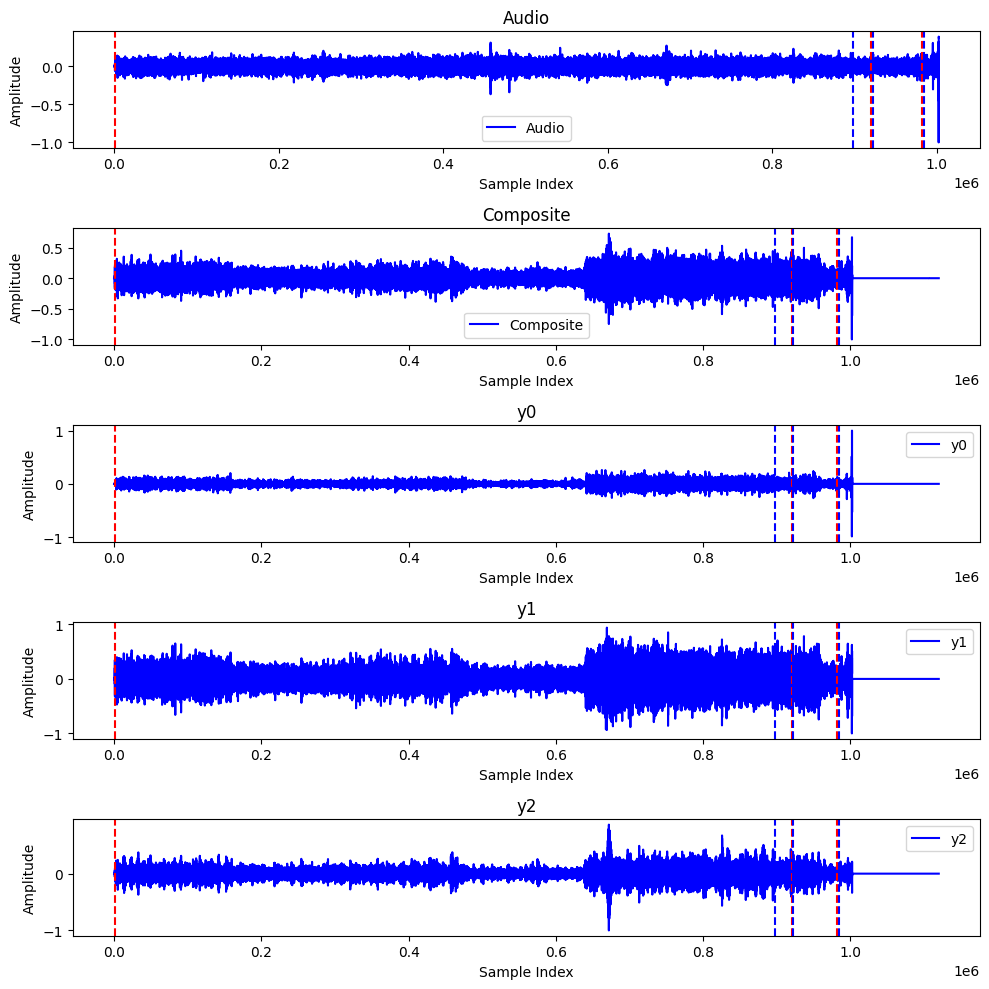

<Figure size 640x480 with 0 Axes>

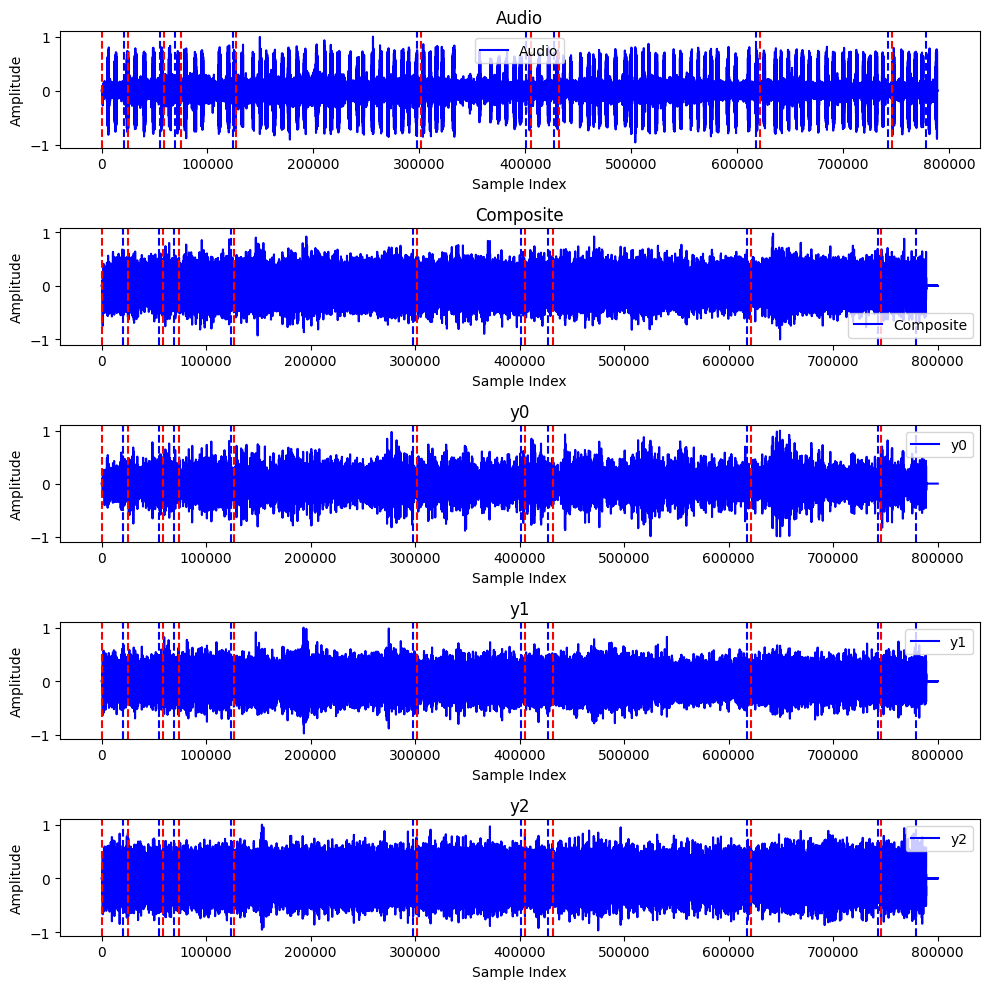

<Figure size 640x480 with 0 Axes>

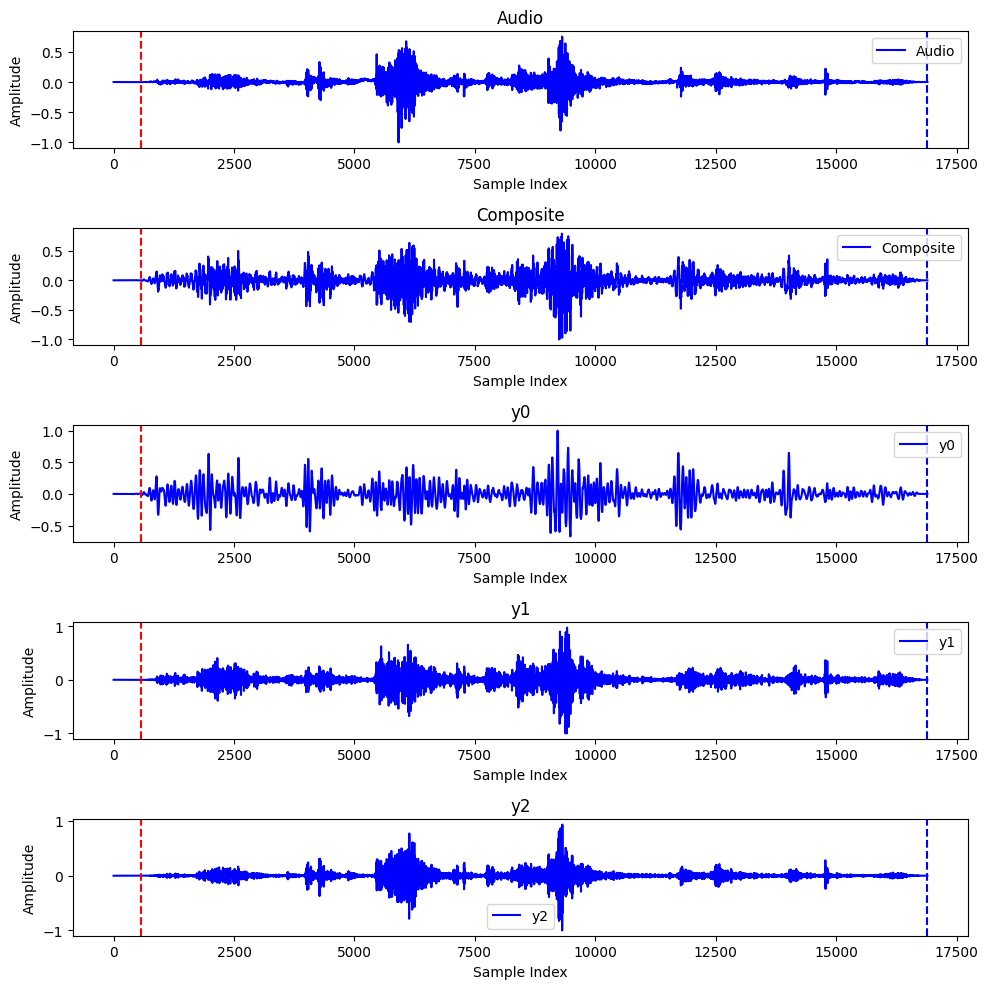

<Figure size 640x480 with 0 Axes>

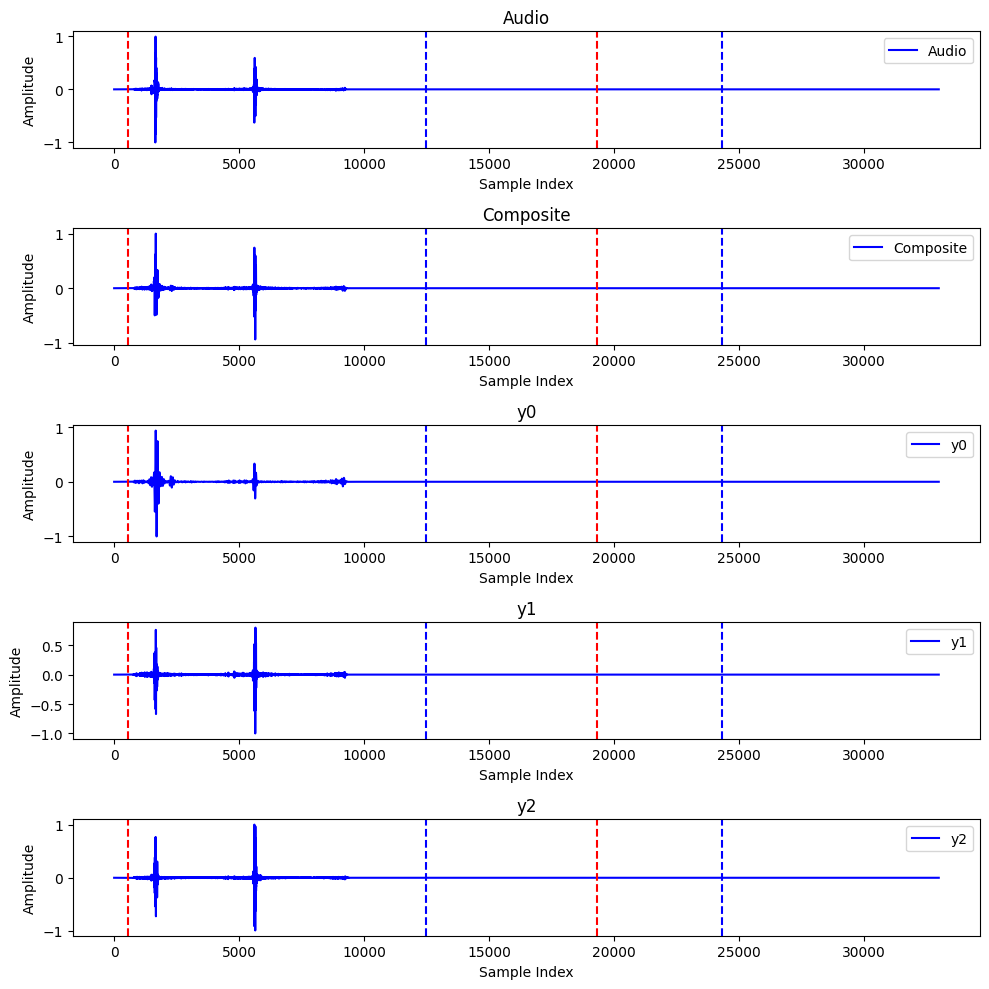

<Figure size 640x480 with 0 Axes>

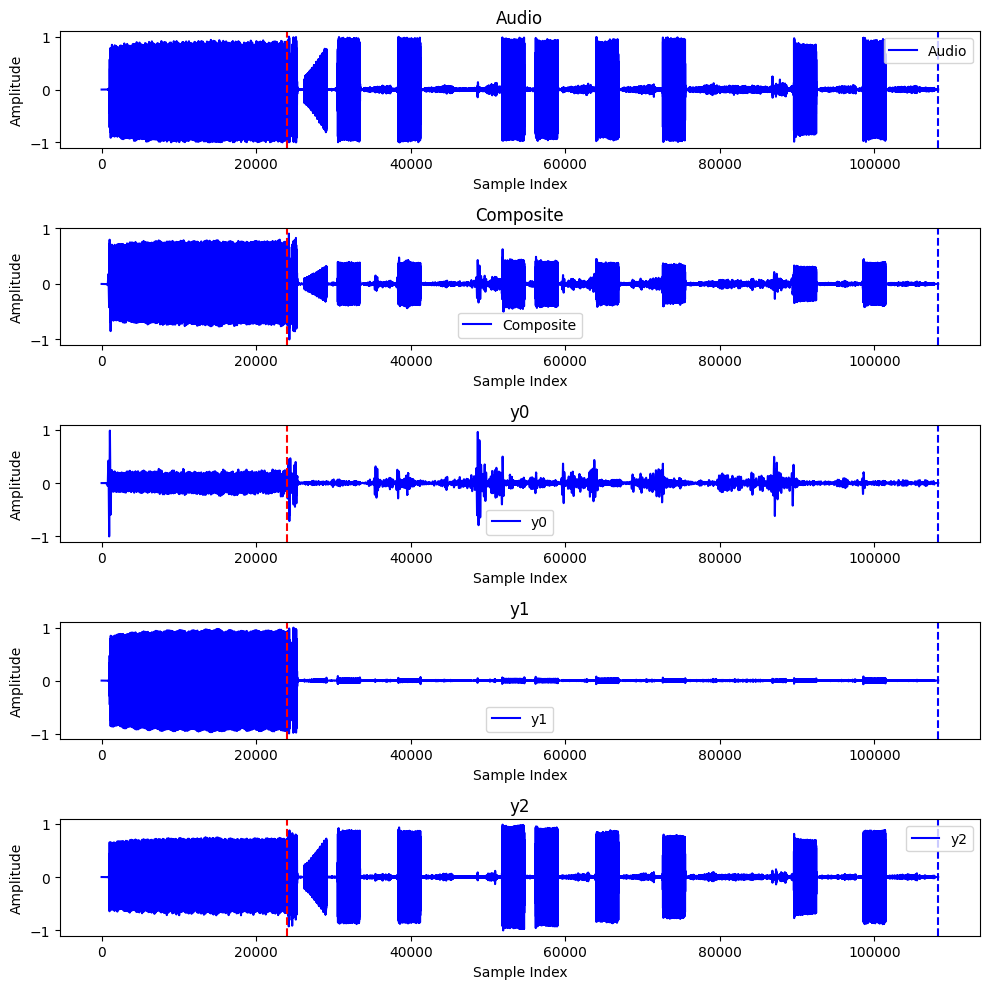

<Figure size 640x480 with 0 Axes>

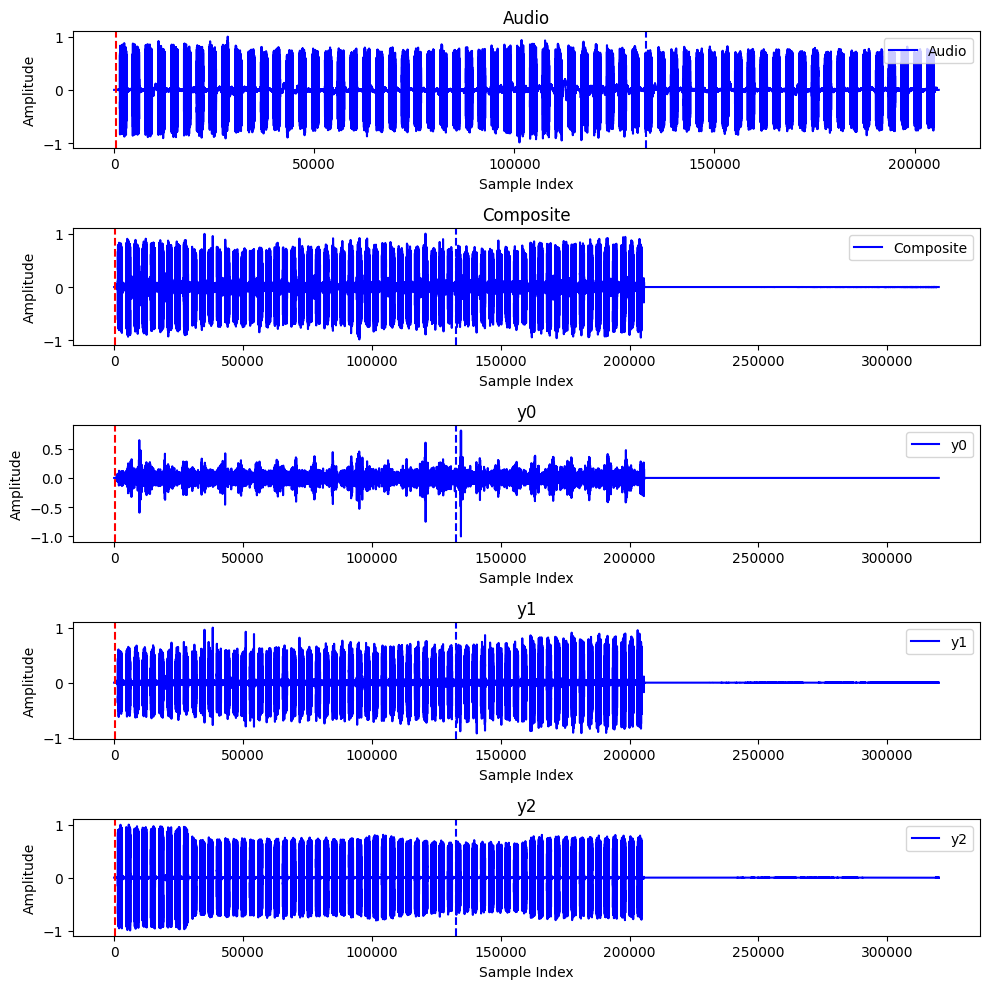

<Figure size 640x480 with 0 Axes>

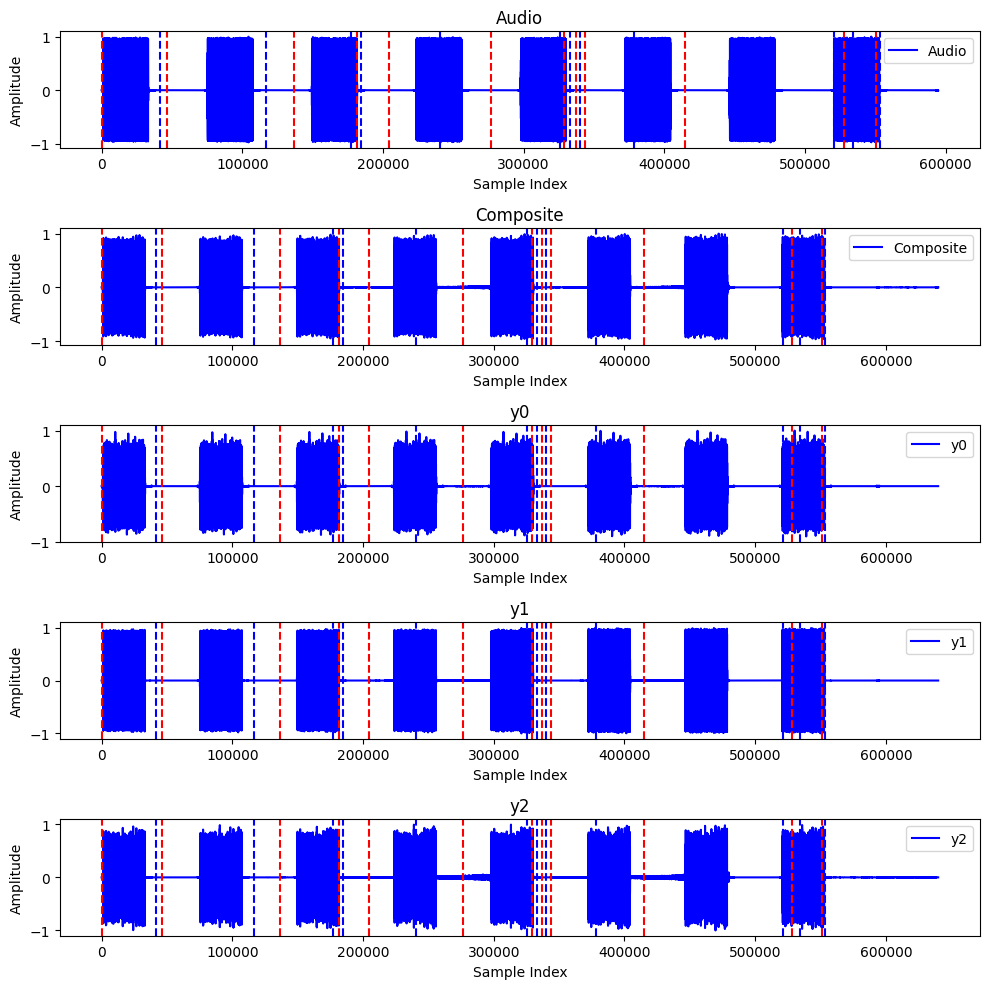

<Figure size 640x480 with 0 Axes>

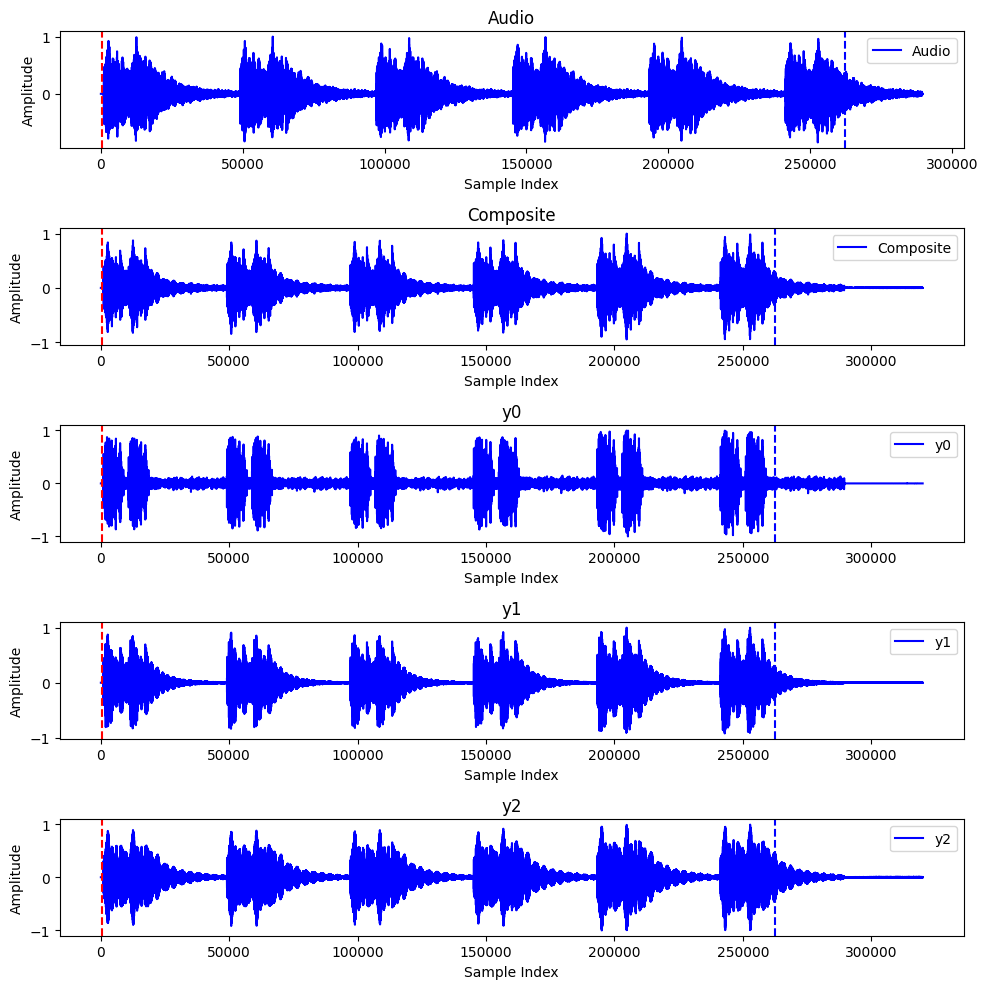

<Figure size 640x480 with 0 Axes>

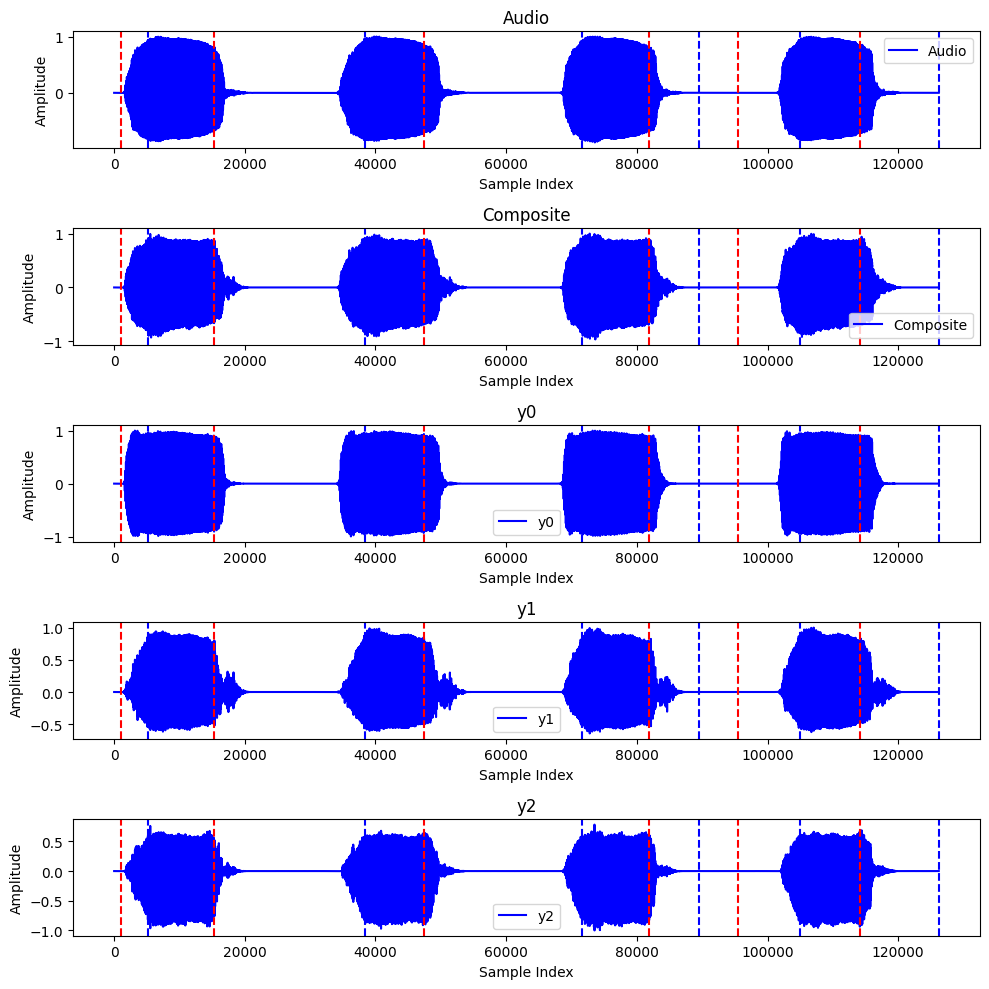

<Figure size 640x480 with 0 Axes>

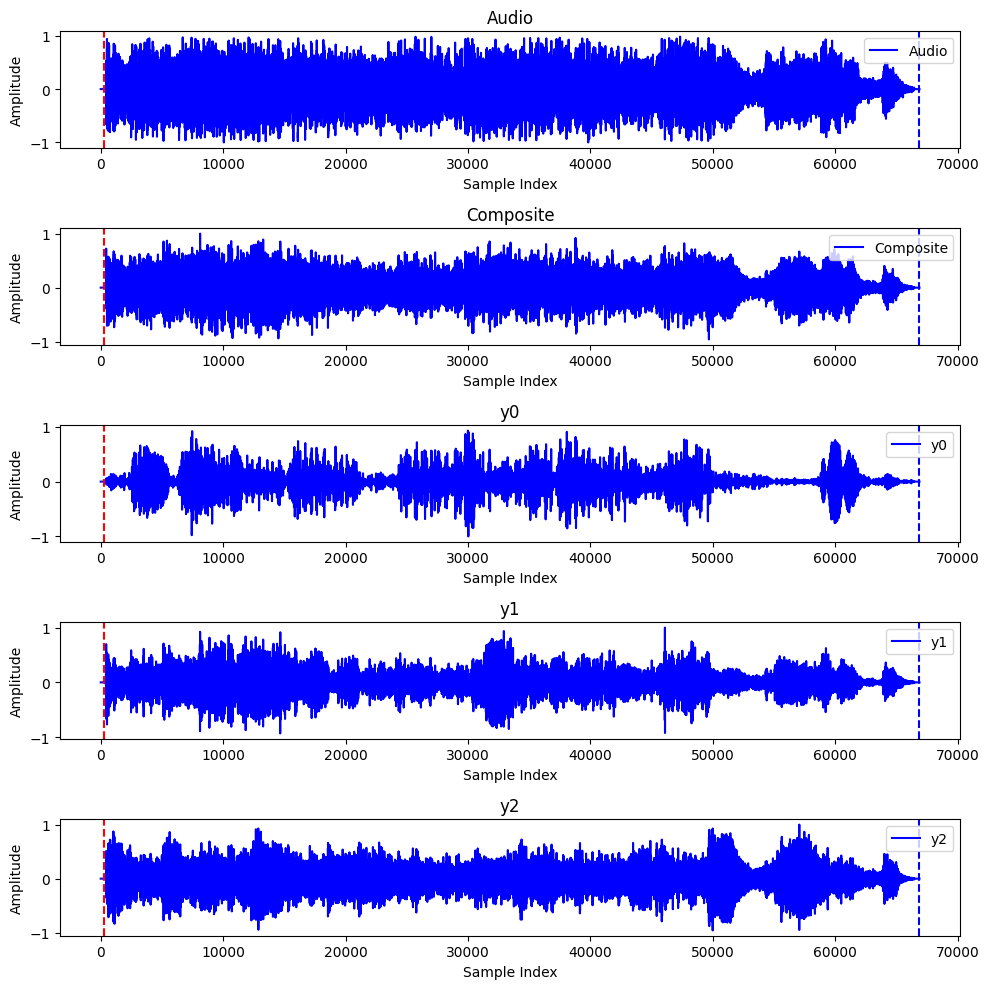

<Figure size 640x480 with 0 Axes>

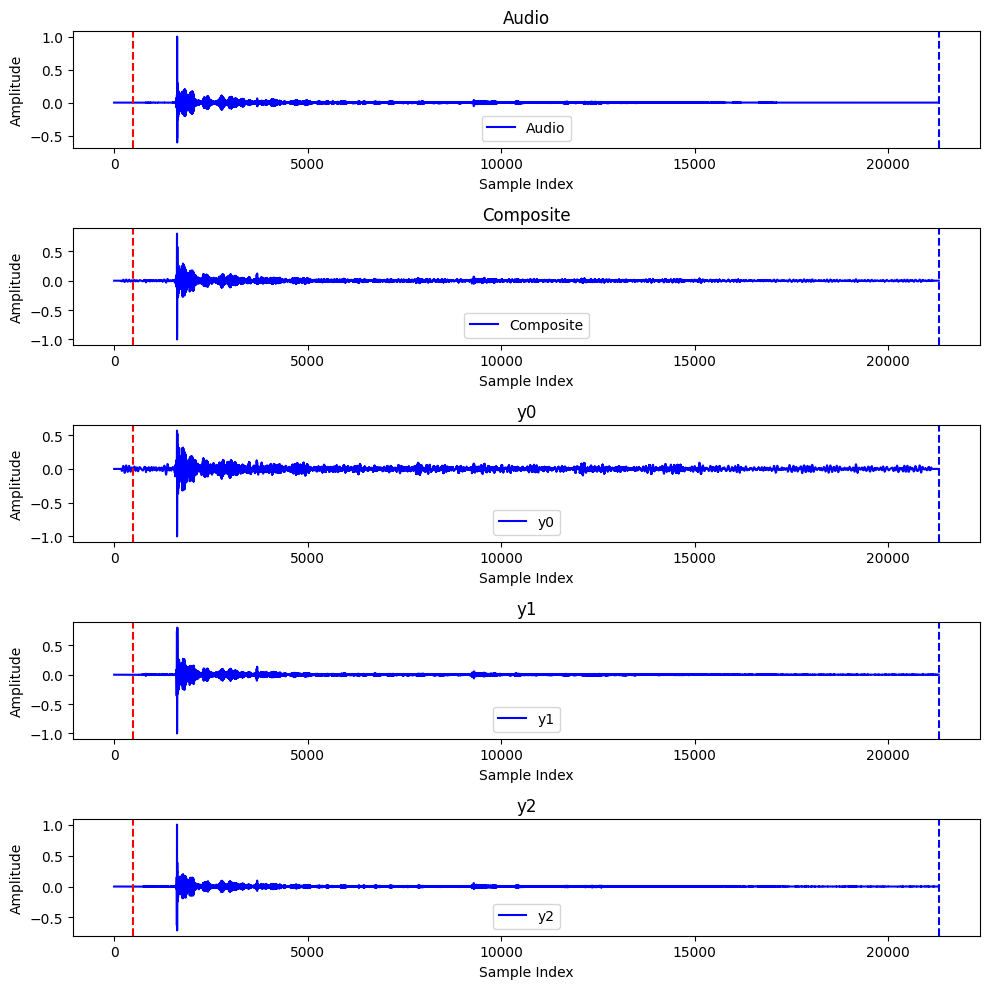

<Figure size 640x480 with 0 Axes>

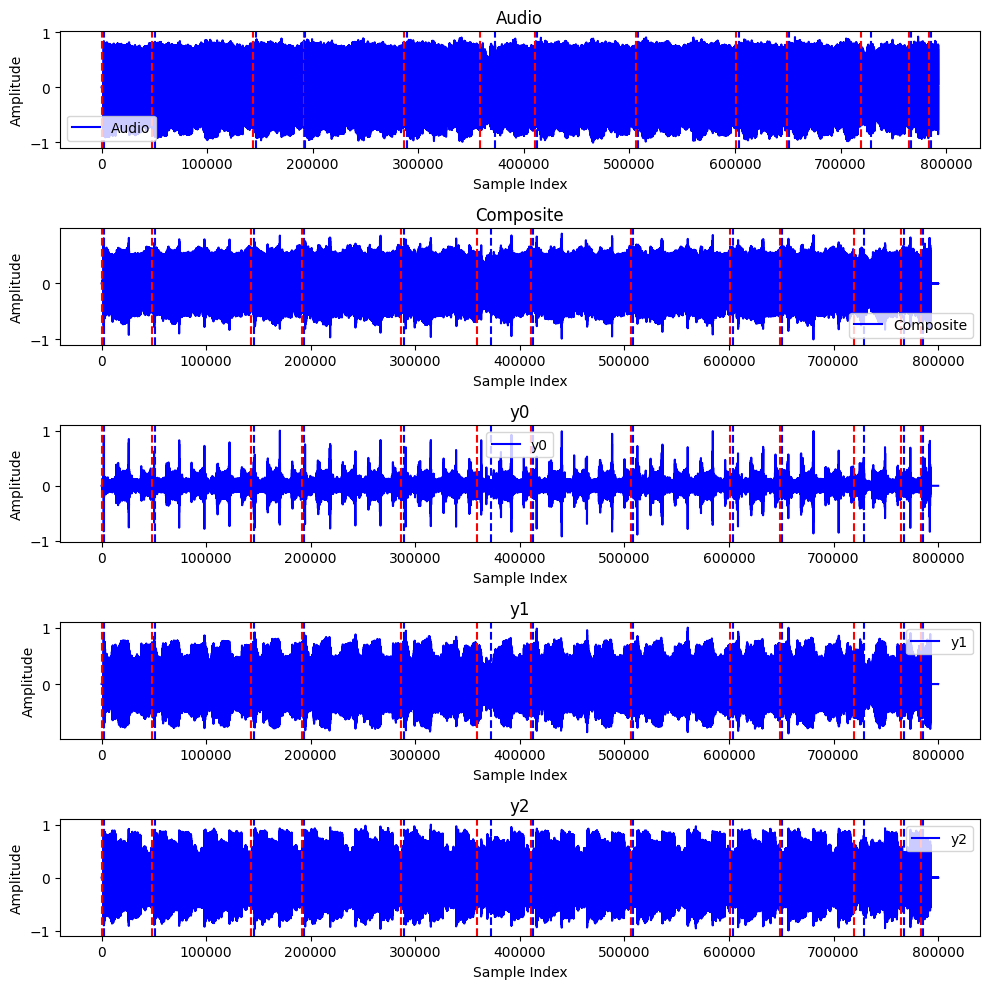

<Figure size 640x480 with 0 Axes>

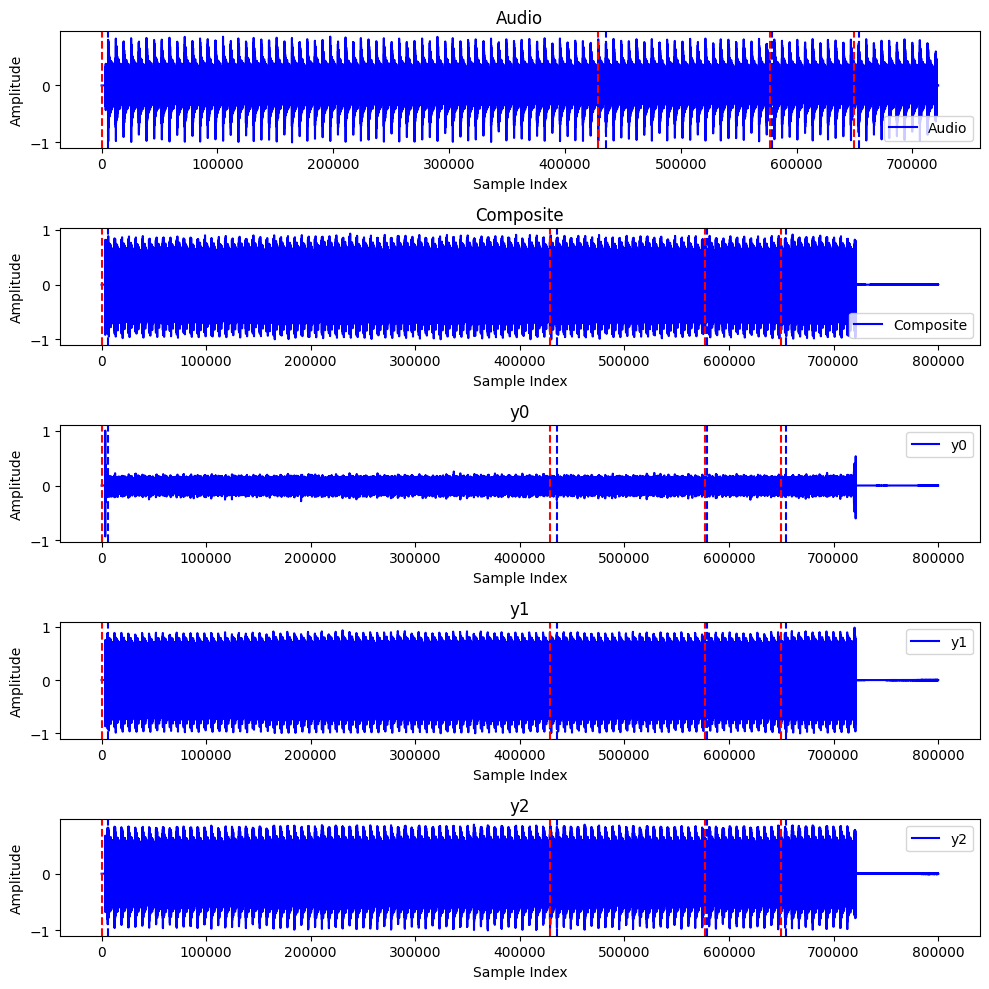

<Figure size 640x480 with 0 Axes>

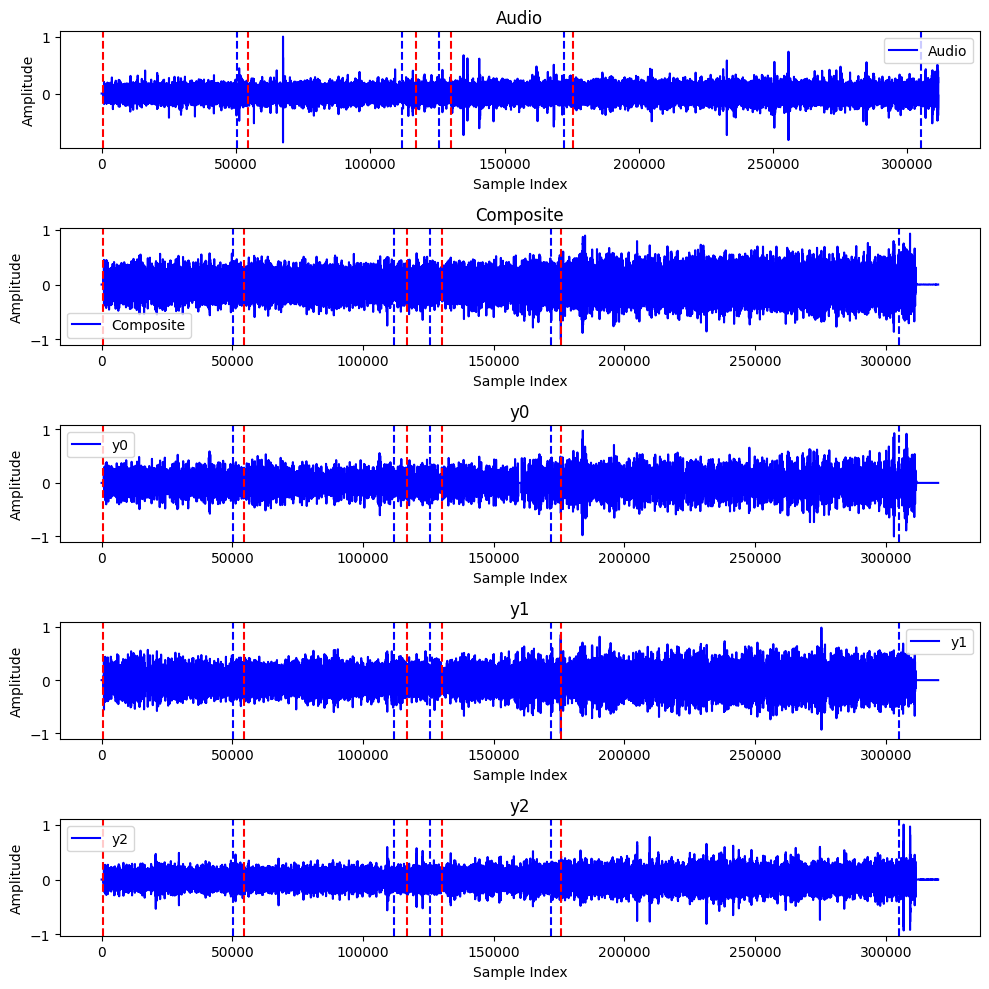

<Figure size 640x480 with 0 Axes>

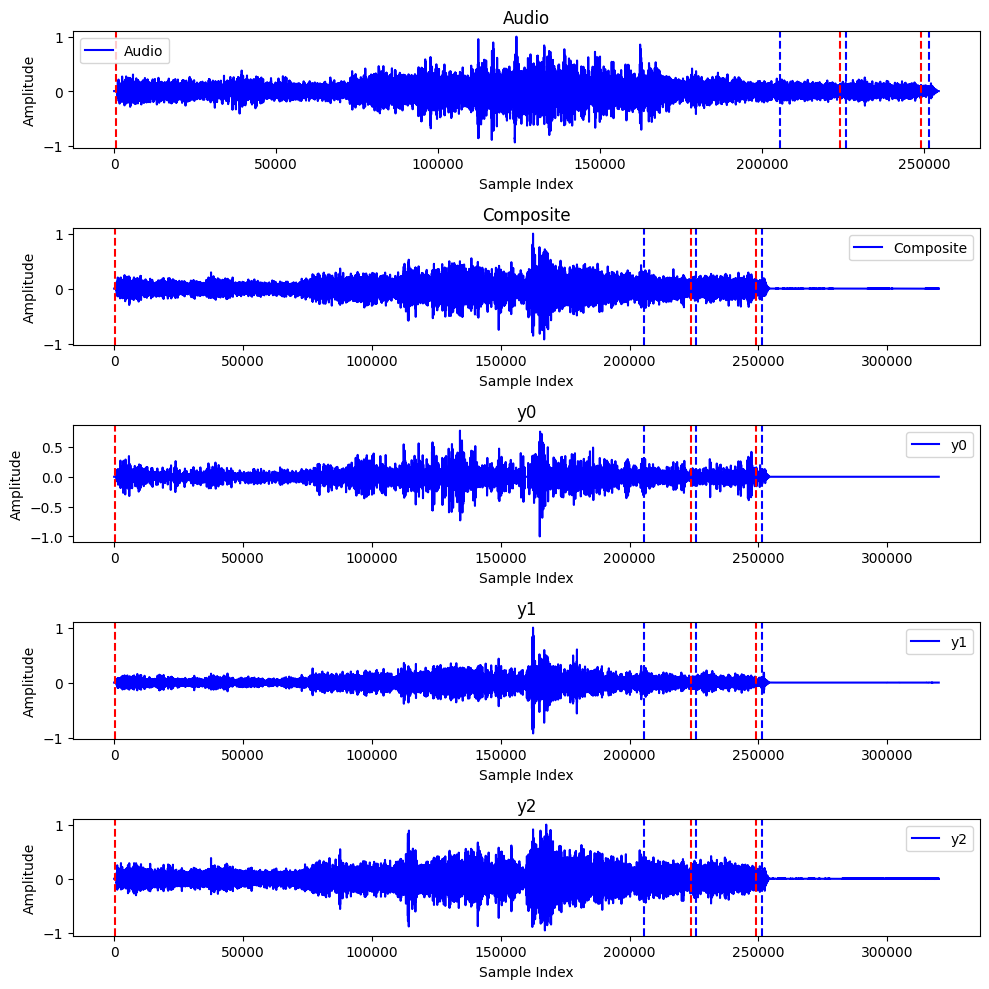

<Figure size 640x480 with 0 Axes>

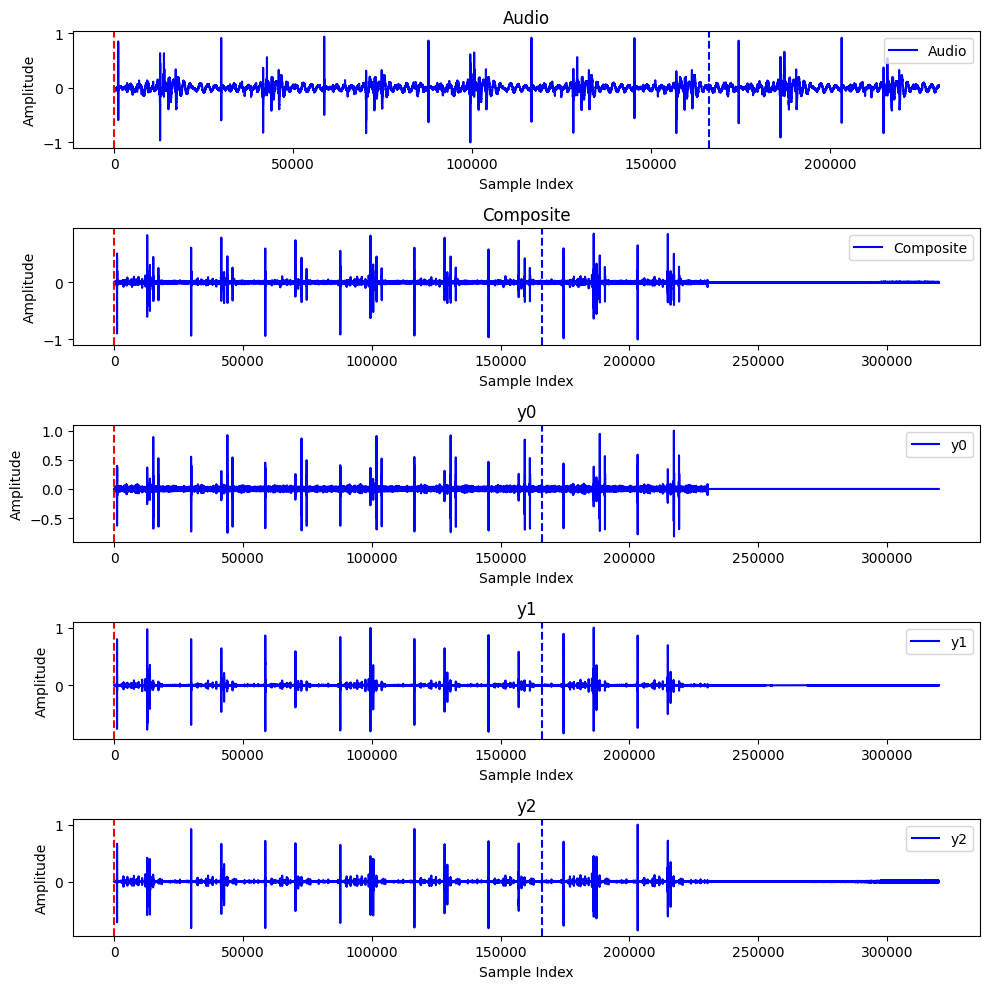

<Figure size 640x480 with 0 Axes>

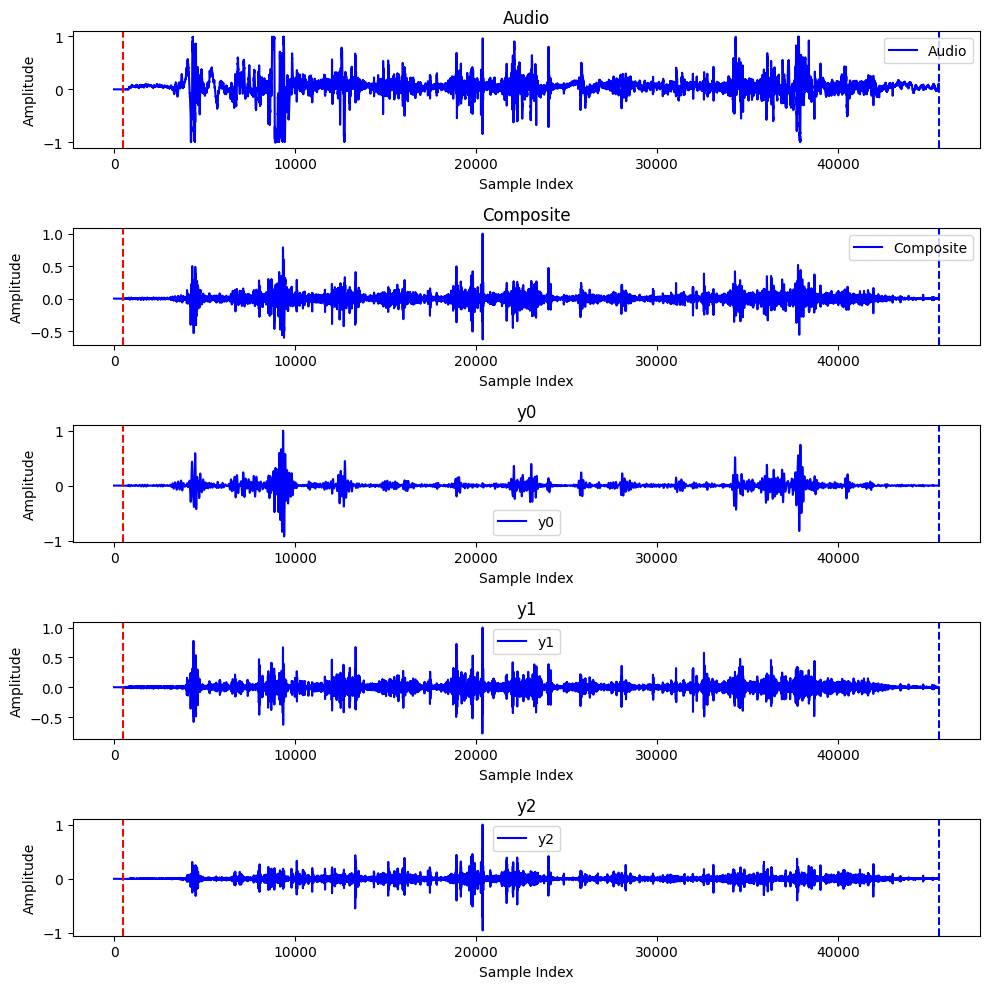

<Figure size 640x480 with 0 Axes>

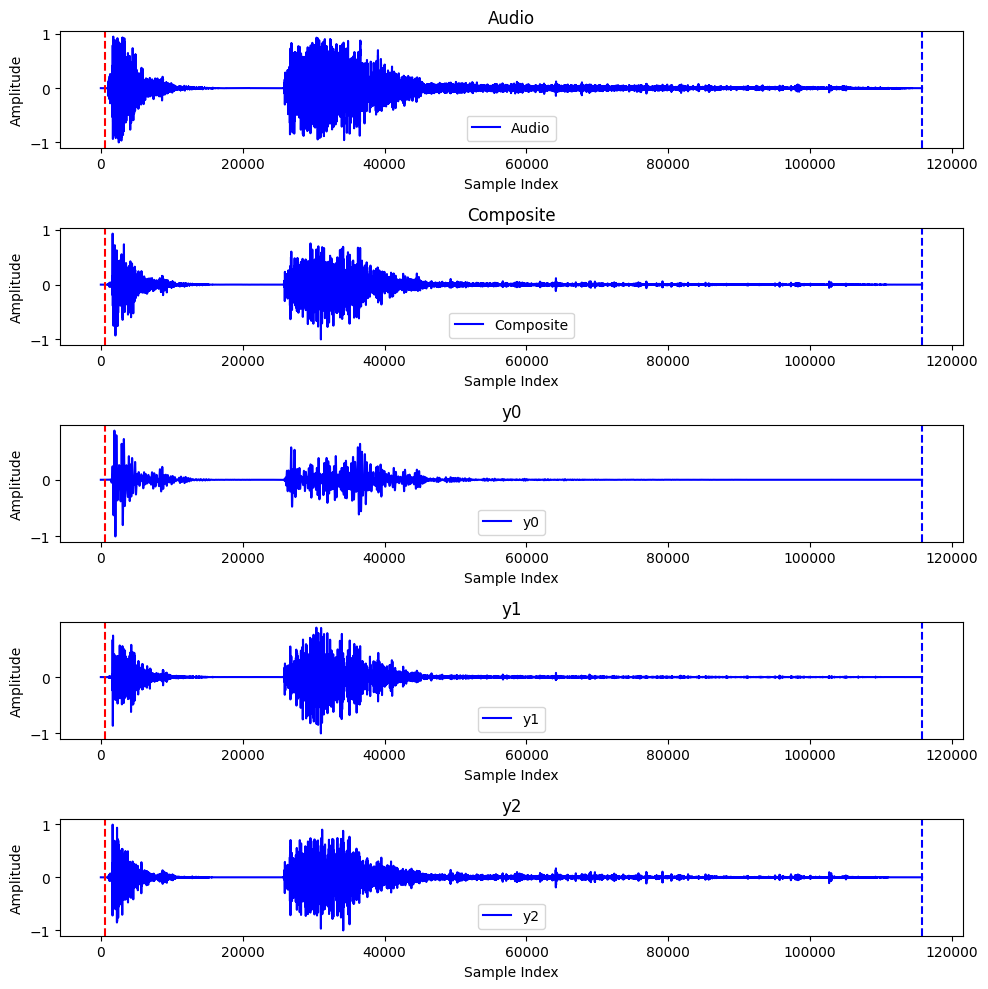

<Figure size 640x480 with 0 Axes>

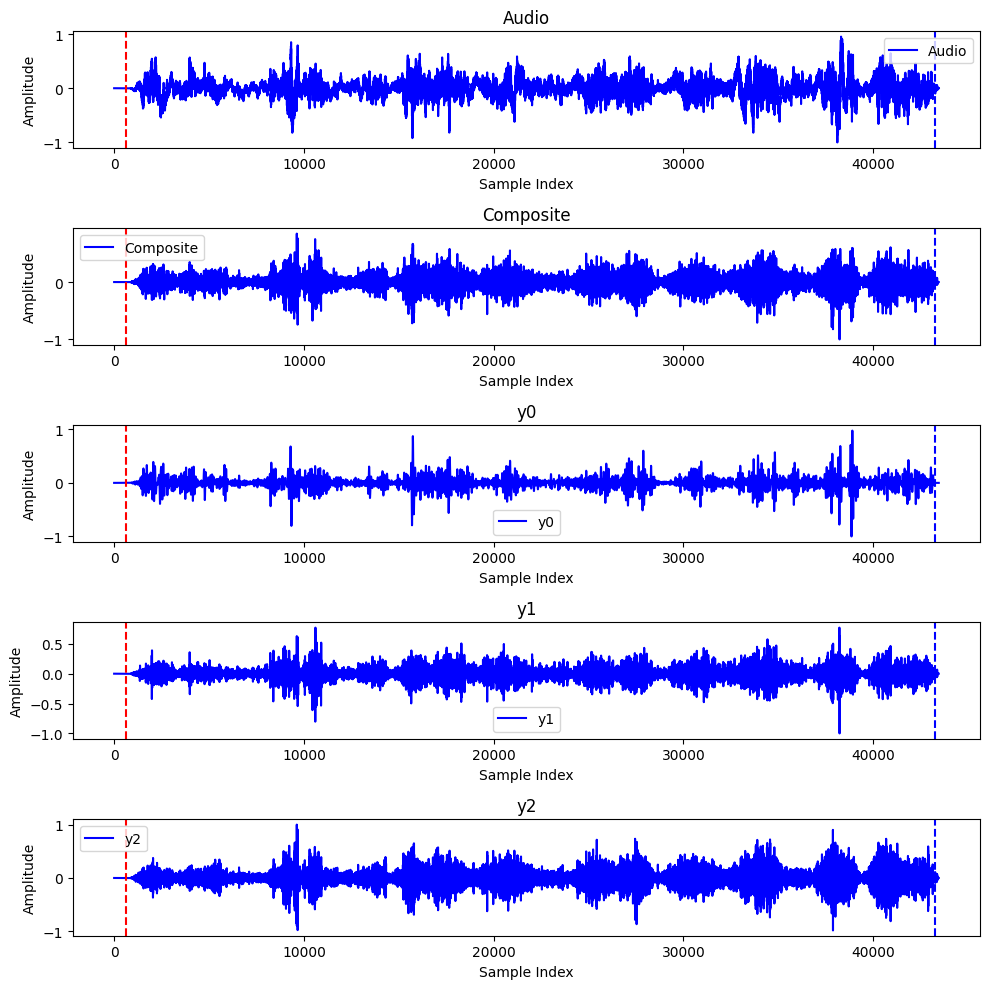

<Figure size 640x480 with 0 Axes>

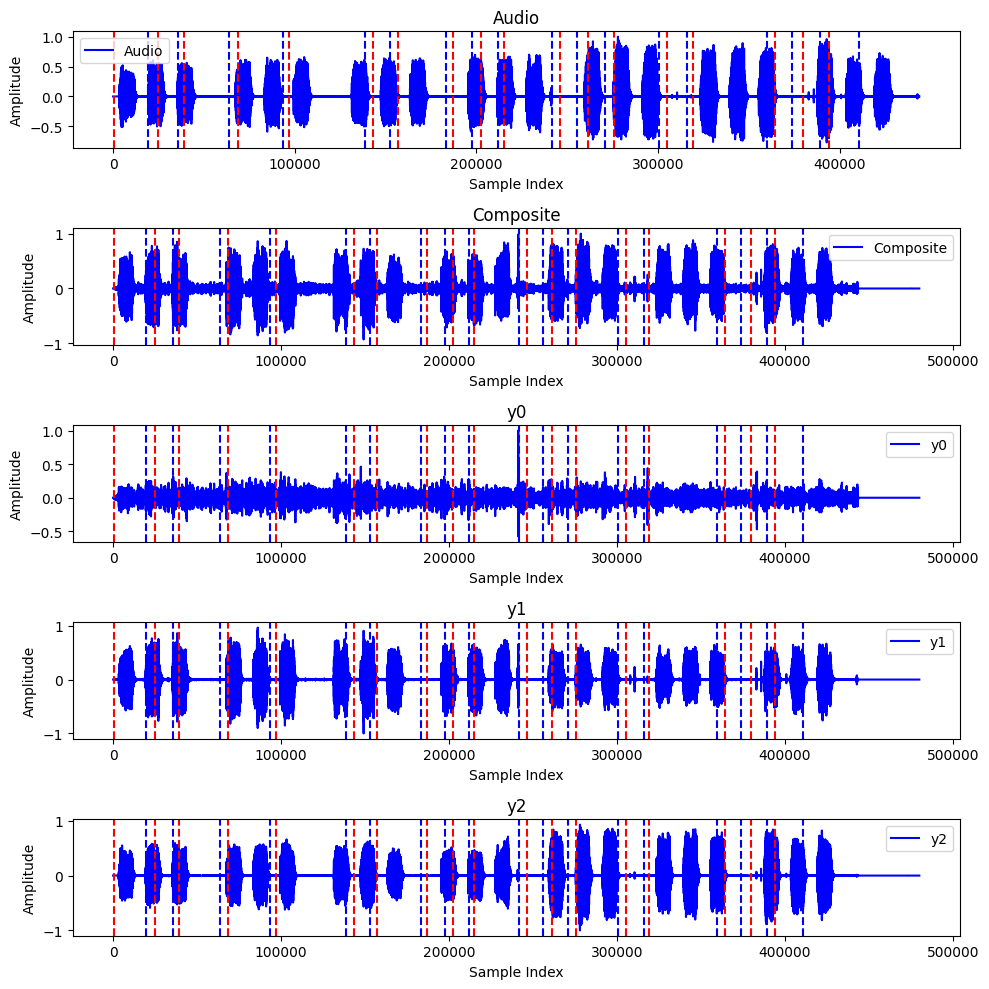

<Figure size 640x480 with 0 Axes>

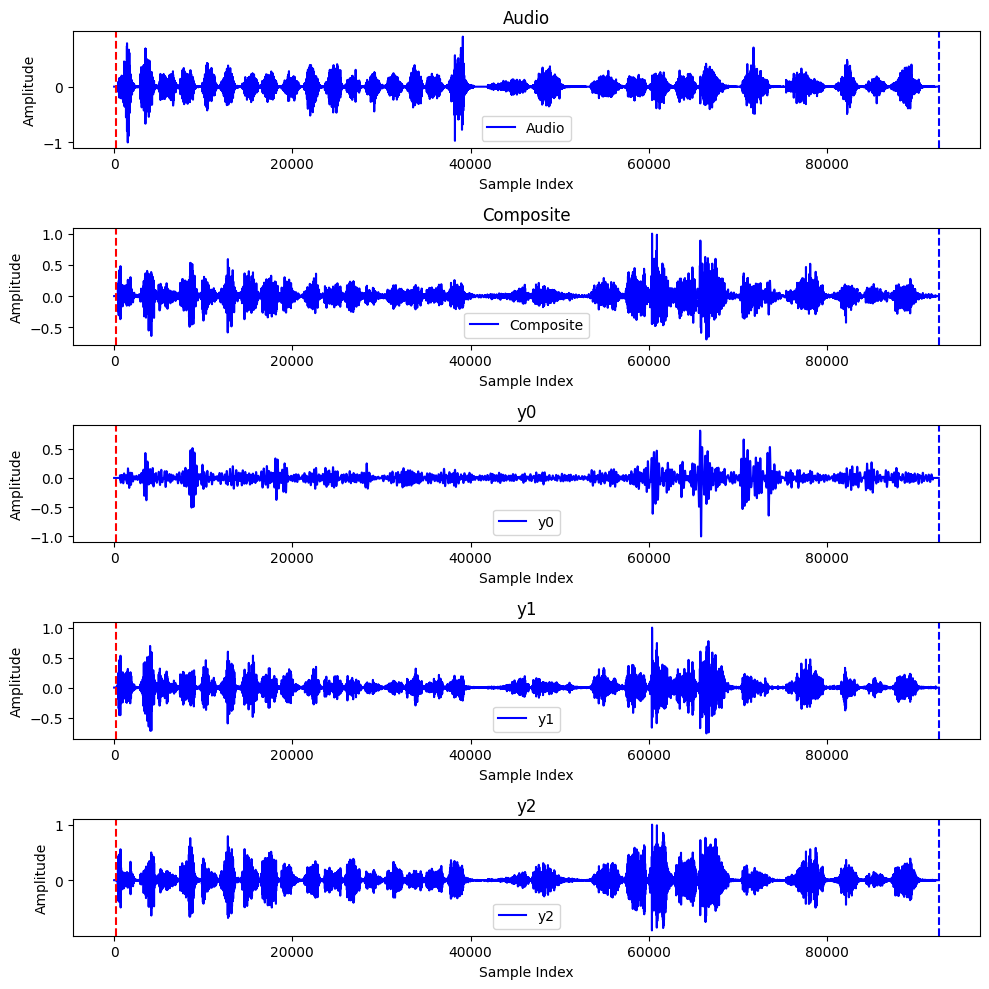

<Figure size 640x480 with 0 Axes>

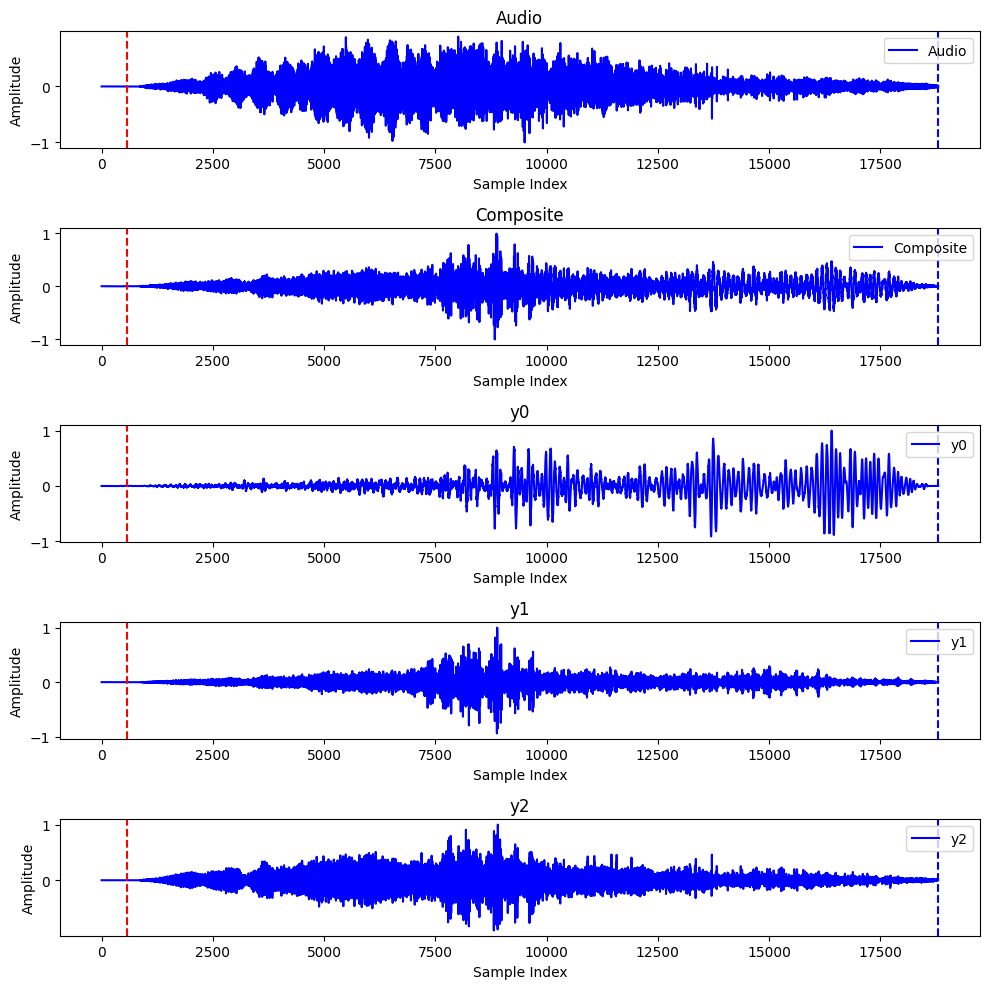

<Figure size 640x480 with 0 Axes>

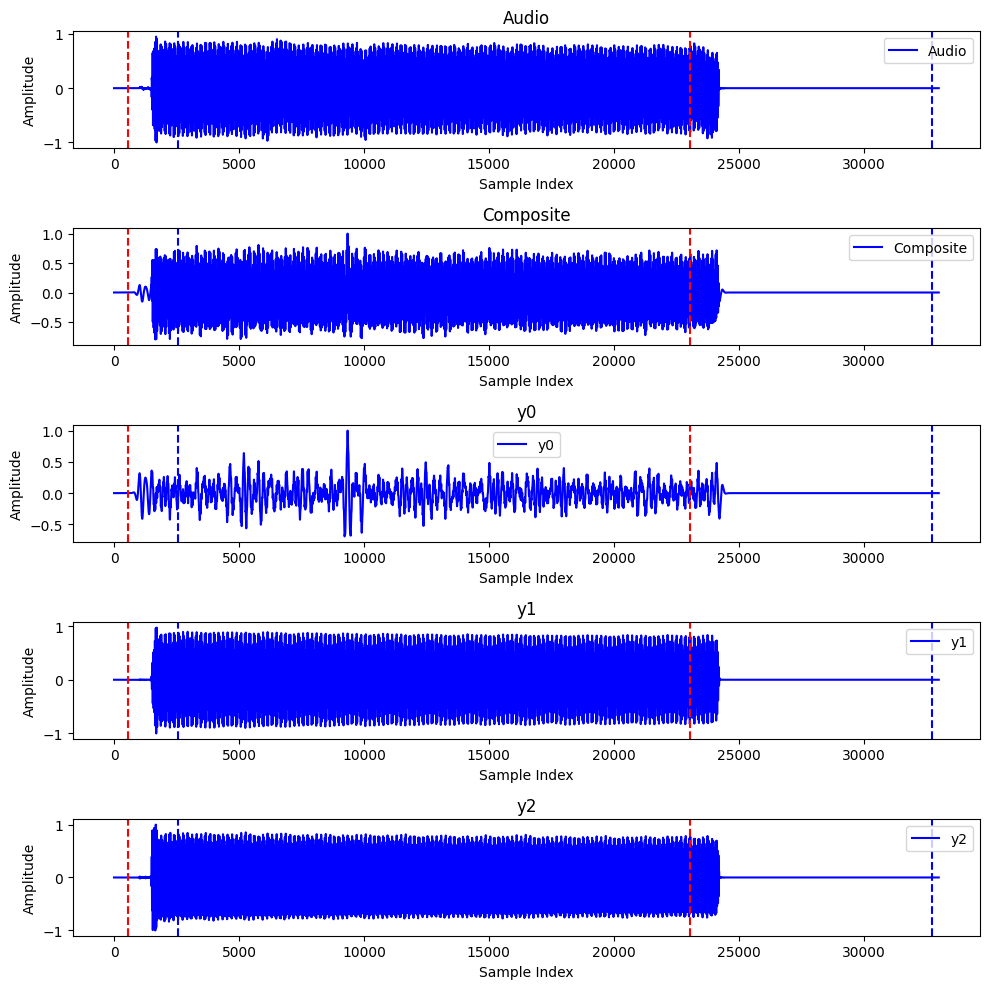

<Figure size 640x480 with 0 Axes>

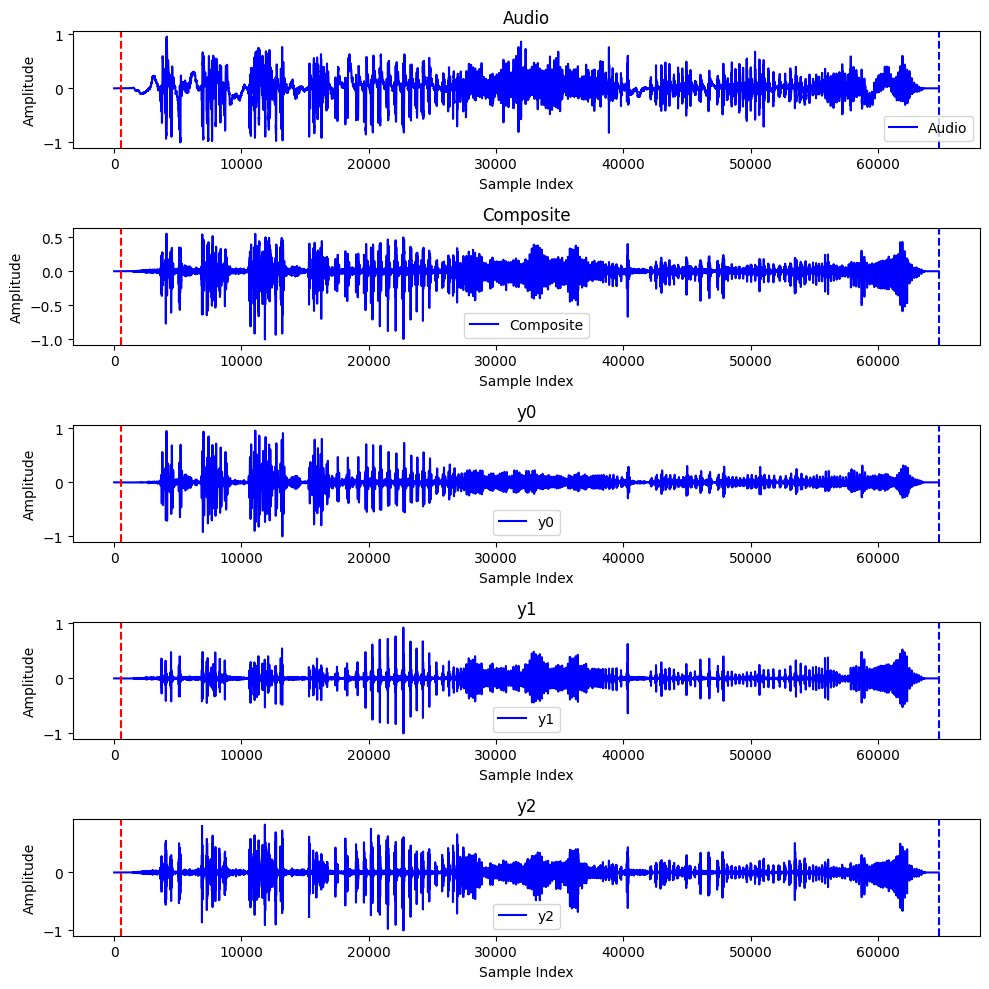

<Figure size 640x480 with 0 Axes>

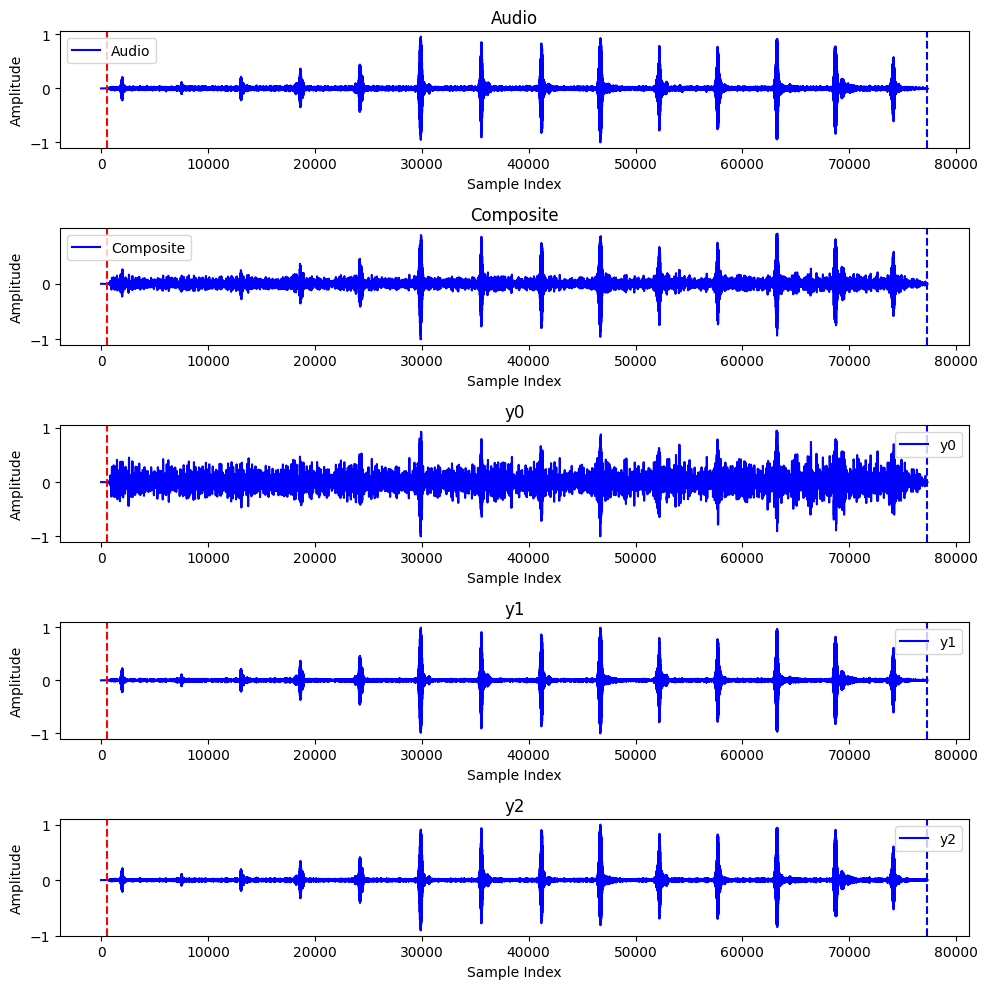

<Figure size 640x480 with 0 Axes>

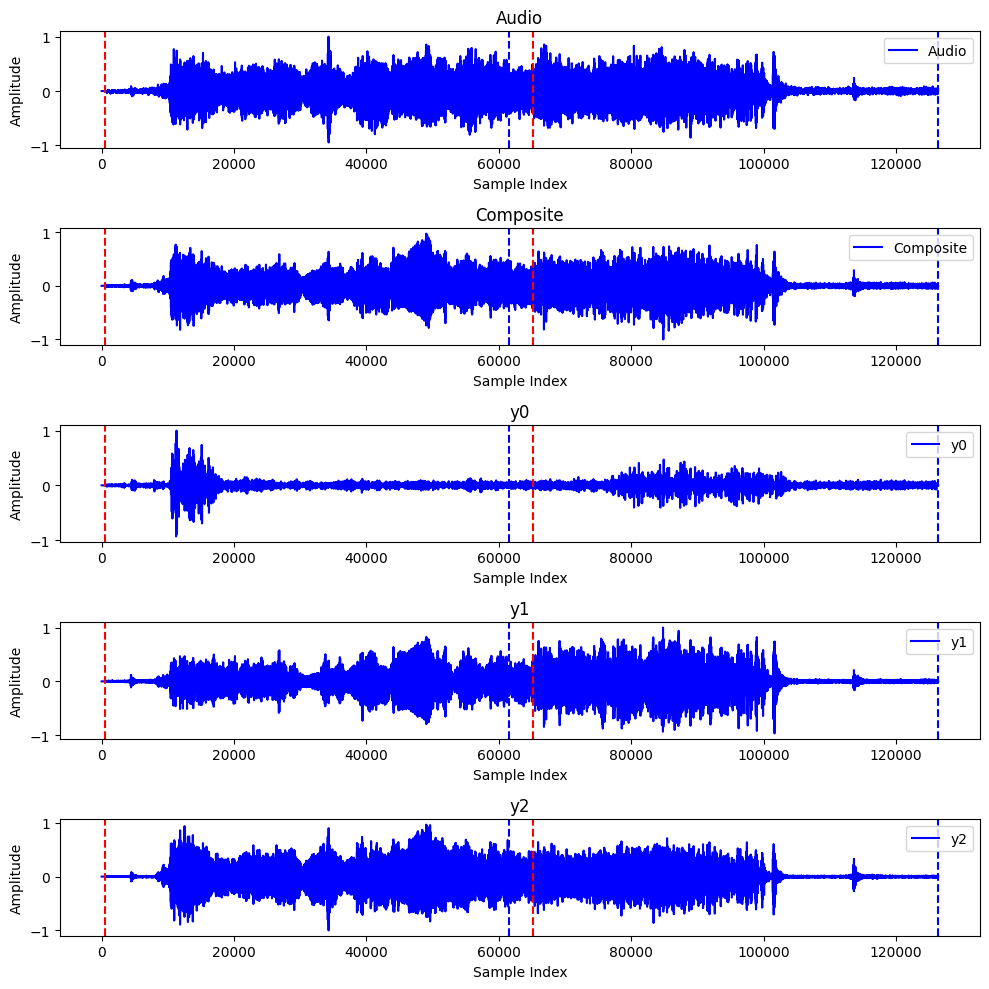

<Figure size 640x480 with 0 Axes>

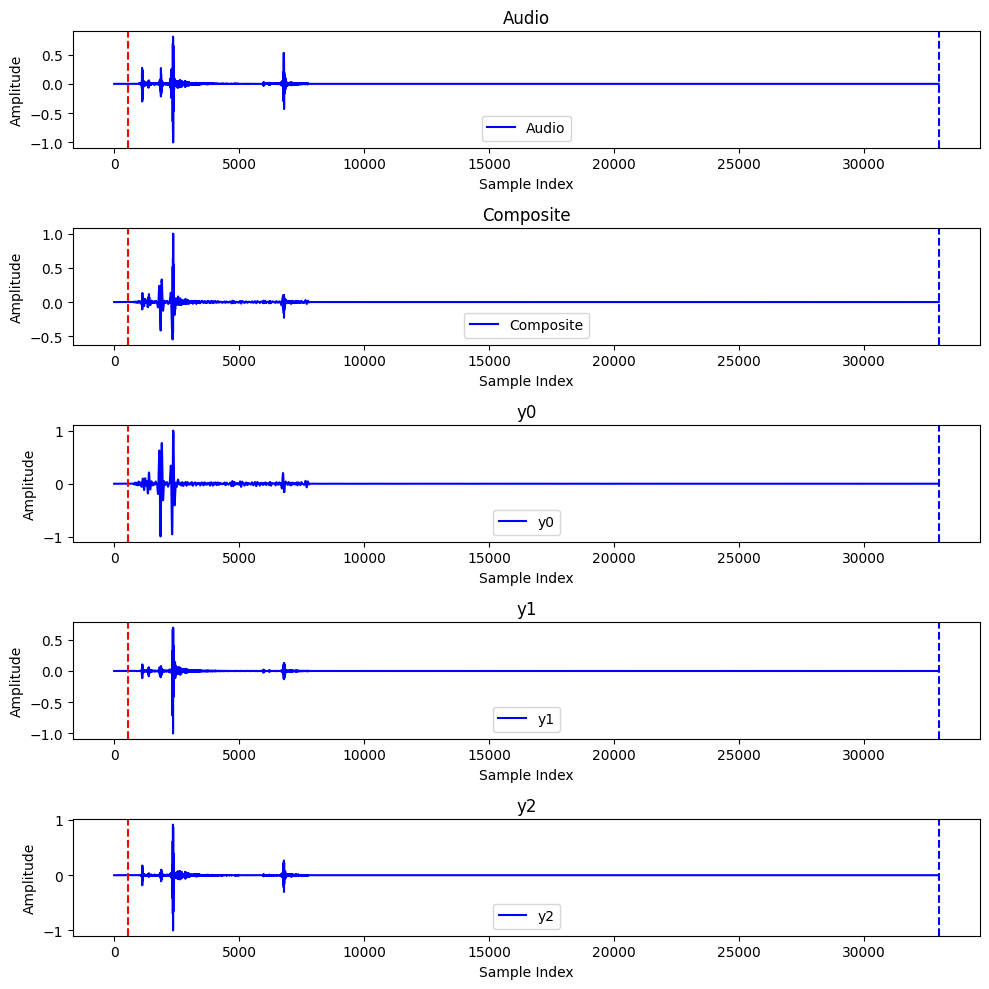

<Figure size 640x480 with 0 Axes>

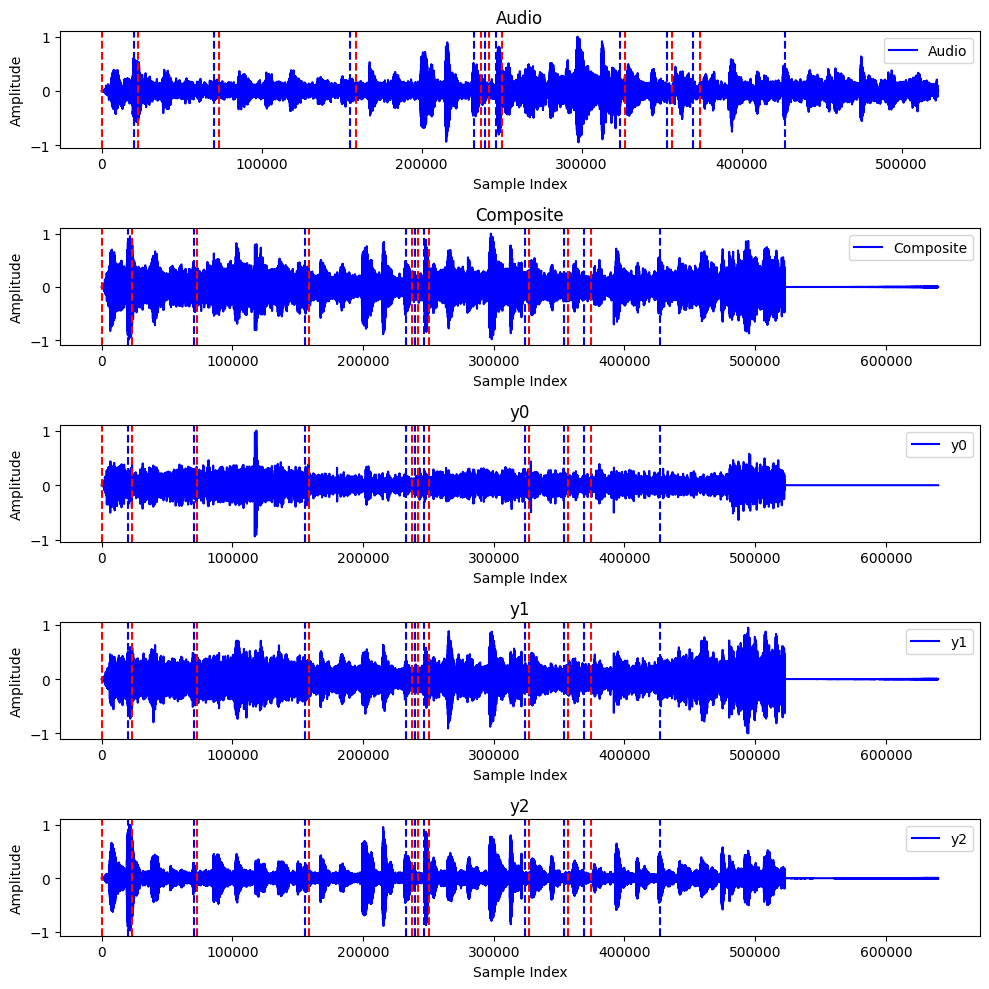

<Figure size 640x480 with 0 Axes>

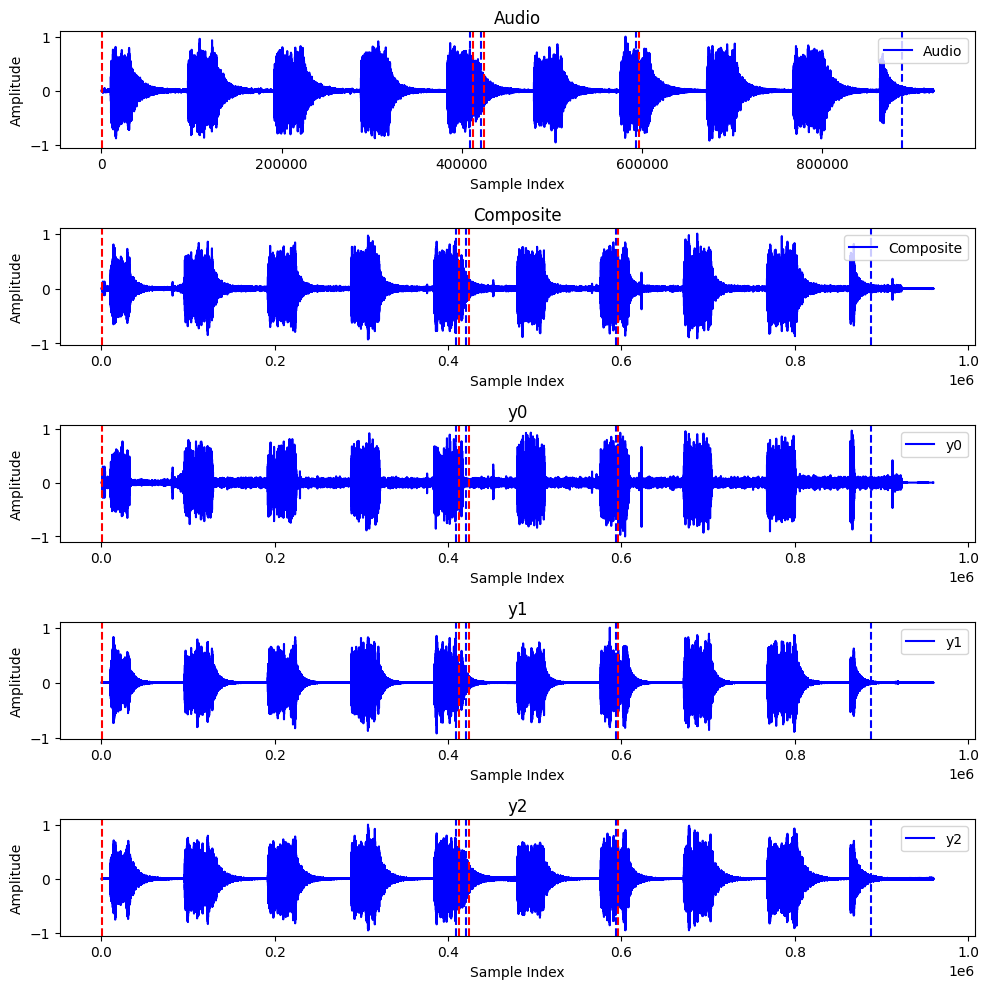

<Figure size 640x480 with 0 Axes>

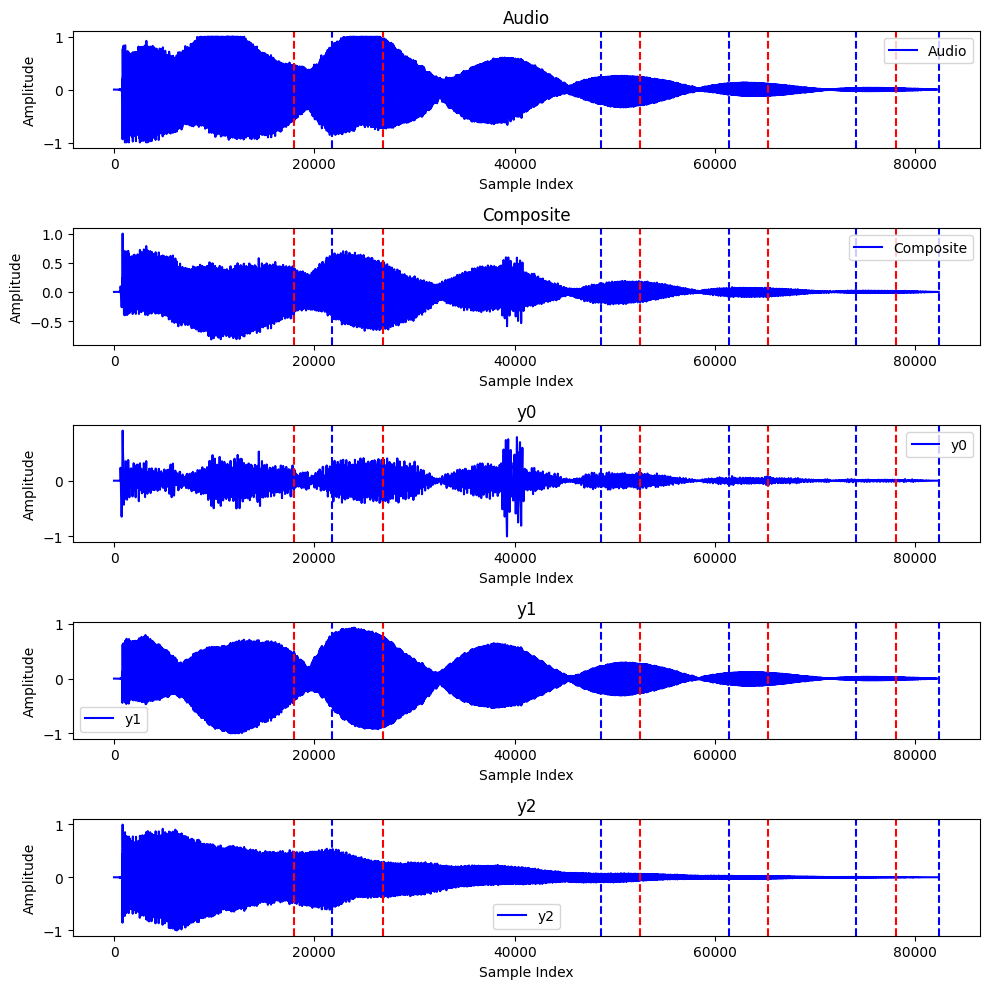

<Figure size 640x480 with 0 Axes>

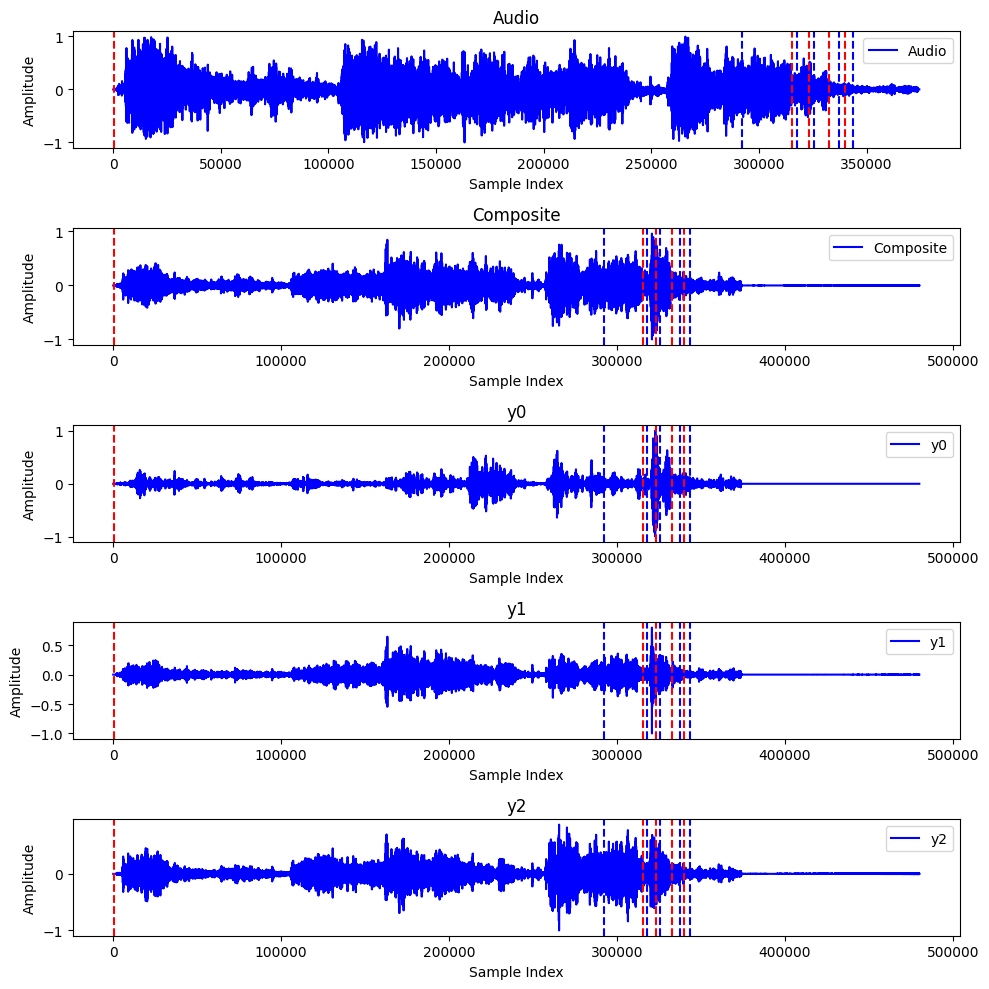

<Figure size 640x480 with 0 Axes>

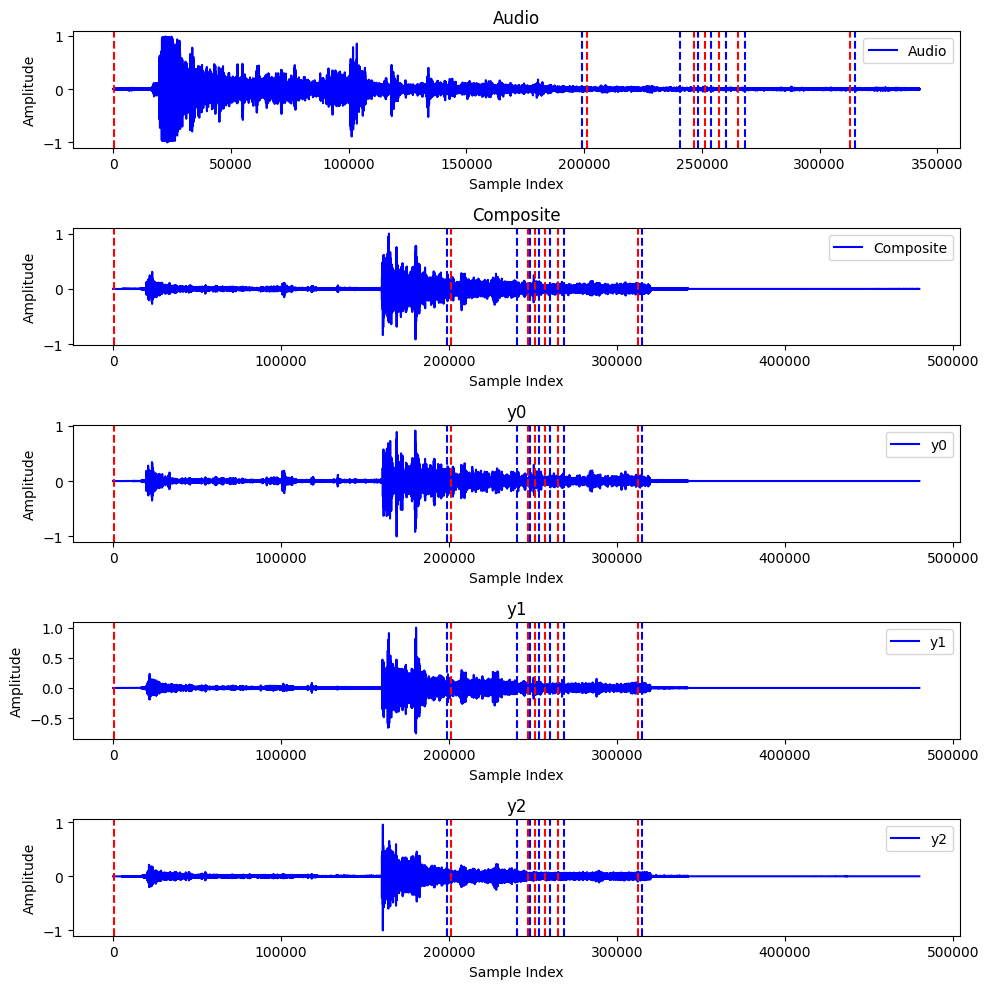

<Figure size 640x480 with 0 Axes>

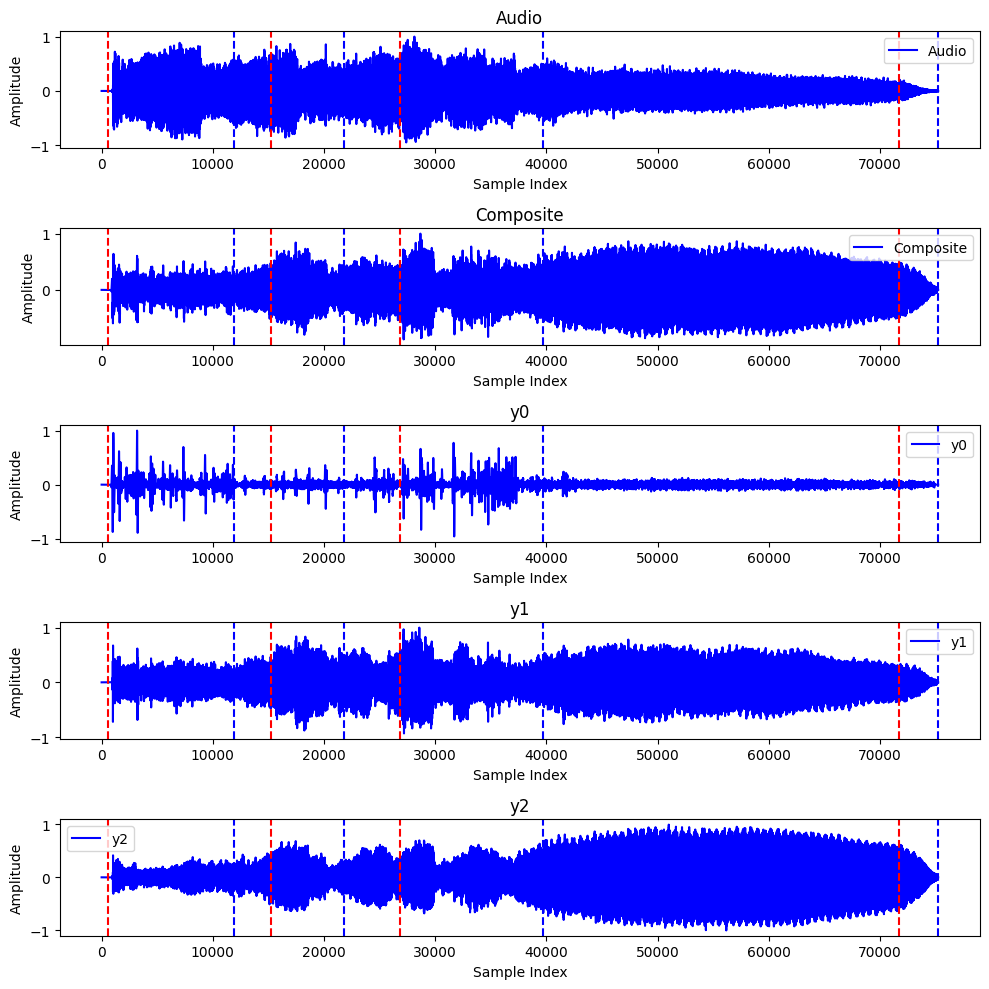

<Figure size 640x480 with 0 Axes>

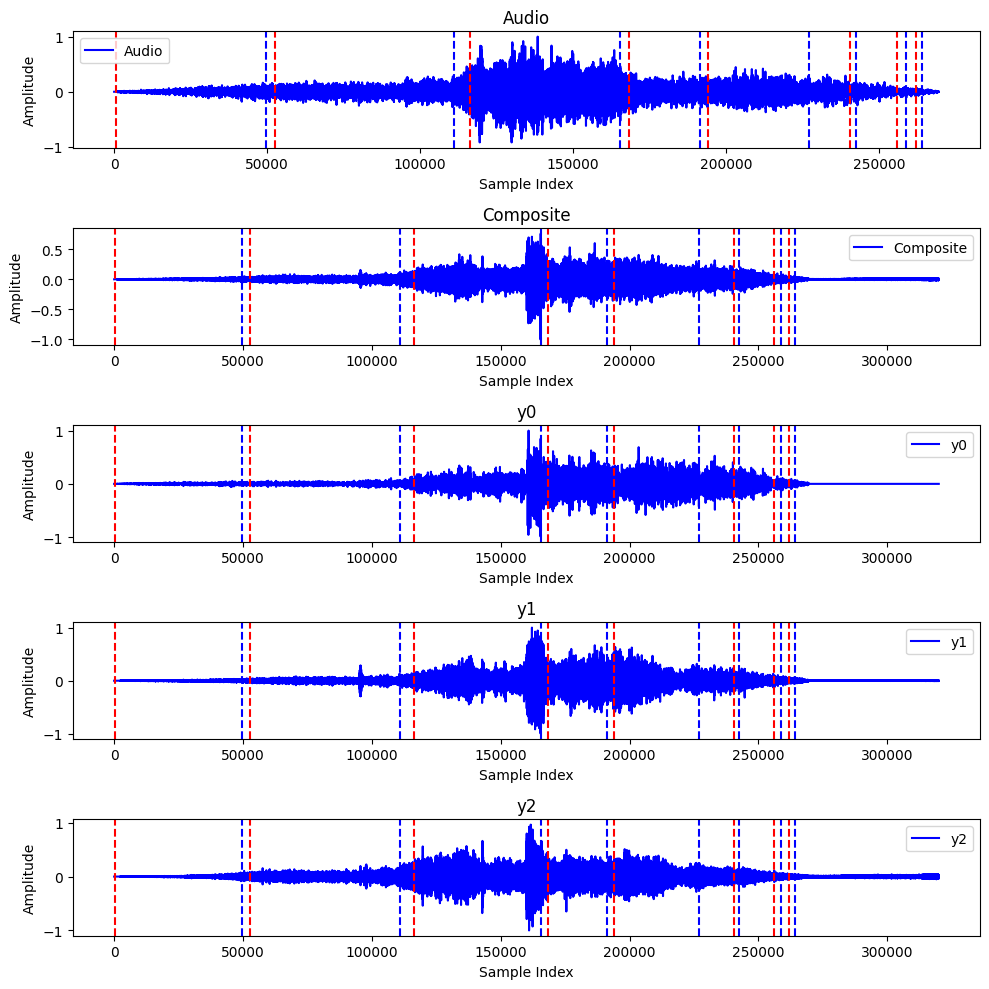

<Figure size 640x480 with 0 Axes>

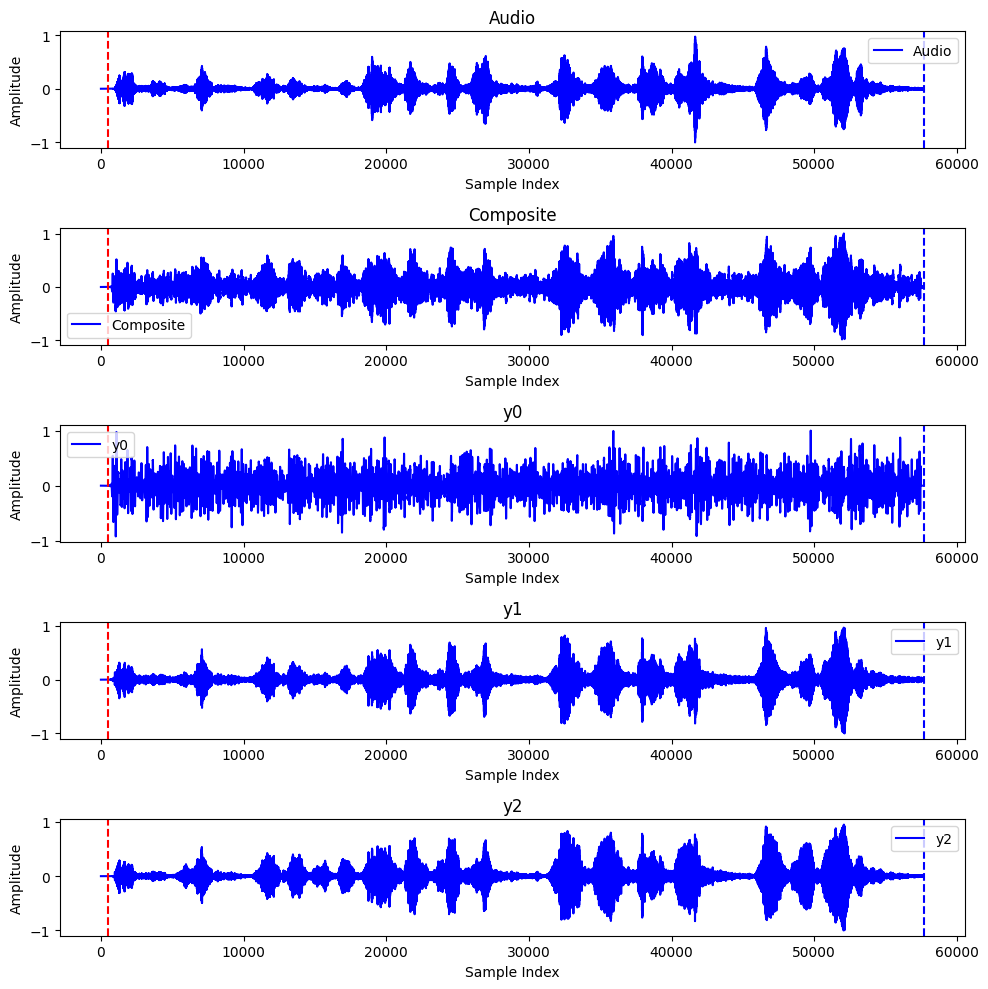

<Figure size 640x480 with 0 Axes>

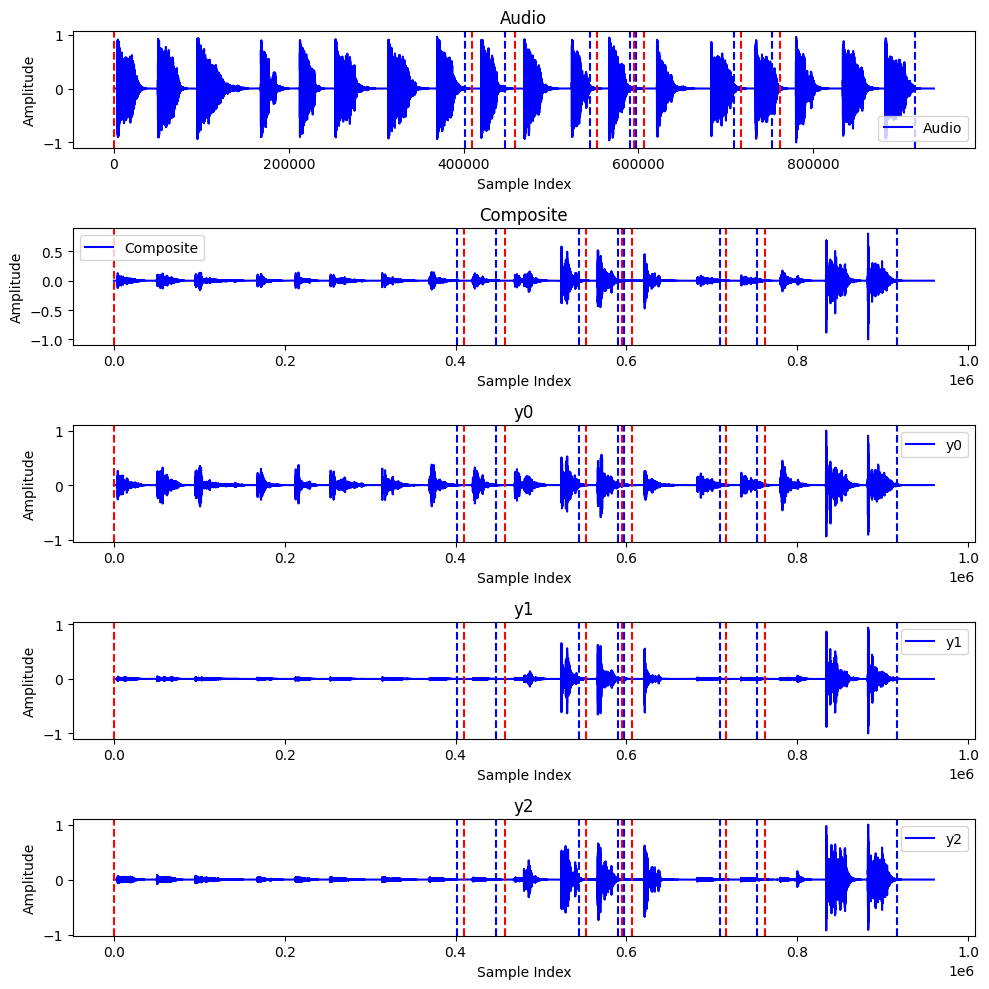

<Figure size 640x480 with 0 Axes>

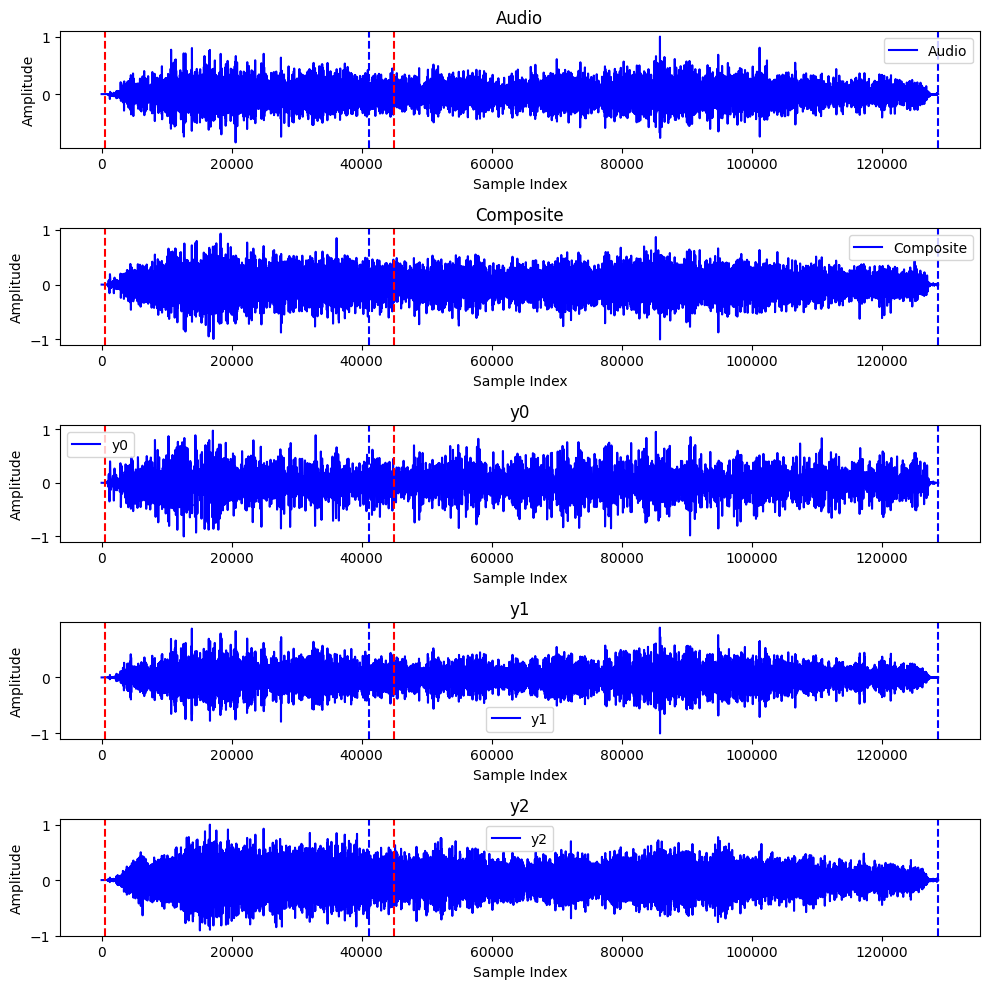

<Figure size 640x480 with 0 Axes>

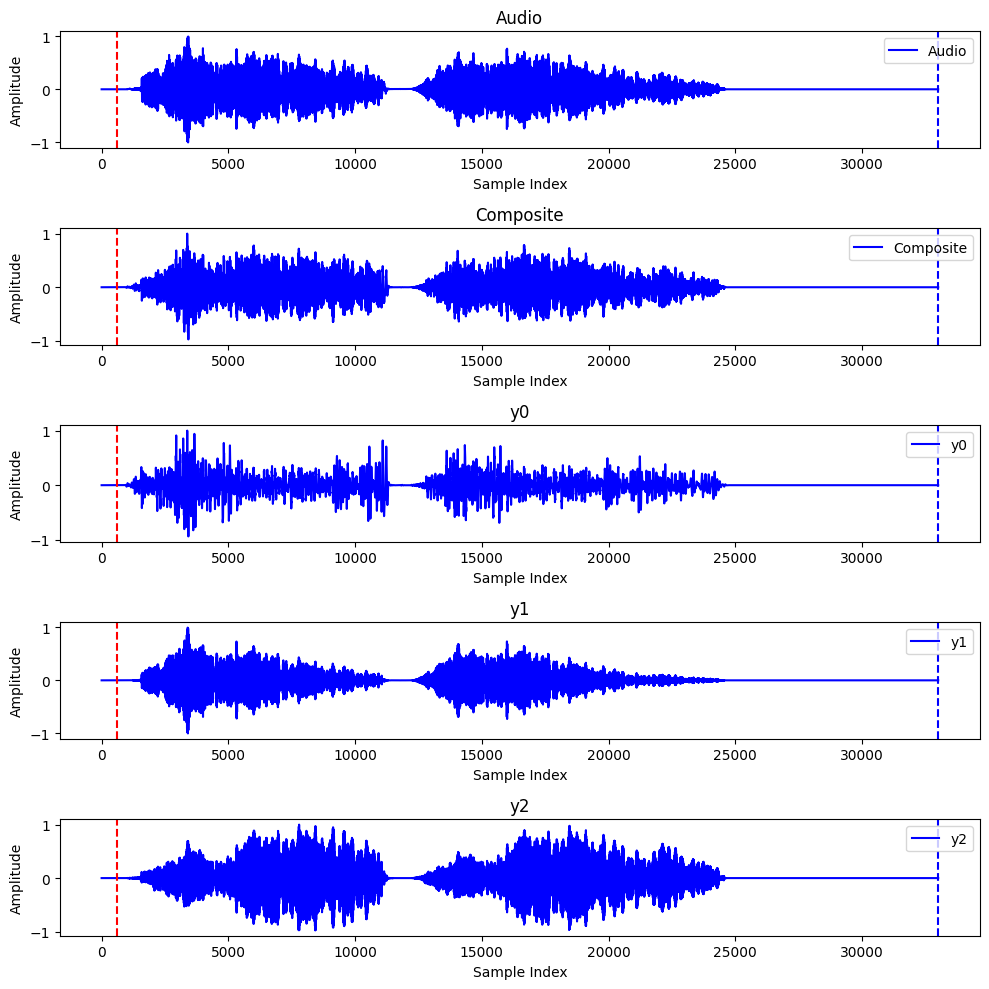

<Figure size 640x480 with 0 Axes>

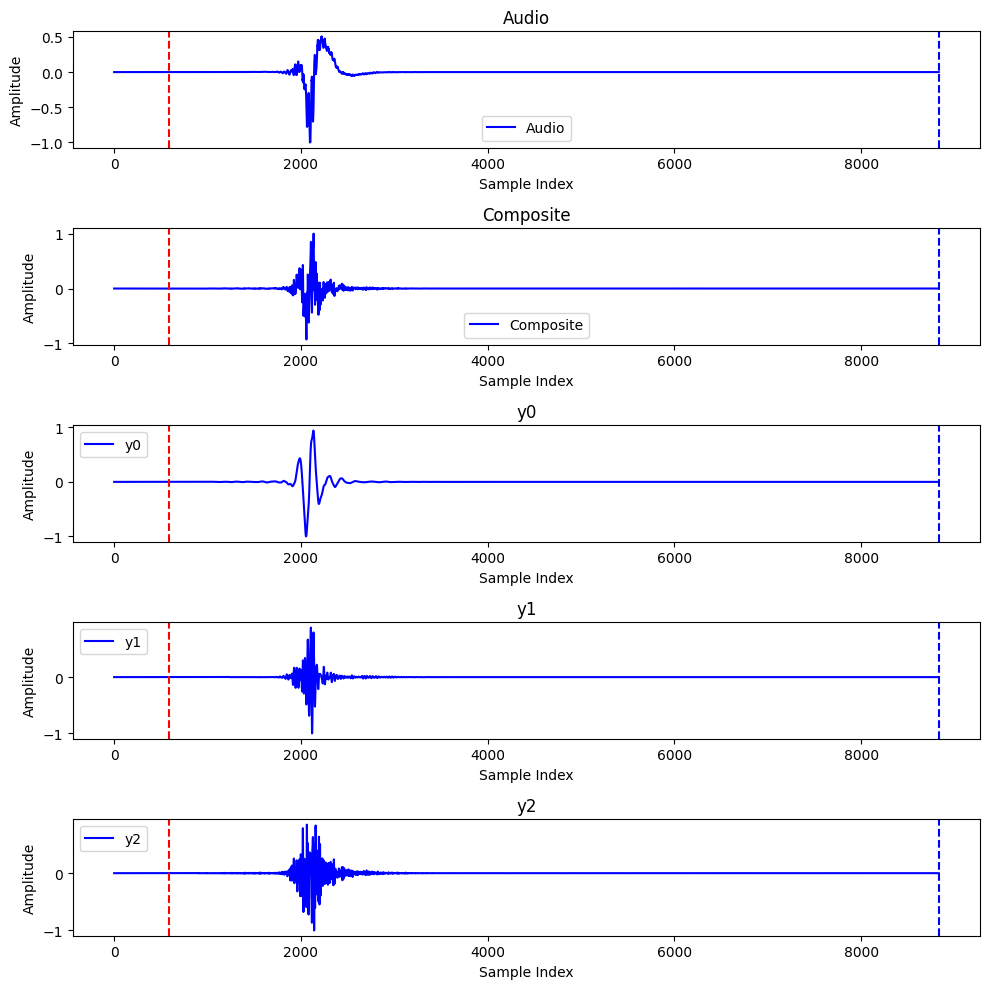

<Figure size 640x480 with 0 Axes>

In [157]:
plot_segments(segment_list, segment_list, signal_array, signal_list)

In [155]:
def plot_gcis(segment_array, segment_list, signal_array, signal_list):

    for j in range(len(signal_array)):
        audio_name = list(signal_array)[j]
        fs, audio = load_audio(os.path.join(audio_folder, audio_name))

        composite, y0, y1, y2, gcis = signal_array[audio_name]

        plt.plot(gcis)
        plt.title('GCIs')
        plt.xlabel('Sample Index')
        plt.ylabel('GCIs')
        plt.title(f"GCIs for {audio_name}")

        if not os.path.exists('gci_plots'):
            os.makedirs('gci_plots')
        plt.savefig('gci_plots/audio{}.png'.format(j+1))
        plt.clf()

In [156]:
plot_gcis(segment_list, segment_list, signal_array, signal_list)

<Figure size 640x480 with 0 Axes>

**END OF PROJECT**